This project was originally done in April 2022 and was originally a group project by the three of us:
- [Iris Lew](https://www.linkedin.com/in/iris-lew/)
- [Rebecca Sun](https://www.linkedin.com/in/rebeccasun3/)
- [Ben Meier](https://www.linkedin.com/in/meierbenjamin/)

We were tasked to do an exploratory data analysis (EDA). While the overall structure and some of the analysis is the same, I've redone the writeup, code, and updated the analysis in October-December 2022. In June 2024, I added in the regression discontinuity design for additional analysis.

# LA Traffic Collisions EDA

We were interested in the examining whether Los Angeles's Vision Zero project could be considered a success. LA is infamous for its traffic and bad drivers. In 2015, Mayor Eric Garcetti wanted to end all traffic related deaths. [“Vision Zero is a strategy to eliminate all traffic fatalities and severe injuries, while increasing safe, healthy, equitable mobility for all.”](https://visionzeronetwork.org/about/what-is-vision-zero/) There are different sources of its goals on whether it is by 2025 in LA in general (source by [lacity.gov](https://lacity.gov/highlights/take-vision-zero-pledge-create-safer-streets)) or if it is only in unincorporated County roadways by 2035 (source by [pw.lacounty.gov](https://pw.lacounty.gov/visionzero/)). Our initial analysis was under the assumption that it is by 2025 and in LA in general, so I will continue with that.

To analyze LA Traffic Collisions and possible effects under Vision Zero, I downloaded the data from [LA City's public datasets](https://data.lacity.org/Public-Safety/Traffic-Collision-Data-from-2010-to-Present/d5tf-ez2w). The data I had originally downloaded was from 2022-03-26 at 11:57 PDT.

## Setup

I set up the necessary libraries to import the data, do the analysis, and create plots.

In [1]:
### delete when done
import os
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
%cd /content/gdrive/MyDrive/

Mounted at /content/gdrive
/content/gdrive/MyDrive


In [2]:
!pip install rdrobust

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 44.4 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.8.0
    Uninstalling matplotlib-3.8.0:
      Successfully uninstalled matplotlib-3.8.0


In [3]:
# Import modules
from copy import deepcopy
from matplotlib import ticker

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime

import folium
from IPython.display import HTML
from folium.plugins import HeatMap

pd.set_option('display.max_columns', None)

from pandas.tseries.holiday import USFederalHolidayCalendar as calendar

from rdrobust import rdrobust, rdbwselect, rdplot

In [4]:
filename = r'Traffic_Collision_Data_from_2010_to_Present.csv'
dat = pd.read_csv(filename)

dat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 572594 entries, 0 to 572593
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   DR Number               572594 non-null  int64  
 1   Date Reported           572594 non-null  object 
 2   Date Occurred           572594 non-null  object 
 3   Time Occurred           572594 non-null  int64  
 4   Area ID                 572594 non-null  int64  
 5   Area Name               572594 non-null  object 
 6   Reporting District      572594 non-null  int64  
 7   Crime Code              572594 non-null  int64  
 8   Crime Code Description  572594 non-null  object 
 9   MO Codes                485596 non-null  object 
 10  Victim Age              489109 non-null  float64
 11  Victim Sex              563393 non-null  object 
 12  Victim Descent          562496 non-null  object 
 13  Premise Code            571632 non-null  float64
 14  Premise Description 

In [5]:
dat.head()

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO Codes,Victim Age,Victim Sex,Victim Descent,Premise Code,Premise Description,Address,Cross Street,Location
0,190319651,08/24/2019,08/24/2019,450,3,Southwest,356,997,TRAFFIC COLLISION,3036 3004 3026 3101 4003,22.0,M,H,101.0,STREET,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)"
1,190319680,08/30/2019,08/30/2019,2320,3,Southwest,355,997,TRAFFIC COLLISION,3037 3006 3028 3030 3039 3101 4003,30.0,F,H,101.0,STREET,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)"
2,190413769,08/25/2019,08/25/2019,545,4,Hollenbeck,422,997,TRAFFIC COLLISION,3101 3401 3701 3006 3030,NaN,M,X,101.0,STREET,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)"
3,190127578,11/20/2019,11/20/2019,350,1,Central,128,997,TRAFFIC COLLISION,0605 3101 3401 3701 3011 3034,21.0,M,H,101.0,STREET,1ST,CENTRAL,"(34.0492, -118.2391)"
4,190319695,08/30/2019,08/30/2019,2100,3,Southwest,374,997,TRAFFIC COLLISION,0605 4025 3037 3004 3025 3101,49.0,M,B,101.0,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)"


Renaming the columns with snake casing and lower case.

In [6]:
dat.columns = dat.columns.str.replace(" ","_").str.lower()
dat.head()

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location
0,190319651,08/24/2019,08/24/2019,450,3,Southwest,356,997,TRAFFIC COLLISION,3036 3004 3026 3101 4003,22.0,M,H,101.0,STREET,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)"
1,190319680,08/30/2019,08/30/2019,2320,3,Southwest,355,997,TRAFFIC COLLISION,3037 3006 3028 3030 3039 3101 4003,30.0,F,H,101.0,STREET,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)"
2,190413769,08/25/2019,08/25/2019,545,4,Hollenbeck,422,997,TRAFFIC COLLISION,3101 3401 3701 3006 3030,NaN,M,X,101.0,STREET,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)"
3,190127578,11/20/2019,11/20/2019,350,1,Central,128,997,TRAFFIC COLLISION,0605 3101 3401 3701 3011 3034,21.0,M,H,101.0,STREET,1ST,CENTRAL,"(34.0492, -118.2391)"
4,190319695,08/30/2019,08/30/2019,2100,3,Southwest,374,997,TRAFFIC COLLISION,0605 4025 3037 3004 3025 3101,49.0,M,B,101.0,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)"


In [7]:
dat.shape

(572594, 18)

The MO Codes are 4 digit numbers, and their corresponding defintions can be found in a PDF at the same link to download the [dataset](https://data.lacity.org/Public-Safety/Traffic-Collision-Data-from-2010-to-Present/d5tf-ez2w). This PDF was converted into a UTF-8 csv file through an external software. Once it was in UTF-8, I read it in using pandas `read_csv` function like above.

I replaced the column names to be more understandable and zero-filled in the code column because the codes in the traffic collision dataset were consistently of length 4.

In [8]:
mo_codes_dict = pd.read_csv("MO_CODES_utf8.csv", header=None)
mo_codes_dict.drop(2, axis=1, inplace=True)
mo_codes_dict.columns = ["mo_code", "code_def"]

#zero fill the mo_codes so it will be a better join with the rest of the dataset.
mo_codes_dict.mo_code = mo_codes_dict.mo_code.astype(str).str.zfill(4)
mo_codes_dict.head()

,mo_code,code_def
0,0100,Suspect Impersonate
1,0101,Aid victim
2,0102,Blind
3,0103,Crippled
4,0104,Customer


## Column Exploration
In data exploration, the next step is to look at each of the individual columns. I used the data dictionary also provided in the link where I downloaded the data from. There were a few topics I could look at together: date/time, location, codes, and victim information.

* Division of Records Number
    * dr_number
* Date/Time:
    * date_reported
    * date_occurred
    * time_occurred
* Location:
    * area_id
    * area_name
    * reporting_district
    * premise_code
    * premise_description
    * address
    * cross_street
    * location
* Code:
    * crime_code
    * crime_code_description
    * mo_codes
* Victim Information
    * victim_age
    * victim_sex
    * victim_descent

### Division of Records number

According to LA's dataset website, the `dr_number` is "Division of Records Number: Official file number made up of a 2 digit year, area ID, and 5 digits." Thus, I expect this to be unique and of a uniform length.

In [9]:
dat.dr_number.astype(str).value_counts().sort_values(ascending=False) #unique

,count
dr_number,
190319651,1
190413978,1
190514836,1
190514762,1
190514716,1
...,...
220306049,1
220505617,1
221805667,1


In [10]:
dat.dr_number.astype(str).map(len).value_counts()

,count
dr_number,
9,572594


Since this is a unique number, I will use `dr_number` **as the index and primary key.**

The definition provided by the codebook indicates that `dr_number` has some relationship with dates and the `area_id` so I decided to cross-check the column with `date_occurred`, `date_reported`, and`area_id`. I find that there are some mismatches, but there wasn't anything systematic at first glance, so it is likely a typo.

In [11]:
print(sum(dat["dr_number"].astype("str").str[:2]!=dat["date_occurred"].astype("str").str[-2:]))
print(sum(dat["dr_number"].astype("str").str[:2]!=dat["date_reported"].astype("str").str[-2:]))
dat[dat["dr_number"].astype("str").str[:2]!=dat["date_reported"].astype("str").str[-2:]].head(5)

3896
1066


,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location
7047,191613917,09/12/2018,09/12/2018,1651,16,Foothill,1651,997,TRAFFIC COLLISION,3004 3028 3030 3037 3101 3401 3701 4016,37.0,F,H,101.0,STREET,GOLDEN STATE,OSBORNE ST,"(34.2455, -118.4177)"
12817,180418940,01/07/2019,12/31/2018,1300,4,Hollenbeck,403,997,TRAFFIC COLLISION,3101 3401 3701 3004 3025 3029,34.0,M,F,101.0,STREET,GRIFFIN,MONTECITO,"(34.0953, -118.2019)"
14281,190814307,08/17/2018,08/17/2018,1135,8,West LA,827,997,TRAFFIC COLLISION,3004 3028 3030 3035 3036 3101 3401 3701 4008,28.0,M,W,101.0,STREET,BEVERLY CT,SUNSET BL,"(34.0638, -118.4703)"
18224,200405346,10/21/2019,10/21/2019,1910,4,Hollenbeck,437,997,TRAFFIC COLLISION,0605 3101 3401 3701 3009 3026 3036,53.0,M,W,101.0,STREET,2500 N SOTO ST,NaN,"(34.0748, -118.194)"
18559,190804496,10/15/2018,10/15/2018,1345,8,West LA,853,997,TRAFFIC COLLISION,3004 3026 3029 3035 3036 3104 3401 3701 4008,NaN,NaN,NaN,101.0,STREET,NATIONAL BL,OVERLAND,"(34.0445, -118.4491)"


In [12]:
dat[dat["dr_number"].astype("str").str[:2]!=dat["date_reported"].astype("str").str[-2:]].tail(5)

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location
571199,221304769,12/30/2021,12/24/2021,1250,13,Newton,1351,997,TRAFFIC COLLISION,0605 3030 4013,41.0,F,H,101.0,STREET,S GRAND AV,W VERNON AV,"(34.0038, -118.2805)"
571543,221305175,11/30/2021,11/03/2021,913,13,Newton,1321,997,TRAFFIC COLLISION,4024 0605 3030,44.0,F,H,101.0,STREET,1900 S LOS ANGELES ST,NaN,"(34.0305, -118.2636)"
571762,220404995,11/23/2021,11/22/2021,1745,4,Hollenbeck,423,997,TRAFFIC COLLISION,0605 4004 3030,41.0,M,H,101.0,STREET,1900 DALY ST,NaN,"(34.066, -118.2155)"
571772,220205290,12/25/2021,12/25/2021,425,2,Rampart,269,997,TRAFFIC COLLISION,0605 4002 3030,30.0,F,H,101.0,STREET,W 8TH ST,S BIXEL ST,"(34.0496, -118.2677)"
572572,221504449,12/07/2021,11/23/2021,648,15,N Hollywood,1581,997,TRAFFIC COLLISION,3006 3028 4026 3030 3032 3035,38.0,M,O,108.0,PARKING LOT,4300 COLDWATER CANYON AV,NaN,"(34.1482, -118.4138)"


In [13]:
print(sum(dat["dr_number"].astype("str").str[2:4].astype(int)!=dat["area_id"]))
dat[dat["dr_number"].astype("str").str[2:4].astype(int)!=dat["area_id"]].head(5)

268


,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location
1628,191611425,07/15/2019,07/14/2019,2225,9,Van Nuys,937,997,TRAFFIC COLLISION,3029 3004 3037 3026 3101 3401 3701 4009,NaN,M,X,101.0,STREET,SYLVAN ST,WOODMAN AV,"(34.1849, -118.4312)"
2444,199928602,08/07/2019,08/07/2019,1505,18,Southeast,1849,997,TRAFFIC COLLISION,0605,60.0,M,H,101.0,STREET,MONA,114TH ST,"(33.9312, -118.2308)"
2734,191318054,09/06/2019,09/06/2019,226,11,Northeast,1113,997,TRAFFIC COLLISION,0330 0906 1402 1805 1816,18.0,M,H,101.0,STREET,2300 FAIR PARK AV,NaN,"(34.1366, -118.2173)"
2942,191916198,09/08/2019,09/06/2019,1840,9,Van Nuys,955,997,TRAFFIC COLLISION,3036 3004 3602 3026 3101 3401 3701 4019,78.0,M,W,101.0,STREET,VAN NUYS BL,MAGNOLIA BL,"(34.1649, -118.4486)"
7173,191715619,11/16/2019,11/16/2019,410,15,N Hollywood,1525,997,TRAFFIC COLLISION,3006 3028 3030 3037 3101 3401 3701 4015,NaN,M,O,101.0,STREET,AGNES AV,VICTORY BL,"(34.1867, -118.3954)"


In [14]:
dat[dat["dr_number"].astype("str").str[2:4].astype(int)!=dat["area_id"]].tail(5)

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location
562948,211710998,07/29/2021,07/29/2021,412,19,Mission,1987,997,TRAFFIC COLLISION,4019 3028 3030 3006 3037 3101,NaN,M,X,101.0,STREET,SYLMAR AV,CHASE ST,"(34.225, -118.4422)"
565264,211611236,09/06/2021,09/06/2021,1400,15,N Hollywood,1591,997,TRAFFIC COLLISION,3003 3025 4026 3029 3032 3037 3103,66.0,M,H,108.0,PARKING LOT,LAUREL CANYON BL,OSBORNE ST,"(34.1325, -118.3974)"
565419,189934987,10/22/2018,10/21/2018,2240,11,Northeast,1135,997,TRAFFIC COLLISION,3101 3401 3701 3011 1300,17.0,X,X,101.0,STREET,3300 GASSEN PL,NaN,"(34.1051, -118.2313)"
571945,219923480,10/26/2021,10/25/2021,1040,14,Pacific,1494,997,TRAFFIC COLLISION,3012 3026 3035 3037 3401 3701 3103 3032 4014,52.0,M,B,101.0,STREET,WORLD WAY,CENTER WAY,"(33.9444, -118.3987)"
572532,221905785,02/15/2022,02/15/2022,1455,18,Southeast,1821,997,TRAFFIC COLLISION,3003 3025 3029 4018 3037 3101,18.0,M,H,101.0,STREET,CENTURY BL,FIGUEROA ST,"(33.9455, -118.2832)"


### Date/Time

I needed to check that the `date_reported`, `date_occurred`, and `time_occurred` columns are valid before converting them into datetime objects. I also need to validate if there are any "catch-alls" values (e.g., if there is an unknown date, it would be coded as January 1, 1900).

In [15]:
date_cols = ["date_reported","date_occurred"]
[dat[i].str[0:2].value_counts().sort_index() for i in date_cols] # Month
[dat[i].str[3:5].value_counts().sort_index() for i in date_cols] # Date
[dat[i].str[-4:].value_counts().sort_index() for i in date_cols] # Year

[date_reported
 2010    44807
 2011    45308
 2012    45374
 2013    45068
 2014    46932
 2015    52383
 2016    56531
 2017    57727
 2018    57149
 2019    56750
 2020    42355
 2021    18907
 2022     3303
 Name: count, dtype: int64,
 date_occurred
 2010    45098
 2011    45276
 2012    45408
 2013    45035
 2014    46951
 2015    52487
 2016    56532
 2017    57726
 2018    57159
 2019    56628
 2020    42371
 2021    18732
 2022     3191
 Name: count, dtype: int64]

In [16]:
dat["date_reported"].value_counts().sort_index()

,count
date_reported,
01/01/2010,86
01/01/2011,125
01/01/2012,100
01/01/2013,121
01/01/2014,107
...,...
12/31/2017,125
12/31/2018,139
12/31/2019,135


In [17]:
dat["date_occurred"].value_counts().sort_index()

,count
date_occurred,
01/01/2010,122
01/01/2011,123
01/01/2012,101
01/01/2013,117
01/01/2014,112
...,...
12/31/2017,130
12/31/2018,151
12/31/2019,134


When examining time, I see that it looks like it is in military time (as is stated in the data dictionary) and **made an assumption that the leading 0's were dropped when it was converted to CSV.** I added in the leading 0's.

In [18]:
dat["time_occurred"].value_counts()

,count
time_occurred,
1800,7853
1700,7463
1600,7319
1500,7193
1900,6727
...,...
459,2
501,2
559,1


In [19]:
dat["time_occurred"].astype(str).map(len).value_counts()

,count
time_occurred,
4,420823
3,136996
2,10333
1,4442


In [20]:
dat["time_occurred"] = dat["time_occurred"].astype(str).apply(lambda x: '0'*(4-len(str(x)))+str(x))
dat["time_occurred"]

,time_occurred
0,0450
1,2320
2,0545
3,0350
4,2100
...,...
572589,1550
572590,1608
572591,0855
572592,2200


In [21]:
dat["time_occurred"].str[0:2].value_counts().sort_index()

,count
time_occurred,
00,14775
01,13384
02,13689
03,8933
04,6449
05,7472
06,11963
07,24094
08,27111


In [22]:
dat["time_occurred"].str[-2:].value_counts().sort_index()

,count
time_occurred,
00,114711
01,2940
02,437
03,426
04,399
05,22841
06,389
07,502
08,589


In [23]:
dat["time_occurred"] = dat["time_occurred"].str[0:2]+":"+dat["time_occurred"].str[-2:]
dat["time_occurred"]

,time_occurred
0,04:50
1,23:20
2,05:45
3,03:50
4,21:00
...,...
572589,15:50
572590,16:08
572591,08:55
572592,22:00


I notice that there is a spike in the `time_occurred` whenever the minutes are a multiple of 5. This is likely because people are are used to rounding to the nearest 5 minutes and thus valid.

It looks like there aren't any invalid dates or times and thus I can convert them into datetime objects.

In [24]:
dat["dttm_occurred"] = pd.to_datetime(dat["date_occurred"]+" "+dat["time_occurred"],
                                      format = "%m/%d/%Y %H:%M",
                                      exact = True)
dat["dttm_occurred"]

,dttm_occurred
0,2019-08-24 04:50:00
1,2019-08-30 23:20:00
2,2019-08-25 05:45:00
3,2019-11-20 03:50:00
4,2019-08-30 21:00:00
...,...
572589,2022-02-18 15:50:00
572590,2022-02-11 16:08:00
572591,2022-01-27 08:55:00
572592,2022-02-05 22:00:00


In [25]:
dat["dttm_occurred"].describe()

,dttm_occurred
count,572594
mean,2015-12-01 00:23:05.696602368
min,2010-01-01 00:05:00
25%,2013-03-04 02:37:30
50%,2016-02-12 22:00:00
75%,2018-08-14 09:43:45
max,2022-03-19 10:55:00


In [26]:
dat["date_reported_dt"] = pd.to_datetime(dat["date_reported"], format = "%m/%d/%Y")
dat["date_reported_dt"]

,date_reported_dt
0,2019-08-24
1,2019-08-30
2,2019-08-25
3,2019-11-20
4,2019-08-30
...,...
572589,2022-02-18
572590,2022-02-11
572591,2022-01-27
572592,2022-02-06


I also wanted to check if there is a difference in `date_occurred` and `date_reported`. I expect most people to report an traffic collision relatively quickly, especially if there is a victim involved. **I decided that if at least one of the three victims columns is filled out, the traffic collision would have considered to have a victim. I will also assume that there is only one victim per traffic collision due to the column restrictions even though it is possible that there are multiple.**

In [27]:
dat["victim"] = ((dat["victim_age"].notna())|(dat["victim_sex"].notna())|(dat["victim_descent"].notna()))
dat["victim"].value_counts()

,count
victim,
True,566250
False,6344


In [28]:
dat["reported_occurred_diff"] = dat["date_reported_dt"].dt.date-dat["dttm_occurred"].dt.date
dat["reported_occurred_diff"].describe()

<ipython-input-28-32b8463379c7>:2: FutureWarning: The behavior of value_counts with object-dtype is deprecated. In a future version, this will *not* perform dtype inference on the resulting index. To retain the old behavior, use `result.index = result.index.infer_objects()`


,reported_occurred_diff
count,572594
unique,447
top,0 days 00:00:00
freq,406419


In [29]:
# (dat["reported_occurred_diff"].astype("int64")/86400000000000).describe()
dat["reported_occurred_diff_int"] = dat["reported_occurred_diff"].apply(lambda x:x.days)
dat["reported_occurred_diff_int"].describe()

,reported_occurred_diff_int
count,572594.000000
mean,2.359654
std,35.056450
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,3662.000000


In [30]:
dat["reported_occurred_diff_int"] = dat["reported_occurred_diff"].apply(lambda x:x.days)
dat["reported_occurred_diff_int"].describe()

,reported_occurred_diff_int
count,572594.000000
mean,2.359654
std,35.056450
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,3662.000000


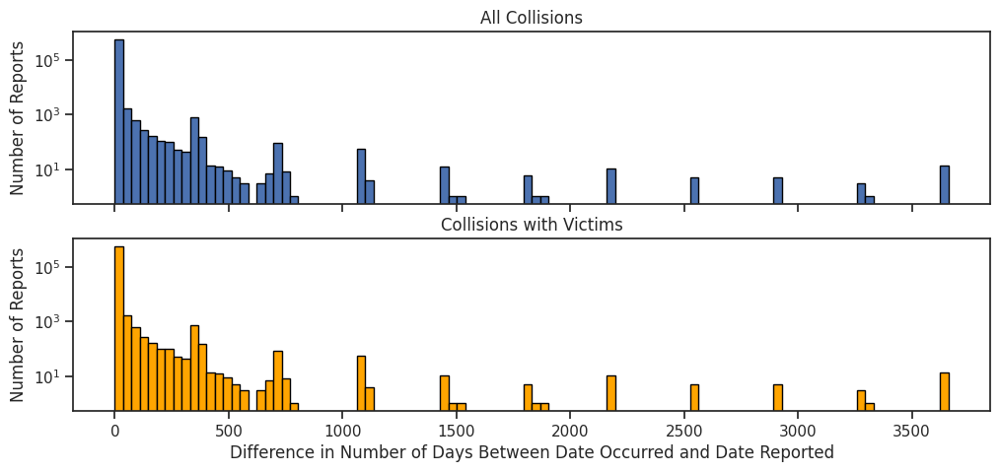

In [31]:
sns.set_theme(style="whitegrid")
sns.set_style("ticks")

figure, ax = plt.subplots(2,1, sharex=True, sharey=True, figsize=(12,5))
ax[0].hist(dat["reported_occurred_diff_int"],bins=100, edgecolor="black")
ax[0].set_yscale("log")
ax[0].set_ylabel("Number of Reports")
ax[0].set_title("All Collisions")
ax[0].grid(False)

ax[1].hist(dat[dat["victim"]]["reported_occurred_diff_int"],bins=100, edgecolor="black", color="orange")
ax[1].set_yscale("log")
ax[1].set_ylabel("Number of Reports")
ax[1].set_title("Collisions with Victims")
ax[1].set_xlabel("Difference in Number of Days Between Date Occurred and Date Reported")
ax[1].grid(False)

The DMV indicates that a report should be filed within 10 days if there were over $1,000 in property damage or someone was injured. About 2\% did not report within 10 days and 740 collisions which took more than a year to report. Additionally, if there were victims, I would expect the victims or the victims' families to report it earlier, but there was a similar pattern when there were victims and were not. Hence, I **made an assumption that these were transcription typos and that I would use the `date_occcurred` column for the analysis.**

In [32]:
(dat["reported_occurred_diff_int"]>=10).sum()/(dat["reported_occurred_diff_int"]).count()

0.022639077601232287

In [33]:
(dat["reported_occurred_diff_int"]>365).sum()

740

### Location (areas)

According to the data dictionary, the `area_id` and `area_name` are "The 21 Geographic Areas or Patrol Divisions are also given a name designation that references a landmark or the surrounding community that it is responsible for. For example 77th Street Division is located at the intersection of South Broadway and 77th Street, serving neighborhoods in South Los Angeles." As expected, I see that there is a 1:1 match from  `area_id` to `area_name`.

In [34]:
dat[["area_id","area_name"]].value_counts().sort_index()

,,count
area_id,area_name,
1,Central,23510
2,Rampart,21589
3,Southwest,33735
4,Hollenbeck,20820
5,Harbor,21573
6,Hollywood,27599
7,Wilshire,32253
8,West LA,30039
9,Van Nuys,28473


### Location (Reporting District)

The reporting district is "A code used in producing reports to group data into geographic sub-areas within an area. Find LAPD Reporting Districts on the [LA City GeoHub](http://geohub.lacity.org/datasets/c4f83909b81d4786aa8ba8a74a4b4db1_4)." They are used for organizing crimes into specific areas when reporting crime.

I downloaded the reporting district data from the [LA City Geohub](https://geohub.lacity.org/datasets/lahub::lapd-reporting-district/about).

In [35]:
dat["reporting_district"].value_counts().sort_index()

,count
reporting_district,
100,4
101,453
105,217
109,23
111,2239
...,...
2189,827
2196,151
2197,57


In [36]:
dfrd = pd.read_csv('LAPD_Reporting_Districts.csv')

In [37]:
dfrd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1135 entries, 0 to 1134
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   FID           1135 non-null   int64  
 1   REPDIST       1135 non-null   int64  
 2   PREC          1135 non-null   int64  
 3   APREC         1135 non-null   object 
 4   BUREAU        1135 non-null   object 
 5   BASICCAR      1135 non-null   object 
 6   AREA          1135 non-null   float64
 7   PERIMETER     1135 non-null   float64
 8   SHAPE_Length  1135 non-null   float64
 9   SHAPE_Area    1135 non-null   float64
dtypes: float64(4), int64(3), object(3)
memory usage: 88.8+ KB


In [38]:
dfrd.head()

,FID,REPDIST,PREC,APREC,BUREAU,BASICCAR,AREA,PERIMETER,SHAPE_Length,SHAPE_Area
0,1,1901,19,MISSION,VALLEY BUREAU,19A1,4.367178e+07,31946.355664,0.099163,0.000397
1,2,1705,17,DEVONSHIRE,VALLEY BUREAU,17A35,1.098543e+08,48888.592747,0.148847,0.001000
2,3,1902,19,MISSION,VALLEY BUREAU,19A7,3.353075e+07,26849.358596,0.081961,0.000305
3,4,1903,19,MISSION,VALLEY BUREAU,19A7,1.082610e+07,14488.784549,0.045659,0.000099
4,5,1904,19,MISSION,VALLEY BUREAU,19A7,1.730524e+07,20025.544413,0.061883,0.000157


In [39]:
dfrd["REPDIST"].value_counts().sort_index()

,count
REPDIST,
101,1
105,1
109,1
111,1
112,1
...,...
2189,1
2196,1
2197,1


In [40]:
dfrd["REPDIST"].value_counts()

,count
REPDIST,
1901,1
319,1
305,1
307,1
892,1
...,...
998,1
1105,1
991,1


`REPDIST` in this new data frame is also unique so it seems suitable that I use the `REPDIST` column as the foreign key in order to merge the data. I find that they are both numeric columns and judging by their abbreviation, should be the same item.

Thus, I needed to see if there are any reporting districts in the original data frame which aren't found in this reporting district data.

In [41]:
dat[~dat["reporting_district"].isin(dfrd["REPDIST"])]["reporting_district"].value_counts()

,count
reporting_district,
665,617
1800,112
1942,110
1400,98
500,56
...,...
609,1
696,1
1564,1


There are 197 reporting districts which aren't in the new reporting district data I found. There also does not seem to be an even distribution of vehicle collisions in those reporting districts that are not found. Thus, I can use the reporting district columns, but if I do, I will be interpreting the results with caution.

In [42]:
dfrd.columns = ["rd_"+ col.lower() for col in dfrd.columns]
dfrd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1135 entries, 0 to 1134
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   rd_fid           1135 non-null   int64  
 1   rd_repdist       1135 non-null   int64  
 2   rd_prec          1135 non-null   int64  
 3   rd_aprec         1135 non-null   object 
 4   rd_bureau        1135 non-null   object 
 5   rd_basiccar      1135 non-null   object 
 6   rd_area          1135 non-null   float64
 7   rd_perimeter     1135 non-null   float64
 8   rd_shape_length  1135 non-null   float64
 9   rd_shape_area    1135 non-null   float64
dtypes: float64(4), int64(3), object(3)
memory usage: 88.8+ KB


In [43]:
df_rd = pd.merge(dat, dfrd, how="left", left_on="reporting_district", right_on="rd_repdist")

In [44]:
df_rd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 572594 entries, 0 to 572593
Data columns (total 33 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   dr_number                   572594 non-null  int64         
 1   date_reported               572594 non-null  object        
 2   date_occurred               572594 non-null  object        
 3   time_occurred               572594 non-null  object        
 4   area_id                     572594 non-null  int64         
 5   area_name                   572594 non-null  object        
 6   reporting_district          572594 non-null  int64         
 7   crime_code                  572594 non-null  int64         
 8   crime_code_description      572594 non-null  object        
 9   mo_codes                    485596 non-null  object        
 10  victim_age                  489109 non-null  float64       
 11  victim_sex                  563393 non-

In [45]:
df_rd[df_rd["rd_repdist"].isna()]["reporting_district"].value_counts()

,count
reporting_district,
665,617
1800,112
1942,110
1400,98
500,56
...,...
609,1
696,1
1564,1


### Location (Premise)

Now, checking  by `premise_code` and `premise_description`.
* There is a 1:1 match except for `premise_code` 418 which has no description. When I examine the location by longitude and latitude coordinates, I find that other `premise_code`s in the same location are "street", "alley", and "parking lot".
* Most collisions occur on streets, parking lots, and sidewalks. There is a factor of 10 difference among the top 3.

In [46]:
df_rd[["premise_code","premise_description"]].value_counts()

,,count
premise_code,premise_description,
101.0,STREET,545362
108.0,PARKING LOT,18062
102.0,SIDEWALK,3108
103.0,ALLEY,1022
104.0,DRIVEWAY,986
...,...,...
405.0,CLOTHING STORE,1
407.0,HARDWARE/BUILDING SUPPLY,1
408.0,AUTO SUPPLY STORE*,1


In [47]:
df_rd["premise_code"].value_counts()

,count
premise_code,
101.0,545362
108.0,18062
102.0,3108
103.0,1022
104.0,986
...,...
706.0,1
405.0,1
251.0,1


In [48]:
df_rd["premise_description"].value_counts()

,count
premise_description,
STREET,545362
PARKING LOT,18062
SIDEWALK,3108
ALLEY,1022
DRIVEWAY,986
...,...
AUTO SUPPLY STORE*,1
BOWLING ALLEY*,1
REDLINE SUBWAY PLATFORM,1


In [49]:
df_rd[(~df_rd["premise_code"].isna()) & (df_rd["premise_description"].isna())]

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area
47574,201213728,05/28/2020,05/28/2020,12:40,12,77th Street,1256,997,TRAFFIC COLLISION,1402,19.0,X,X,418.0,NaN,600 W FLORENCE AV,NaN,"(33.9747, -118.2838)",2020-05-28 12:40:00,2020-05-28,True,0:00:00,0,932.0,1256.0,12.0,77TH STREET,SOUTH BUREAU,12A57,5.732625e+06,10915.327085,0.034439,0.000052


In [50]:
df_rd[df_rd["location"]=="(33.9747, -118.2838)"][["premise_code","premise_description"]].value_counts()

,,count
premise_code,premise_description,
101.0,STREET,51
108.0,PARKING LOT,4
103.0,ALLEY,2


In [51]:
df_rd[df_rd["location"]=="(33.9747, -118.2838)"]

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area
7835,201210862,04/13/2020,04/13/2020,19:15,12,77th Street,1249,997,TRAFFIC COLLISION,4012 3037 3004 3028 3030 3101,45.0,F,H,NaN,NaN,00,NaN,"(33.9747, -118.2838)",2020-04-13 19:15:00,2020-04-13,True,0:00:00,0,915.0,1249.0,12.0,77TH STREET,SOUTH BUREAU,12A49,5.989014e+06,10159.599780,0.030060,0.000054
9462,191222846,09/02/2019,09/01/2019,13:30,12,77th Street,1256,997,TRAFFIC COLLISION,0605,31.0,F,H,101.0,STREET,FLORENCE AV,DENVER AV,"(33.9747, -118.2838)",2019-09-01 13:30:00,2019-09-02,True,"1 day, 0:00:00",1,932.0,1256.0,12.0,77TH STREET,SOUTH BUREAU,12A57,5.732625e+06,10915.327085,0.034439,0.000052
19166,201218671,07/26/2020,07/25/2020,09:40,12,77th Street,1256,997,TRAFFIC COLLISION,NaN,28.0,M,H,101.0,STREET,W FLORENCE AV,DENVER AV,"(33.9747, -118.2838)",2020-07-25 09:40:00,2020-07-26,True,"1 day, 0:00:00",1,932.0,1256.0,12.0,77TH STREET,SOUTH BUREAU,12A57,5.732625e+06,10915.327085,0.034439,0.000052
33160,191228863,12/13/2019,12/13/2019,01:30,12,77th Street,1256,997,TRAFFIC COLLISION,4012 3036 3006 3028 3101 0605,30.0,M,B,101.0,STREET,FLORENCE AV,DENVER AV,"(33.9747, -118.2838)",2019-12-13 01:30:00,2019-12-13,True,0:00:00,0,932.0,1256.0,12.0,77TH STREET,SOUTH BUREAU,12A57,5.732625e+06,10915.327085,0.034439,0.000052
47287,201209542,03/22/2020,03/22/2020,15:15,12,77th Street,1249,997,TRAFFIC COLLISION,4025 3036 3004 3028 3030 3101,52.0,F,B,101.0,STREET,FLORENCE AV,DENVER AV,"(33.9747, -118.2838)",2020-03-22 15:15:00,2020-03-22,True,0:00:00,0,915.0,1249.0,12.0,77TH STREET,SOUTH BUREAU,12A49,5.989014e+06,10159.599780,0.030060,0.000054
47574,201213728,05/28/2020,05/28/2020,12:40,12,77th Street,1256,997,TRAFFIC COLLISION,1402,19.0,X,X,418.0,NaN,600 W FLORENCE AV,NaN,"(33.9747, -118.2838)",2020-05-28 12:40:00,2020-05-28,True,0:00:00,0,932.0,1256.0,12.0,77TH STREET,SOUTH BUREAU,12A57,5.732625e+06,10915.327085,0.034439,0.000052
50069,201214087,06/04/2020,05/29/2020,13:05,12,77th Street,1249,997,TRAFFIC COLLISION,NaN,42.0,M,H,101.0,STREET,DENVER,FLORENCE,"(33.9747, -118.2838)",2020-05-29 13:05:00,2020-06-04,True,"6 days, 0:00:00",6,915.0,1249.0,12.0,77TH STREET,SOUTH BUREAU,12A49,5.989014e+06,10159.599780,0.030060,0.000054
67665,191213520,05/14/2019,05/13/2019,17:10,12,77th Street,1249,997,TRAFFIC COLLISION,4025 3004 3026 3029 3101,42.0,M,O,101.0,STREET,FLORENCE AV,DENVER AV,"(33.9747, -118.2838)",2019-05-13 17:10:00,2019-05-14,True,"1 day, 0:00:00",1,915.0,1249.0,12.0,77TH STREET,SOUTH BUREAU,12A49,5.989014e+06,10159.599780,0.030060,0.000054
79189,191221222,08/25/2019,08/25/2019,16:00,12,77th Street,1256,997,TRAFFIC COLLISION,4025 3037 3004 3026 3034 3101,24.0,M,H,101.0,STREET,FLORENCE AV,DENVER AV,"(33.9747, -118.2838)",2019-08-25 16:00:00,2019-08-25,True,0:00:00,0,932.0,1256.0,12.0,77TH STREET,SOUTH BUREAU,12A57,5.732625e+06,10915.327085,0.034439,0.000052
104451,101207764,02/19/2010,02/19/2010,10:40,12,77th Street,1256,997,TRAFFIC COLLISION,NaN,25.0,F,H,101.0,STREET,DENVER,FLORENCE,"(33.9747, -118.2838)",2010-02-19 10:40:00,2010-02-19,True,0:00:00,0,932.0,1256.0,12.0,77TH STREET,SOUTH BUREAU,12A57,5.732625e+06,10915.327085,0.034439,0.000052


### Address (Misc)

Now, checking  by `address`, `cross_street`, and `location`.
   * `address` has the street name (and occasionally the number). There is an address for every record. I cleaned up the white space.
   * `cross_street` has 27,280 records without a cross street. There are no corresponding records where there is an address found when there isn't a cross street. I cleaned up the white space.
   * For `location`, there are 770 records with a location of (0.0, 0.0). At first glance, these look like they occur less often in `area_id` 4. The rest look within reason and there is a location for every row. **Thus, I replaced the 770 (0,0) records with NA under the assumption that the location is invalid/non-reported.** I separated so that there is a latitude and longitude column.

In [52]:
df_rd["address"].value_counts(dropna=False)

,count
address,
WESTERN AV,7660
VENTURA BL,6859
SHERMAN WY,6819
SEPULVEDA BL,6478
VERMONT AV,6242
...,...
JENNY ST,1
REEF MALL,1
HINDRY ST,1


In [53]:
df_rd["address"].value_counts(dropna=False).sort_index()

,count
address,
0 ST,1
00,934
00 20TH AV,1
00 ANAHEIM ST,1
00 ANCHORAGE ST,1
...,...
ZONAL ST,4
ZOO,24
ZOO DR,95


In [54]:
sum(df_rd["address"].isna())

0

In [55]:
df_rd["address_clean"] = df_rd["address"].replace(r'\s+',' ', regex=True)
df_rd["address_clean"].value_counts(dropna=False).sort_index()

,count
address_clean,
0 ST,1
00,934
00 20TH AV,1
00 ANAHEIM ST,1
00 ANCHORAGE ST,1
...,...
ZONAL ST,4
ZOO,24
ZOO DR,95


In [56]:
df_rd["cross_street"].value_counts(dropna=False)

,count
cross_street,
NaN,27280
VERMONT AV,4237
FIGUEROA ST,4067
WESTERN AV,4002
SHERMAN WY,3405
...,...
CRESCENT PAR,1
HARBOR ST,1
105,1


In [57]:
df_rd[df_rd["location"].isin(df_rd[df_rd["cross_street"].isna()][["location"]])]

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area,address_clean


In [58]:
df_rd[df_rd["address"].isin(df_rd[df_rd["cross_street"].isna()][["address"]])]

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area,address_clean


In [59]:
df_rd["cross_street_clean"] = df_rd["cross_street"].replace(r'\s+',' ', regex=True)
df_rd["cross_street_clean"].value_counts(dropna=False).sort_index()

,count
cross_street_clean,
1 ST,4
1 ST ST,2
10,3
10 AV,1
10 EAST,1
...,...
ZOO DR,97
ZORADA CT,1
ZORADA DR,1


In [60]:
df_rd["location"].value_counts(dropna=False).sort_index()

,count
location,
"(0.0, 0.0)",770
"(33.3427, -118.3258)",2
"(33.7065, -118.2879)",1
"(33.7065, -118.2928)",20
"(33.7065, -118.2929)",3
...,...
"(34.3797, -118.5286)",1
"(34.5957, -118.1784)",5
"(34.6012, -118.1605)",1


In [61]:
sum(df_rd["location"].isnull())

0

In [62]:
df_rd[df_rd["location"]=="(0.0, 0.0)"]["area_id"].value_counts().sort_index()

,count
area_id,
1,18
2,9
3,34
4,9
5,23
6,17
7,29
8,50
9,52


In [63]:
df_rd["area_id"].value_counts().sort_index()

,count
area_id,
1,23510
2,21589
3,33735
4,20820
5,21573
6,27599
7,32253
8,30039
9,28473


In [64]:
df_rd["location_clean"] = df_rd["location"].replace('(0.0, 0.0)', np.nan)
df_rd["location_clean"].value_counts(dropna=False).sort_index()

,count
location_clean,
"(33.3427, -118.3258)",2
"(33.7065, -118.2879)",1
"(33.7065, -118.2928)",20
"(33.7065, -118.2929)",3
"(33.7067, -118.2879)",4
...,...
"(34.5957, -118.1784)",5
"(34.6012, -118.1605)",1
"(34.6903, -118.3053)",1


In [65]:
df_rd[["latitude", "longitude"]] = df_rd["location_clean"].str.split(",", expand=True)
# df_rd["latitude"]
df_rd["latitude"] = df_rd["latitude"].str.replace("(","", regex=False)
df_rd["longitude"] = df_rd["longitude"].str.replace(")","", regex=False)

df_rd["latitude"] = pd.to_numeric(df_rd["latitude"])
df_rd["longitude"] = pd.to_numeric(df_rd["longitude"])

df_rd.head()

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area,address_clean,cross_street_clean,location_clean,latitude,longitude
0,190319651,08/24/2019,08/24/2019,04:50,3,Southwest,356,997,TRAFFIC COLLISION,3036 3004 3026 3101 4003,22.0,M,H,101.0,STREET,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)",2019-08-24 04:50:00,2019-08-24,True,0:00:00,0,808.0,356.0,3.0,SOUTHWEST,SOUTH BUREAU,3A55,7.018806e+06,10591.266020,0.032011,0.000064,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)",34.0255,-118.3002
1,190319680,08/30/2019,08/30/2019,23:20,3,Southwest,355,997,TRAFFIC COLLISION,3037 3006 3028 3030 3039 3101 4003,30.0,F,H,101.0,STREET,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)",2019-08-30 23:20:00,2019-08-30,True,0:00:00,0,807.0,355.0,3.0,SOUTHWEST,SOUTH BUREAU,3A55,7.072090e+06,10823.145761,0.032805,0.000064,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)",34.0256,-118.3089
2,190413769,08/25/2019,08/25/2019,05:45,4,Hollenbeck,422,997,TRAFFIC COLLISION,3101 3401 3701 3006 3030,NaN,M,X,101.0,STREET,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)",2019-08-25 05:45:00,2019-08-25,True,0:00:00,0,566.0,422.0,4.0,HOLLENBECK,CENTRAL BUREAU,4A15,7.004384e+06,10750.107952,0.033034,0.000064,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)",34.0738,-118.2078
3,190127578,11/20/2019,11/20/2019,03:50,1,Central,128,997,TRAFFIC COLLISION,0605 3101 3401 3701 3011 3034,21.0,M,H,101.0,STREET,1ST,CENTRAL,"(34.0492, -118.2391)",2019-11-20 03:50:00,2019-11-20,True,0:00:00,0,1070.0,128.0,1.0,CENTRAL,CENTRAL BUREAU,1A29,1.534550e+06,6220.695545,0.018408,0.000014,1ST,CENTRAL,"(34.0492, -118.2391)",34.0492,-118.2391
4,190319695,08/30/2019,08/30/2019,21:00,3,Southwest,374,997,TRAFFIC COLLISION,0605 4025 3037 3004 3025 3101,49.0,M,B,101.0,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)",2019-08-30 21:00:00,2019-08-30,True,0:00:00,0,829.0,374.0,3.0,SOUTHWEST,SOUTH BUREAU,3A73,8.625945e+06,12173.689427,0.036845,0.000078,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)",34.0108,-118.3182


### Crime code and description
Now, I need to check the `crime_code` and `crime_code_description`. I find that they are all 997 and "TRAFFIC COLLISION" respectively. This matches the data dictionary and I can assume that this is the filter that was applied to generate this dataset.

In [66]:
df_rd["crime_code"].value_counts()

,count
crime_code,
997,572594


In [67]:
df_rd["crime_code_description"].value_counts()

,count
crime_code_description,
TRAFFIC COLLISION,572594


Because these columns do not provide any useful information to the analysis, I decided to drop them.

In [68]:
df_rd.drop(columns=["crime_code","crime_code_description"], inplace=True)
df_rd.head()

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area,address_clean,cross_street_clean,location_clean,latitude,longitude
0,190319651,08/24/2019,08/24/2019,04:50,3,Southwest,356,3036 3004 3026 3101 4003,22.0,M,H,101.0,STREET,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)",2019-08-24 04:50:00,2019-08-24,True,0:00:00,0,808.0,356.0,3.0,SOUTHWEST,SOUTH BUREAU,3A55,7.018806e+06,10591.266020,0.032011,0.000064,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)",34.0255,-118.3002
1,190319680,08/30/2019,08/30/2019,23:20,3,Southwest,355,3037 3006 3028 3030 3039 3101 4003,30.0,F,H,101.0,STREET,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)",2019-08-30 23:20:00,2019-08-30,True,0:00:00,0,807.0,355.0,3.0,SOUTHWEST,SOUTH BUREAU,3A55,7.072090e+06,10823.145761,0.032805,0.000064,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)",34.0256,-118.3089
2,190413769,08/25/2019,08/25/2019,05:45,4,Hollenbeck,422,3101 3401 3701 3006 3030,NaN,M,X,101.0,STREET,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)",2019-08-25 05:45:00,2019-08-25,True,0:00:00,0,566.0,422.0,4.0,HOLLENBECK,CENTRAL BUREAU,4A15,7.004384e+06,10750.107952,0.033034,0.000064,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)",34.0738,-118.2078
3,190127578,11/20/2019,11/20/2019,03:50,1,Central,128,0605 3101 3401 3701 3011 3034,21.0,M,H,101.0,STREET,1ST,CENTRAL,"(34.0492, -118.2391)",2019-11-20 03:50:00,2019-11-20,True,0:00:00,0,1070.0,128.0,1.0,CENTRAL,CENTRAL BUREAU,1A29,1.534550e+06,6220.695545,0.018408,0.000014,1ST,CENTRAL,"(34.0492, -118.2391)",34.0492,-118.2391
4,190319695,08/30/2019,08/30/2019,21:00,3,Southwest,374,0605 4025 3037 3004 3025 3101,49.0,M,B,101.0,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)",2019-08-30 21:00:00,2019-08-30,True,0:00:00,0,829.0,374.0,3.0,SOUTHWEST,SOUTH BUREAU,3A73,8.625945e+06,12173.689427,0.036845,0.000078,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)",34.0108,-118.3182


### Victim Information

Now, checking  by `victim_age`, `victim_sex`, and `victim_descent` if one exists based on my prior assumptions of one victim per collision and that at least one of the victim columns is filled out.
   * Looking at `victim_age`, there are 7,400 where they are 99 years old. and there are 83,485 where they have null values. The `victim_age` has a character limit of two-characters. It is possible for a victim to be over 100 years old, but very few people live to be over 100 years old. Due to the distribution, I will **assume that 99 is a catch-all code.**
   * Regarding `victim_sex`, according to the data dictionary, F=Female, M=Male, X=Other/Unknown. I do not know what H and N correspond to though **so I will assume it is a typo and will re-code them as "Other/Unknown"**. There are also 9,201 null values.
   * For `victim_descent`, there are 2 "-" which I **assume is a miscoding and therefore will recode as "X: Unknown"** and 10,098 null values. The rest match the data dictionary.

**Victim Age**

In [69]:
df_rd[(df_rd["victim_age"].isna()) & (df_rd["victim_sex"].isna()) & (df_rd["victim_descent"].isna())]

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area,address_clean,cross_street_clean,location_clean,latitude,longitude
298,191613359,08/31/2019,08/30/2019,22:20,16,Foothill,1653,3037 3011 3024 3034 3101 3401 3701 4026,NaN,NaN,NaN,101.0,STREET,MONTAGUE ST,SAN FERNANDO RD,"(34.2512, -118.4063)",2019-08-30 22:20:00,2019-08-31,False,"1 day, 0:00:00",1,110.0,1653.0,16.0,FOOTHILL,VALLEY BUREAU,16A23,1.206978e+07,14232.469967,0.043173,0.000110,MONTAGUE ST,SAN FERNANDO RD,"(34.2512, -118.4063)",34.2512,-118.4063
841,191715008,09/07/2019,09/07/2019,11:00,17,Devonshire,1701,NaN,NaN,NaN,NaN,108.0,PARKING LOT,RINALDI ST,CORBIN AV,"(34.2748, -118.5621)",2019-09-07 11:00:00,2019-09-07,False,0:00:00,0,21.0,1701.0,17.0,DEVONSHIRE,VALLEY BUREAU,17A23,9.811502e+07,47488.979227,0.145497,0.000893,RINALDI ST,CORBIN AV,"(34.2748, -118.5621)",34.2748,-118.5621
2103,201409246,04/03/2020,04/03/2020,20:50,14,Pacific,1496,3011 3028 3034 3037 3101 3401 3701 4014,NaN,NaN,NaN,NaN,NaN,00,NaN,"(33.9474, -118.3961)",2020-04-03 20:50:00,2020-04-03,False,0:00:00,0,970.0,1496.0,14.0,PACIFIC,WEST BUREAU,14A67,3.821328e+06,8810.972220,0.027594,0.000035,00,NaN,"(33.9474, -118.3961)",33.9474,-118.3961
2199,201707954,04/05/2020,04/05/2020,05:00,17,Devonshire,1777,3011 3027 3037 3101 4026,NaN,NaN,NaN,101.0,STREET,NORDHOFF ST,GOTHIC AV,"(34.2357, -118.4895)",2020-04-05 05:00:00,2020-04-05,False,0:00:00,0,128.0,1777.0,17.0,DEVONSHIRE,VALLEY BUREAU,17A95,1.431905e+07,16189.022322,0.047816,0.000130,NORDHOFF ST,GOTHIC AV,"(34.2357, -118.4895)",34.2357,-118.4895
2999,140920716,12/24/2014,12/24/2014,04:44,9,Van Nuys,943,3011 3030 3028 3101 3401 3701 4009,NaN,NaN,NaN,101.0,STREET,5600 VAN NUYS BL,NaN,"(34.1721, -118.4485)",2014-12-24 04:44:00,2014-12-24,False,0:00:00,0,311.0,943.0,9.0,VAN NUYS,VALLEY BUREAU,9A41,1.138858e+07,13665.741465,0.040382,0.000103,5600 VAN NUYS BL,NaN,"(34.1721, -118.4485)",34.1721,-118.4485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566833,211819687,11/08/2021,11/08/2021,00:25,18,Southeast,1842,3006 3028 3039 4018,NaN,NaN,NaN,101.0,STREET,111TH ST,SAN PEDRO ST,"(33.9348, -118.2695)",2021-11-08 00:25:00,2021-11-08,False,0:00:00,0,981.0,1842.0,18.0,SOUTHEAST,SOUTH BUREAU,18A41,1.047392e+07,13164.857860,0.040525,0.000095,111TH ST,SAN PEDRO ST,"(33.9348, -118.2695)",33.9348,-118.2695
568220,210217532,11/14/2021,11/14/2021,17:00,2,Rampart,266,3033 0605 3003 3024 3035 3037 3602 3101 4024 3401,NaN,NaN,NaN,101.0,STREET,JAMES M WOOD BL,BONNIE BRAE ST,"(34.0524, -118.2766)",2021-11-14 17:00:00,2021-11-14,False,0:00:00,0,648.0,266.0,2.0,RAMPART,CENTRAL BUREAU,2A75,1.486879e+06,4883.112427,0.014780,0.000013,JAMES M WOOD BL,BONNIE BRAE ST,"(34.0524, -118.2766)",34.0524,-118.2766
570549,212018870,12/30/2021,12/29/2021,18:50,20,Olympic,2034,3006 3028 3039 4027,NaN,NaN,NaN,108.0,PARKING LOT,8TH ST,ARDMORE AV,"(34.0577, -118.302)",2021-12-29 18:50:00,2021-12-30,False,"1 day, 0:00:00",1,619.0,2034.0,20.0,OLYMPIC,WEST BUREAU,20A33,1.735182e+06,5784.417516,0.017494,0.000016,8TH ST,ARDMORE AV,"(34.0577, -118.302)",34.0577,-118.3020
571596,221004529,01/16/2022,01/16/2022,17:25,10,West Valley,1049,3011 3034 3026 3039 3037 3101 4026,NaN,NaN,NaN,101.0,STREET,BURBANK BL,BALBOA BL,"(34.1722, -118.501)",2022-01-16 17:25:00,2022-01-16,False,0:00:00,0,292.0,1049.0,10.0,WEST VALLEY,VALLEY BUREAU,10A17,7.280605e+07,35090.681340,0.106492,0.000661,BURBANK BL,BALBOA BL,"(34.1722, -118.501)",34.1722,-118.5010


In [70]:
df_rd[(df_rd["victim_age"].notna()) | (df_rd["victim_sex"].notna()) | (df_rd["victim_descent"].notna())].shape

(566250, 36)

In [71]:
# Victim age
print('Number of victim_age rows with NA:', sum(df_rd["victim_age"].isna()))
df_rd["victim_age"].value_counts().sort_index()

Number of victim_age rows with NA: 83485


,count
victim_age,
10.0,56
11.0,48
12.0,67
13.0,75
14.0,113
...,...
95.0,55
96.0,45
97.0,34


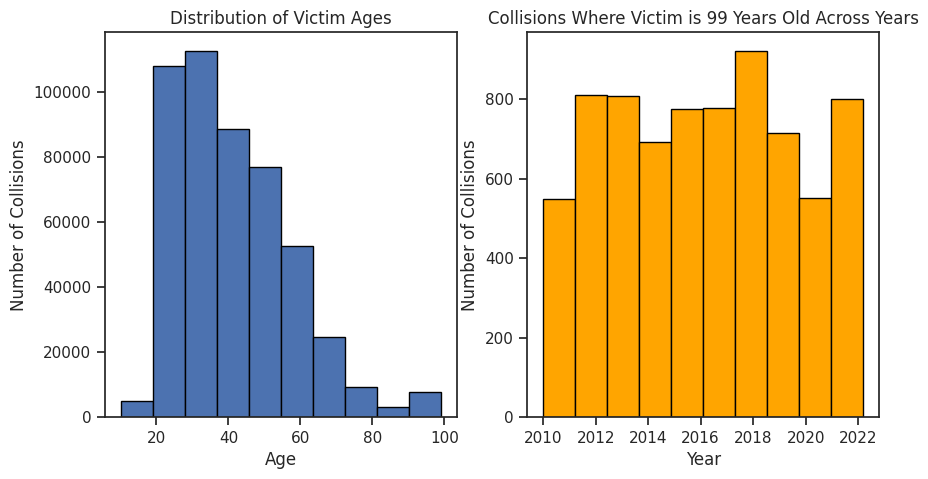

In [72]:
sns.set_theme(style="whitegrid")
sns.set_style("ticks")

figure, ax = plt.subplots(1,2, sharex=False, sharey=False, figsize=(10,5))
ax[0].hist(df_rd["victim_age"],bins=10, edgecolor="black")
ax[0].set_ylabel("Number of Collisions")
ax[0].set_xlabel("Age")
ax[0].set_title("Distribution of Victim Ages")
ax[0].grid(False)

ax[1].hist(df_rd[df_rd["victim_age"]==99]["dttm_occurred"],bins=10, edgecolor="black", color="orange")
ax[1].set_ylabel("Number of Collisions")
ax[1].set_title("Collisions Where Victim is 99 Years Old Across Years")
ax[1].set_xlabel("Year")
ax[1].grid(False)

plt.show()

**Victim Sex**

In [73]:
print('Number of victim_sex rows with NA:', sum(df_rd["victim_sex"].isna()))
df_rd["victim_sex"].value_counts(dropna=False).sort_index()

Number of victim_sex rows with NA: 9201


,count
victim_sex,
F,212946
H,156
M,334517
N,11
X,15763
NaN,9201


In [74]:
sexdict = dict(F="Female", M="Male", X="Other/Unknown", H="Other/Unknown", N="Other/Unknown")
df_rd['victim_sex_clean'] = df_rd.victim_sex.replace(sexdict)
df_rd.victim_sex_clean.value_counts(dropna=False).sort_index()

,count
victim_sex_clean,
Female,212946
Male,334517
Other/Unknown,15930
NaN,9201


**Victim Descent**

In [75]:
print("Number of null victim descents:", df_rd["victim_descent"].isna().sum())
df_rd["victim_descent"].value_counts().sort_index()

Number of null victim descents: 10098


,count
victim_descent,
-,2
A,20791
B,75824
C,864
D,17
F,1696
G,47
H,214080
I,178


Additionally, Asians and Native Hawaiian and Pacific Islanders had more specific descent groups. In order to make it more comparable, I decided to use the groupings the US Census uses: White, Black, American Indian/Alaska Native, Asian, Native Hawaiian or Pacific Islander, and other.

Unfortunately, this means I am still comparing race and ethnicity which are not the same.

In [76]:
# Decode victim descent
descent_dict = {"A":"Other Asian",
                "B":"Black",
                "C":"Chinese",
                "D":"Cambodian",
                "F":"Filipino",
                "G":"Guamanian",
                "H":"Hispanic/Latin/Mexican",
                "I":"American Indian/Alaskan Native",
                "J":"Japanese",
                "K":"Korean",
                "L":"Laotian",
                "O":"Other",
                "P":"Pacific Islander",
                "S":"Samoan",
                "U":"Hawaiian",
                "V":"Vietnamese",
                "W":"White",
                "X":"Unknown",
                "Z":"Asian Indian",
                "-":"Unknown"}
descent_dict2 = {"A":"Asian", #Other Asian
                "B":"Black",
                "C":"Asian", #Chinese
                "D":"Asian", #Cambodian
                "F":"Native Hawaiian/Pacific Islander", #Filipino
                "G":"Native Hawaiian/Pacific Islander", #Guamanian
                "H":"Hispanic/Latin/Mexican",
                "I":"American Indian/Alaskan Native",
                "J":"Asian", #Japanese
                "K":"Asian", #Korean
                "L":"Asian", #Laotian
                "O":"Other",
                "P":"Native Hawaiian/Pacific Islander", #Pacific Islander
                "S":"Native Hawaiian/Pacific Islander", #Samoan
                "U":"Native Hawaiian/Pacific Islander", #Hawaiian
                "V":"Asian", #Vietnamese
                "W":"White",
                "X":"Unknown",
                "Z":"Asian", #Asian Indian
                "-":"Unknown"}
df_rd['victim_descent_clean'] = df_rd.victim_descent.replace(descent_dict2)
df_rd['victim_descent_clean'].value_counts(dropna=False).sort_index()

,count
victim_descent_clean,
American Indian/Alaskan Native,178
Asian,26832
Black,75824
Hispanic/Latin/Mexican,214080
Native Hawaiian/Pacific Islander,2384
Other,82656
Unknown,28126
White,132416
NaN,10098


### MO Codes

Now, checking the `mo_codes`. Since there are multiple MO codes in the same column, I created a separate copy of the data frame so I can examine the MO codes by themselves without changing the original dataset too much.

There are 7 MO codes that do not have a corresponding definition, for a total of 841 appearances of MO Codes without a definition. **I will assume these were mistyped or mistranscribed. I will move forward by recoding the MO code as NaN.**

In [77]:
df_rd_copy = deepcopy(df_rd)
df_rd_copy[["mo_code_0",
            "mo_code_1",
            "mo_code_2",
            "mo_code_3",
            "mo_code_4",
            "mo_code_5",
            "mo_code_6",
            "mo_code_7",
            "mo_code_8",
            "mo_code_9"]] = df_rd_copy["mo_codes"].str.split(" ", expand=True)

df_rd_copy.head()

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area,address_clean,cross_street_clean,location_clean,latitude,longitude,victim_sex_clean,victim_descent_clean,mo_code_0,mo_code_1,mo_code_2,mo_code_3,mo_code_4,mo_code_5,mo_code_6,mo_code_7,mo_code_8,mo_code_9
0,190319651,08/24/2019,08/24/2019,04:50,3,Southwest,356,3036 3004 3026 3101 4003,22.0,M,H,101.0,STREET,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)",2019-08-24 04:50:00,2019-08-24,True,0:00:00,0,808.0,356.0,3.0,SOUTHWEST,SOUTH BUREAU,3A55,7.018806e+06,10591.266020,0.032011,0.000064,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)",34.0255,-118.3002,Male,Hispanic/Latin/Mexican,3036,3004,3026,3101,4003,None,None,None,None,None
1,190319680,08/30/2019,08/30/2019,23:20,3,Southwest,355,3037 3006 3028 3030 3039 3101 4003,30.0,F,H,101.0,STREET,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)",2019-08-30 23:20:00,2019-08-30,True,0:00:00,0,807.0,355.0,3.0,SOUTHWEST,SOUTH BUREAU,3A55,7.072090e+06,10823.145761,0.032805,0.000064,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)",34.0256,-118.3089,Female,Hispanic/Latin/Mexican,3037,3006,3028,3030,3039,3101,4003,None,None,None
2,190413769,08/25/2019,08/25/2019,05:45,4,Hollenbeck,422,3101 3401 3701 3006 3030,NaN,M,X,101.0,STREET,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)",2019-08-25 05:45:00,2019-08-25,True,0:00:00,0,566.0,422.0,4.0,HOLLENBECK,CENTRAL BUREAU,4A15,7.004384e+06,10750.107952,0.033034,0.000064,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)",34.0738,-118.2078,Male,Unknown,3101,3401,3701,3006,3030,None,None,None,None,None
3,190127578,11/20/2019,11/20/2019,03:50,1,Central,128,0605 3101 3401 3701 3011 3034,21.0,M,H,101.0,STREET,1ST,CENTRAL,"(34.0492, -118.2391)",2019-11-20 03:50:00,2019-11-20,True,0:00:00,0,1070.0,128.0,1.0,CENTRAL,CENTRAL BUREAU,1A29,1.534550e+06,6220.695545,0.018408,0.000014,1ST,CENTRAL,"(34.0492, -118.2391)",34.0492,-118.2391,Male,Hispanic/Latin/Mexican,0605,3101,3401,3701,3011,3034,None,None,None,None
4,190319695,08/30/2019,08/30/2019,21:00,3,Southwest,374,0605 4025 3037 3004 3025 3101,49.0,M,B,101.0,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)",2019-08-30 21:00:00,2019-08-30,True,0:00:00,0,829.0,374.0,3.0,SOUTHWEST,SOUTH BUREAU,3A73,8.625945e+06,12173.689427,0.036845,0.000078,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)",34.0108,-118.3182,Male,Black,0605,4025,3037,3004,3025,3101,None,None,None,None


In [78]:
dfrd_mo_long = pd.melt(df_rd_copy, id_vars=["dr_number"], value_vars = ["mo_code_0",
                                                                        "mo_code_1",
                                                                        "mo_code_2",
                                                                        "mo_code_3",
                                                                        "mo_code_4",
                                                                        "mo_code_5",
                                                                        "mo_code_6",
                                                                        "mo_code_7",
                                                                        "mo_code_8",
                                                                        "mo_code_9",])
dfrd_mo_long.columns = ["dr_number","orig_var","mo_code"]
dfrd_mo_long.mo_code.value_counts() # 333 mo_codes, max is 3101 with 419,587

,count
mo_code,
3101,419587
3401,342184
3701,342124
3004,248261
3037,225631
...,...
1306,1
0511,1
1024,1


In [79]:
# check what happens to the "None" values when they are melted.
# 190319651 only has 3036, 3004, 3026, 3101, 4003
dfrd_mo_long[dfrd_mo_long.dr_number==190319651]
dfrd_mo_long.dropna(subset=["mo_code"], inplace=True)
dfrd_mo_long.shape #3182316

dfrd_mo_long[["dr_number","mo_code"]].value_counts() #there are unique dr_numbers to mo_codes.

dr_number  mo_code
100101322  1402       1
180809040  3037       1
180809017  4027       1
180809023  3006       1
           3028       1
                     ..
151312453  3008       1
           3025       1
           3101       1
           3401       1
222106942  4026       1
Name: count, Length: 3182316, dtype: int64

I checked if every `mo_code` found in the dataset exists in the mo_code_dictionary but I found that not all of them exist in the dictionary.

In [80]:
dfrd_mo_desc = pd.merge(dfrd_mo_long,
                        mo_codes_dict,
                        left_on="mo_code",
                        right_on="mo_code",
                        how="left")
dfrd_mo_desc.shape
dfrd_mo_desc

,dr_number,orig_var,mo_code,code_def
0,190319651,mo_code_0,3036,T/C - At Intersection - Yes
1,190319680,mo_code_0,3037,T/C - At Intersection - No
2,190413769,mo_code_0,3101,T/C - PCF (A) In the Narrative
3,190127578,mo_code_0,0605,Traffic Accident/Traffic related incident
4,190319695,mo_code_0,0605,Traffic Accident/Traffic related incident
...,...,...,...,...
3182311,221306137,mo_code_9,4024,T/C - Central Traffic (CTD)
3182312,221105702,mo_code_9,3033,T/C - Private Property - No
3182313,221306205,mo_code_9,4024,T/C - Central Traffic (CTD)
3182314,220205789,mo_code_9,4002,T/C - Rampart


In [81]:
dfrd_mo_desc[["mo_code","code_def"]].value_counts()

,,count
mo_code,code_def,
3101,T/C - PCF (A) In the Narrative,419587
3401,T/C - Type of Collision,342184
3701,T/C - Movement Preceding Collision,342124
3004,T/C - Veh vs Veh,248261
3037,T/C - At Intersection - No,225631
...,...,...
1014,Game,1
0511,Masochism/bondage,1
0515,"Put hand, finger or object into vagina",1


In [82]:
print(f'Number of MO Codes without a description: {dfrd_mo_desc["code_def"].isnull().sum()}') #841 are NaN values.
print("")
dfrd_mo_desc[dfrd_mo_desc["code_def"].isnull()]["mo_code"].value_counts()

Number of MO Codes without a description: 841



,count
mo_code,
0947,731
3031,71
3063,20
3064,16
1505,1
2053,1
1528,1


In [83]:
null_mo = dfrd_mo_desc[dfrd_mo_desc["code_def"].isnull()]["mo_code"].unique()
dfrd_mo_desc['mo_code_clean'] = np.where(dfrd_mo_desc['mo_code'].isin(null_mo),np.nan,dfrd_mo_desc['mo_code'])

In [84]:
dfrd_mo_desc['mo_code_clean'].value_counts()

,count
mo_code_clean,
3101,419587
3401,342184
3701,342124
3004,248261
3037,225631
...,...
0405,1
0446,1
1214,1


In [85]:
dfrd_mo_desc['mo_code_clean'].isin(null_mo).value_counts()

,count
mo_code_clean,
False,3182316


In [86]:
dfrd_mo_desc.dropna(subset=["mo_code_clean"])

,dr_number,orig_var,mo_code,code_def,mo_code_clean
0,190319651,mo_code_0,3036,T/C - At Intersection - Yes,3036
1,190319680,mo_code_0,3037,T/C - At Intersection - No,3037
2,190413769,mo_code_0,3101,T/C - PCF (A) In the Narrative,3101
3,190127578,mo_code_0,0605,Traffic Accident/Traffic related incident,0605
4,190319695,mo_code_0,0605,Traffic Accident/Traffic related incident,0605
...,...,...,...,...,...
3182311,221306137,mo_code_9,4024,T/C - Central Traffic (CTD),4024
3182312,221105702,mo_code_9,3033,T/C - Private Property - No,3033
3182313,221306205,mo_code_9,4024,T/C - Central Traffic (CTD),4024
3182314,220205789,mo_code_9,4002,T/C - Rampart,4002


I decided to filter out the 2022 data to make comparisons across complete years, months, and dates.

In [87]:
#filtering out 2022 data
dfin = df_rd[df_rd["date_reported_dt"].dt.year!=2022]

print(f'Min of Date Occurred: {dfin["date_occurred"].min()}')
print(f'Max of Date Occurred: {dfin["date_occurred"].max()}')
print("")
print(f'Min of Date Reported: {dfin["date_occurred"].min()}')
print(f'Max of Date Reported: {dfin["date_occurred"].max()}')

Min of Date Occurred: 01/01/2010
Max of Date Occurred: 12/31/2021

Min of Date Reported: 01/01/2010
Max of Date Reported: 12/31/2021


In [88]:
mo_fin = dfrd_mo_desc[dfrd_mo_desc["dr_number"].isin(dfin["dr_number"])]
mo_fin

,dr_number,orig_var,mo_code,code_def,mo_code_clean
0,190319651,mo_code_0,3036,T/C - At Intersection - Yes,3036
1,190319680,mo_code_0,3037,T/C - At Intersection - No,3037
2,190413769,mo_code_0,3101,T/C - PCF (A) In the Narrative,3101
3,190127578,mo_code_0,0605,Traffic Accident/Traffic related incident,0605
4,190319695,mo_code_0,0605,Traffic Accident/Traffic related incident,0605
...,...,...,...,...,...
3182135,181616582,mo_code_9,3602,T/C - Unlicensed motorist,3602
3182136,191917533,mo_code_9,4026,T/C - Valley Traffic (VTD),4026
3182137,191917534,mo_code_9,3401,T/C - Type of Collision,3401
3182199,211321028,mo_code_9,3401,T/C - Type of Collision,3401


## Final Dataset
I am now left with the final dataframes: `dfin` and `dfrd_mo_desc`.

In [89]:
print("Shape:", dfin.shape)
dfin.head()

Shape: (569291, 38)


,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area,address_clean,cross_street_clean,location_clean,latitude,longitude,victim_sex_clean,victim_descent_clean
0,190319651,08/24/2019,08/24/2019,04:50,3,Southwest,356,3036 3004 3026 3101 4003,22.0,M,H,101.0,STREET,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)",2019-08-24 04:50:00,2019-08-24,True,0:00:00,0,808.0,356.0,3.0,SOUTHWEST,SOUTH BUREAU,3A55,7.018806e+06,10591.266020,0.032011,0.000064,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)",34.0255,-118.3002,Male,Hispanic/Latin/Mexican
1,190319680,08/30/2019,08/30/2019,23:20,3,Southwest,355,3037 3006 3028 3030 3039 3101 4003,30.0,F,H,101.0,STREET,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)",2019-08-30 23:20:00,2019-08-30,True,0:00:00,0,807.0,355.0,3.0,SOUTHWEST,SOUTH BUREAU,3A55,7.072090e+06,10823.145761,0.032805,0.000064,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)",34.0256,-118.3089,Female,Hispanic/Latin/Mexican
2,190413769,08/25/2019,08/25/2019,05:45,4,Hollenbeck,422,3101 3401 3701 3006 3030,NaN,M,X,101.0,STREET,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)",2019-08-25 05:45:00,2019-08-25,True,0:00:00,0,566.0,422.0,4.0,HOLLENBECK,CENTRAL BUREAU,4A15,7.004384e+06,10750.107952,0.033034,0.000064,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)",34.0738,-118.2078,Male,Unknown
3,190127578,11/20/2019,11/20/2019,03:50,1,Central,128,0605 3101 3401 3701 3011 3034,21.0,M,H,101.0,STREET,1ST,CENTRAL,"(34.0492, -118.2391)",2019-11-20 03:50:00,2019-11-20,True,0:00:00,0,1070.0,128.0,1.0,CENTRAL,CENTRAL BUREAU,1A29,1.534550e+06,6220.695545,0.018408,0.000014,1ST,CENTRAL,"(34.0492, -118.2391)",34.0492,-118.2391,Male,Hispanic/Latin/Mexican
4,190319695,08/30/2019,08/30/2019,21:00,3,Southwest,374,0605 4025 3037 3004 3025 3101,49.0,M,B,101.0,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)",2019-08-30 21:00:00,2019-08-30,True,0:00:00,0,829.0,374.0,3.0,SOUTHWEST,SOUTH BUREAU,3A73,8.625945e+06,12173.689427,0.036845,0.000078,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)",34.0108,-118.3182,Male,Black


In [90]:
dfin.dr_number.value_counts()

,count
dr_number,
190319651,1
160911640,1
160909706,1
160905467,1
160909995,1
...,...
121011241,1
121007805,1
121006775,1


In [91]:
print("Shape:", mo_fin.shape)
mo_fin.head()

Shape: (3160710, 5)


,dr_number,orig_var,mo_code,code_def,mo_code_clean
0,190319651,mo_code_0,3036,T/C - At Intersection - Yes,3036
1,190319680,mo_code_0,3037,T/C - At Intersection - No,3037
2,190413769,mo_code_0,3101,T/C - PCF (A) In the Narrative,3101
3,190127578,mo_code_0,0605,Traffic Accident/Traffic related incident,0605
4,190319695,mo_code_0,0605,Traffic Accident/Traffic related incident,0605


As I want to examine the effects of Vision Zero, I created two additional data frames off of these initital data frames: pre-Vision Zero (before Aug 24, 2015) and post-Vision Zero (the day of and after Aug 24, 2015).

In [92]:
dfin_p2015 = dfin[dfin.dttm_occurred.dt.date<datetime.date(2015,8,24)]
dfin_2015p = dfin[dfin.dttm_occurred.dt.date>=datetime.date(2015,8,24)]

## Analysis

### Dates and Time

I decided to look if there are patterns across date and time, including to explore for victim patterns.
* Is there an overall trend?
* Are there patterns by seasons? Holidays? Months? Time of day?
    * Are there patterns by victims?

First, I took a look at the cumulative sum of collisions to see if there are any patterns across the entire dataset. This would allow me to quickly see if there is a pattern by season or month that I can investigate further.

<ipython-input-93-011983fd9d94>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


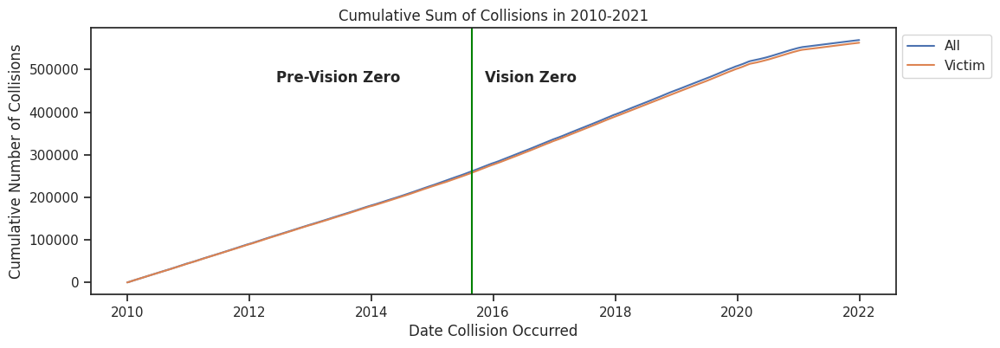

In [93]:
dfin["all"] = True

c_all = pd.DataFrame(dfin.groupby(dfin["dttm_occurred"].dt.date)["all"].sum())
c_all = c_all.cumsum().rename(columns={"all":"All"})
c_all

c_victim = pd.DataFrame(dfin[["victim"]].groupby(dfin["dttm_occurred"].dt.date)["victim"].sum())
c_victim = c_victim.cumsum().rename(columns={"victim":"Victim"})
c_victim

c = c_all.join(c_victim, how='left', sort=True)
c

sns.set_theme(style="whitegrid")
sns.set_style("ticks")

fig = plt.figure(figsize=(12,4))
plt.plot(c.All, label="All")
plt.plot(c.Victim, label="Victim")
plt.title("Cumulative Sum of Collisions in 2010-2021")
plt.xlabel("Date Collision Occurred")
plt.ylabel("Cumulative Number of Collisions")

plt.axvline(pd.to_datetime("2015-08-24"), color="green")
font = {'weight': 'bold',
        'size': 12}
plt.text(15500,470000, "Pre-Vision Zero", fontdict=font)
plt.text(16750,470000, "Vision Zero", fontdict=font)


plt.legend(bbox_to_anchor=(1,1,0,0))
plt.grid(False)

There are no sudden jumps or increases in the number of collisions that would indicate that there are specific time periods to look examine in particular. Eric Garcetti signed [Executive Order #10](https://lacity.gov/sites/g/files/wph2121/files/2021-04/garcetti_ed10.pdf) to implement Vision Zero on August 24, 2015. Thus, I decided to zoom in at 2015 to see if there was any immediate effect.

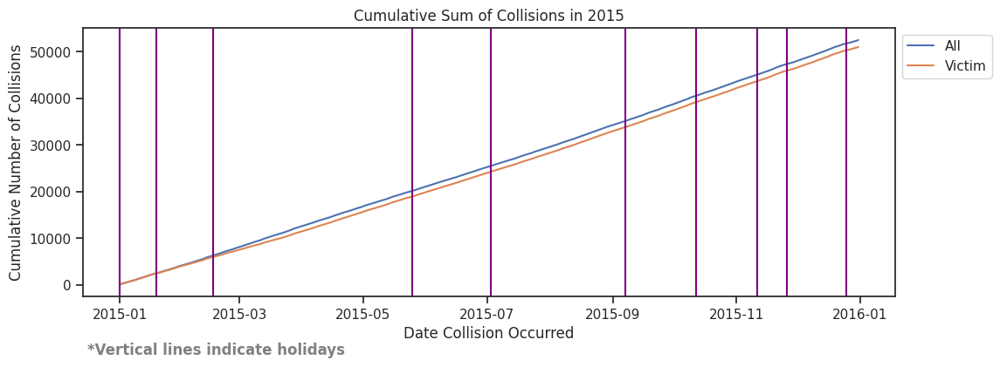

In [94]:
cal = calendar()
cal.holidays()
holidays = cal.holidays(start=dfin.dttm_occurred.dt.date.min(), end=dfin.dttm_occurred.dt.date.max())
holidays_dt = pd.to_datetime(holidays)

holidays_dt_2015 = pd.to_datetime(holidays)[50:60]
holidays_dt_2015

c_all_2015 = pd.DataFrame(dfin[dfin["dttm_occurred"].dt.year==2015].\
                          groupby(dfin["dttm_occurred"].dt.date)["all"].sum())
c_all_2015 = c_all_2015.cumsum().rename(columns={"all":"All"})
c_all_2015

c_victim_2015 = pd.DataFrame(dfin[(dfin.victim) & (dfin.dttm_occurred.dt.year==2015)].\
                             groupby(dfin["dttm_occurred"].dt.date)["victim"].sum())
c_victim_2015 = c_victim_2015.cumsum().rename(columns={"victim":"Victim"})
c_victim_2015

c_2015 = c_all_2015.join(c_victim_2015, how='left', sort=True)
c_2015

sns.set_theme(style="whitegrid")
sns.set_style("ticks")

fig2 = plt.figure(figsize=(12,4))
plt.plot(c_2015.All, label="All")
plt.plot(c_2015.Victim, label="Victim")
plt.title("Cumulative Sum of Collisions in 2015")
plt.xlabel("Date Collision Occurred")
plt.ylabel("Cumulative Number of Collisions")
[plt.axvline(pd.to_datetime(i), color="purple") for i in holidays_dt_2015]
plt.legend(bbox_to_anchor=(1,1,0,0))
plt.grid(False)

font = {'weight': 'bold',
        "color": "gray",
        'size': 12}
plt.text(16420,-15000, "*Vertical lines indicate holidays", fontdict=font)
plt.show()

There is only a steady increase in collisions. Overall, it seems like there is a victim in most collisions and this is not impacted by Vision Zero. There also does not seem to be any holiday impact.

I then decided to break it down by season, year, month, day, day of week, and time of day. Furthermore, I also wanted to examine if there are any patterns in the victims when I examine the dates/times more closely.

I decided to use the following ranges to group the `victim_age` and `time_occurred`:
   * 0-10
   * 11-20
   * 21-30
   * 31-40
   * 41-50
   * 51-60
   * 61-70
   * 71-80
   * 81-90
   * 91-98

For time of day, I decided to use the following groups (by military time):
   - Night: 22:00-3:59
   - Morning: 4:00-9:59
   - Noon: 10:00-15:59
   - Evening: 16-21:59

In [95]:
bins = range(0,101,10)
names = ["0-10","11-20","21-30","31-40","41-50","51-60","61-70","71-80","81-90","91-98"]
dfin["age_range"] = pd.cut(dfin["victim_age"],bins,labels=names)


dfin["hour"] = dfin["dttm_occurred"].dt.hour

dfin['time_of_day'] = pd.cut(dfin["hour"],[0,4,10,16,22,24],
                             labels=['Night','Morning','Noon','Evening','Night '],
                             right=False).str.strip()

# #double-check cut is correct.
dfin[dfin["hour"].isin([0,4,10,16,22,24])][["hour","time_of_day"]].value_counts()

<ipython-input-95-6e0f3f80a542>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<ipython-input-95-6e0f3f80a542>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<ipython-input-95-6e0f3f80a542>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,,count
hour,time_of_day,
16,Evening,35896
10,Noon,24795
22,Night,21421
0,Night,14663
4,Morning,6380


In [96]:
dfin["time_of_day"].value_counts()

,count
time_of_day,
Evening,193137
Noon,184706
Morning,100382
Night,91066


In [97]:
def grapher(df, var):
    sns.set_theme(style="whitegrid")
    sns.set_style("ticks")

    df[["All","Victims"]].plot(kind="bar",edgecolor="black", figsize=(18,4))
    plt.ylabel("Number of Collisions")
    plt.xlabel(var)
    plt.xticks(rotation=0)
    plt.title("Number of Collisions by "+var)
    plt.legend(bbox_to_anchor=(1,1,0,0))
    plt.tight_layout()
    plt.grid(False)

    figure, ax = plt.subplots(1,3,sharey=True,figsize=(18,4), facecolor="white")

    df[["0-10","11-20","21-30",
        "31-40","41-50","51-60","61-70","71-80","81-90","91-98"]].plot(ax=ax[0],
                                                                       kind="bar",
                                                                       edgecolor="black",
                                                                       stacked=True,
                                                                      color = ["red",
                                                                               "orange",
                                                                               "yellow",
                                                                               "green",
                                                                               "blue",
                                                                              "indigo",
                                                                               "olive",
                                                                               "brown",
                                                                              "violet",
                                                                              "gray"])

    ax[0].legend(bbox_to_anchor=(0,0,.4,-.25))
    ax[0].set_title("Number of Collisions by Victim Age")
    ax[0].set_ylabel("Number of Collisions")
    ax[0].grid(False)

    df[["Male",
        "Female",
        "Other/Unknown"]].plot(ax=ax[1],
                               kind="bar",
                               edgecolor="black",
                               stacked=True,
                              color = ["cyan","purple","gray"])

    ax[1].legend(bbox_to_anchor=(0,0,.7,-.3))
    ax[1].set_title("Number of Collisions by Victim Sex")
    ax[1].grid(False)

    df[['Hispanic/Latin/Mexican', 'White','Black', 'Asian',
        'Native Hawaiian/Pacific Islander','Other','Unknown']].plot(ax=ax[2],
                                             kind="bar",
                                             edgecolor="black",
                                             stacked=True,
                                             color = ["azure","yellowgreen","olive","coral",
                                                     "chocolate","plum","gray"])

    ax[2].legend(bbox_to_anchor=(0,0,1,-.3))
    ax[2].set_title("Number of Collisions by Victim Descent")
    ax[2].grid(False)

In [98]:
dfin["year"] = dfin["dttm_occurred"].dt.year

year_a = pd.DataFrame(dfin["year"].value_counts()).rename(columns = {"count":"All"})
year_a


year_v = pd.DataFrame(dfin[dfin["victim"]]["year"].value_counts()).rename(columns = {"count":"Victims"})
year_v

year_va = dfin.groupby("year")["age_range"]\
                     .value_counts().unstack()

year_vs = dfin.groupby("year")["victim_sex_clean"]\
                     .value_counts().unstack()

year_vd = dfin.groupby("year")["victim_descent_clean"]\
                     .value_counts().unstack()

year = year_a.join([year_v, year_va, year_vs, year_vd])
year = year.reindex(range(2010,2022))
year

<ipython-input-98-1853dacc0c8c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,All,Victims,0-10,11-20,21-30,31-40,41-50,51-60,61-70,71-80,81-90,91-98,Female,Male,Other/Unknown,American Indian/Alaskan Native,Asian,Black,Hispanic/Latin/Mexican,Native Hawaiian/Pacific Islander,Other,Unknown,White
year,,,,,,,,,,,,,,,,,,,,,,,
2010,45098,44708,2,890,10527,8761,7771,5513,2379,911,349,468,17526,26976,205,11,2284,6234,16070,181,6285,883,12754
2011,45276,44828,0,940,10799,8807,7933,5360,2506,871,354,664,17534,26945,343,17,2355,5956,16466,200,6447,981,12398
2012,45406,45143,0,954,10968,8611,7887,5399,2596,936,328,746,17780,26755,603,19,2367,5917,16393,199,6615,1309,12314
2013,45035,44565,0,860,10668,8474,7524,5450,2605,910,320,703,17102,26703,707,9,2387,5711,16159,296,6781,1575,11538
2014,46951,46349,0,872,11439,8896,7682,5748,2706,998,334,566,18084,27304,867,12,2457,6179,16794,223,7142,1845,11514
2015,52487,51021,0,957,12652,9706,8323,6256,3089,1064,324,695,19610,30369,1014,17,2497,6528,19125,180,8296,2370,11918
2016,56532,55967,0,1022,13711,11068,8762,6807,3480,1140,332,655,21277,32851,1793,19,2471,7388,21092,201,8886,3334,12396
2017,57726,57098,0,1033,13720,11415,9064,6901,3695,1212,366,798,21466,33311,2219,14,2553,7505,22037,209,8908,3795,11896
2018,57159,56092,0,982,13513,11472,8969,7159,3772,1305,339,748,20988,32892,2043,18,2519,7448,21803,215,8394,3523,11845


In [99]:
dfin["month"] = dfin["dttm_occurred"].dt.month

month_a = pd.DataFrame(dfin["month"].value_counts()).rename(columns = {"count":"All"})

month_v = pd.DataFrame(dfin[dfin["victim"]]["month"].value_counts()).rename(columns = {"count":"Victims"})

month_va = dfin.groupby("month")["age_range"]\
                     .value_counts().unstack()

month_vs = dfin.groupby("month")["victim_sex_clean"]\
                     .value_counts().unstack()#\

month_vd = dfin.groupby("month")["victim_descent_clean"]\
                     .value_counts().unstack()

month = month_a.join([month_v,month_va, month_vs, month_vd])
month = month.reindex(range(1,13))
month.rename(index = {
    1: "January",
    2: "February",
    3: "March",
    4: "April",
    5: "May",
    6: "June",
    7: "July",
    8: "August",
    9: "September",
    10: "October",
    11: "November",
    12: "December"
}, inplace=True)

month

<ipython-input-99-51683678ec8c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,All,Victims,0-10,11-20,21-30,31-40,41-50,51-60,61-70,71-80,81-90,91-98,Female,Male,Other/Unknown,American Indian/Alaskan Native,Asian,Black,Hispanic/Latin/Mexican,Native Hawaiian/Pacific Islander,Other,Unknown,White
month,,,,,,,,,,,,,,,,,,,,,,,
January,46775,46193,3,1513,11048,9133,7857,5736,2819,1031,309,618,17456,27375,1150,19,2302,6136,17435,191,6677,2120,11004
February,45067,44114,4,1431,10616,8894,7287,5347,2744,937,280,621,16707,26088,1143,12,2169,5828,16672,212,6340,2170,10453
March,49021,47941,3,1468,11533,9512,7908,5769,2960,993,324,624,18013,28429,1304,18,2225,6444,17999,216,7113,2439,11217
April,45220,44740,2,1426,10808,8916,7448,5364,2700,932,298,612,16963,26400,1193,14,2088,6109,16910,182,6587,2155,10454
May,46537,46132,5,1724,11065,9154,7607,5606,2812,951,298,669,17510,27215,1188,12,2149,6462,17275,185,6732,2106,10922
June,45919,45528,3,1765,10900,9043,7365,5591,2730,988,297,598,17159,26829,1318,7,2168,6208,16839,169,6822,2240,10784
July,47524,47142,7,1745,11413,9150,7734,5795,2886,983,327,663,17579,27945,1366,17,2238,6381,17823,209,6897,2342,10920
August,49662,49298,9,1951,11926,9612,8079,5971,3020,993,324,721,18422,29149,1450,12,2287,6562,18625,210,7157,2505,11593
September,47760,47385,2,1881,11324,9369,7598,5872,2860,1053,304,647,17878,27820,1416,11,2246,6191,18036,199,6776,2507,11086


In [100]:
dfin["day"] = dfin["dttm_occurred"].dt.day

day_a = pd.DataFrame(dfin["day"].value_counts()).rename(columns = {"count":"All"})


day_v = pd.DataFrame(dfin[dfin["victim"]]["day"].value_counts()).rename(columns = {"count":"Victims"})

day_va = dfin.groupby("day")["age_range"]\
                     .value_counts().unstack()

day_vs = dfin.groupby("day")["victim_sex_clean"]\
                     .value_counts().unstack()#\

day_vd = dfin.groupby("day")["victim_descent_clean"]\
                     .value_counts().unstack()

day = day_a.join([day_v,day_va, day_vs, day_vd])
day = day.reindex(range(1,32))
day

<ipython-input-100-3f2a05981cdf>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,All,Victims,0-10,11-20,21-30,31-40,41-50,51-60,61-70,71-80,81-90,91-98,Female,Male,Other/Unknown,American Indian/Alaskan Native,Asian,Black,Hispanic/Latin/Mexican,Native Hawaiian/Pacific Islander,Other,Unknown,White
day,,,,,,,,,,,,,,,,,,,,,,,
1,19355,19127,1,677,4639,3747,3017,2343,1187,438,117,261,7161,11348,521,8,891,2661,7275,61,2828,926,4353
2,18917,18734,2,679,4493,3685,2977,2340,1177,428,108,247,6981,11104,549,3,838,2622,6961,81,2718,958,4422
3,19012,18802,1,678,4449,3784,3050,2317,1178,458,122,235,7103,11077,528,6,868,2580,7093,90,2680,937,4419
4,18567,18352,2,652,4266,3650,2995,2304,1138,423,134,263,6895,10896,484,6,855,2413,7166,86,2653,894,4165
5,18786,18562,1,687,4423,3710,3008,2232,1151,444,109,253,7069,10868,531,3,912,2472,6928,76,2701,946,4399
6,18822,18611,1,658,4489,3658,3040,2261,1224,402,138,253,6966,11036,518,9,898,2573,7013,82,2754,900,4266
7,18538,18312,1,656,4338,3767,3035,2156,1134,401,132,252,6893,10826,500,4,854,2507,6875,71,2706,870,4303
8,18656,18445,3,646,4394,3588,3060,2340,1126,382,120,267,7025,10816,521,8,829,2549,6889,84,2666,950,4348
9,18890,18672,1,672,4535,3730,3005,2251,1160,377,136,262,6994,11089,520,6,830,2470,7074,87,2785,948,4366


In [101]:
dfin["date_temp"] = dfin.month*100 + dfin.day
dfin['season'] = (pd.cut(dfin.date_temp,[0,321,621,922,1221,1300],
                       labels=['Winter','Spring','Summer','Autumn','Winter '])
                  .str.strip()
               )
dfin[["season","month"]].value_counts().sort_index()

season_a = pd.DataFrame(dfin["season"].value_counts()).rename(columns = {"count":"All"})


season_v = pd.DataFrame(dfin[dfin["victim"]]["season"].value_counts()).rename(columns = {"count":"Victims"})

season_va = dfin.groupby("season")["age_range"]\
                     .value_counts().unstack()

season_vs = dfin.groupby("season")["victim_sex_clean"]\
                     .value_counts().unstack()#\

season_vd = dfin.groupby("season")["victim_descent_clean"]\
                     .value_counts().unstack()

season = season_a.join([season_v,season_va, season_vs, season_vd])
season = season.reindex(["Spring","Summer","Autumn","Winter"])

season

<ipython-input-101-56b4fb9f84d5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<ipython-input-101-56b4fb9f84d5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,All,Victims,0-10,11-20,21-30,31-40,41-50,51-60,61-70,71-80,81-90,91-98,Female,Male,Other/Unknown,American Indian/Alaskan Native,Asian,Black,Hispanic/Latin/Mexican,Native Hawaiian/Pacific Islander,Other,Unknown,White
season,,,,,,,,,,,,,,,,,,,,,,,
Spring,138754,137289,11,4763,33054,27329,22553,16604,8355,2866,917,1913,51968,81053,3651,37,6388,18932,51399,548,20349,6518,32306
Summer,146194,145059,19,5687,34982,28296,23707,17837,8778,3024,939,2011,54289,85702,4301,41,6871,19373,54852,629,21016,7440,33858
Autumn,145164,143874,9,5557,34411,28507,23155,17638,9016,3228,981,1900,54387,84366,4279,55,6786,18831,54671,598,20811,7388,33655
Winter,139179,136729,11,4482,32645,27103,22781,16784,8534,2980,881,1907,51351,81161,3627,45,6683,18266,51730,598,19924,6707,31937


In [102]:
dfin["day_of_week"] = dfin.dttm_occurred.dt.day_name()
dow_a = pd.DataFrame(dfin["day_of_week"].value_counts()).rename(columns = {"count":"All"})


dow_v = pd.DataFrame(dfin[dfin["victim"]]["day_of_week"].value_counts()).rename(columns = {"count":"Victims"})

dow_va = dfin.groupby("day_of_week")["age_range"]\
                     .value_counts().unstack()

dow_vs = dfin.groupby("day_of_week")["victim_sex_clean"]\
                     .value_counts().unstack()#\

dow_vd = dfin.groupby("day_of_week")["victim_descent_clean"]\
                     .value_counts().unstack()


dow = dow_a.join([dow_v,dow_va, dow_vs, dow_vd])
dow = dow.reindex(["Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday"])

dow

<ipython-input-102-67f602973e1d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,All,Victims,0-10,11-20,21-30,31-40,41-50,51-60,61-70,71-80,81-90,91-98,Female,Male,Other/Unknown,American Indian/Alaskan Native,Asian,Black,Hispanic/Latin/Mexican,Native Hawaiian/Pacific Islander,Other,Unknown,White
day_of_week,,,,,,,,,,,,,,,,,,,,,,,
Sunday,74972,74039,4,3038,18372,14172,11483,8309,4050,1349,405,1014,25619,45559,2458,21,3193,9900,28939,308,11126,4338,15672
Monday,78605,77758,10,2672,18256,15404,12853,9777,4915,1716,521,1172,29444,45822,2112,25,3745,10445,29218,337,11699,3734,18071
Tuesday,80082,79226,6,2743,18643,15956,13279,10110,5016,1858,545,1136,31000,45768,2089,20,3935,10602,29414,351,11416,3625,19378
Wednesday,80719,79893,5,2748,18986,16035,13242,10154,5164,1811,572,1121,31094,46305,2134,24,3847,10715,29424,330,11568,3773,19724
Thursday,82048,81148,8,2863,19140,16223,13646,10066,5221,1842,569,1075,31260,47313,2159,31,3949,10893,29896,345,11621,3790,20069
Friday,90328,89382,8,3263,21729,17515,14736,11060,5660,1886,619,1185,34388,52162,2393,27,4283,11980,34002,343,12748,4295,21136
Saturday,82537,81505,9,3162,19966,15930,12957,9387,4657,1636,487,1028,29190,49353,2513,30,3776,10867,31759,359,11922,4498,17706


In [103]:
tod_a = pd.DataFrame(dfin["time_of_day"].value_counts()).rename(columns = {"count":"All"})


tod_v = pd.DataFrame(dfin[dfin["victim"]]["time_of_day"].value_counts()).rename(columns = {"count":"Victims"})

tod_va = dfin.groupby("time_of_day")["age_range"]\
                     .value_counts().unstack()

tod_vs = dfin.groupby("time_of_day")["victim_sex_clean"]\
                     .value_counts().unstack()#\

tod_vd = dfin.groupby("time_of_day")["victim_descent_clean"]\
                     .value_counts().unstack()

tod = tod_a.join([tod_v,tod_va, tod_vs, tod_vd])
tod = tod.reindex(["Morning","Noon","Evening","Night"])
tod

,All,Victims,0-10,11-20,21-30,31-40,41-50,51-60,61-70,71-80,81-90,91-98,Female,Male,Other/Unknown,American Indian/Alaskan Native,Asian,Black,Hispanic/Latin/Mexican,Native Hawaiian/Pacific Islander,Other,Unknown,White
time_of_day,,,,,,,,,,,,,,,,,,,,,,,
Morning,100382,99281,2,2940,21734,20763,17668,13086,6167,2165,632,1434,38961,57115,2679,32,4747,12852,40380,425,13573,4821,21775
Noon,184706,182906,9,5902,40561,35586,31088,25055,13882,5551,1855,2606,72928,104971,4182,50,9163,25608,66016,764,25828,7616,46772
Evening,193137,191230,31,7315,48585,38501,31085,23146,11524,3593,1058,1933,73835,111805,4875,67,9418,25829,74149,844,26697,8582,44647
Night,91066,89534,8,4332,24212,16385,12355,7576,3110,789,173,1758,26271,58391,4122,29,3400,11113,32107,340,16002,7034,18562


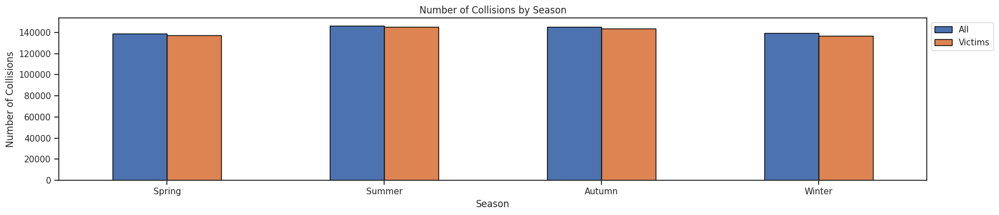

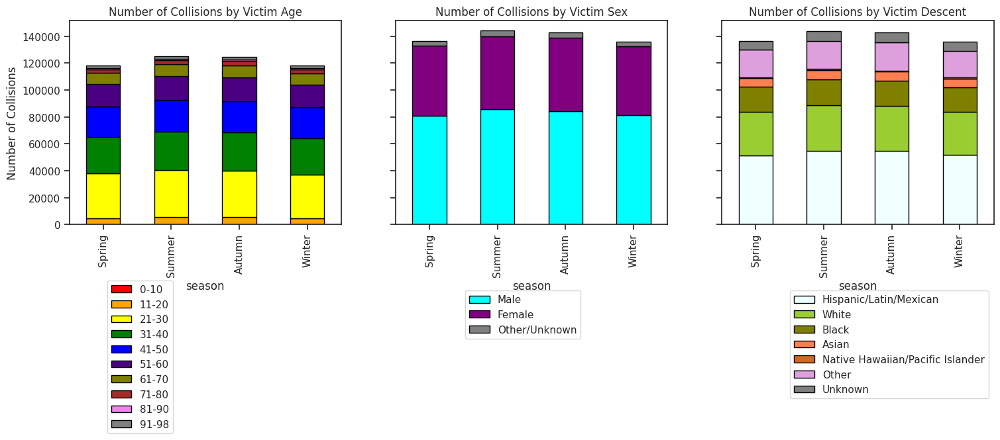

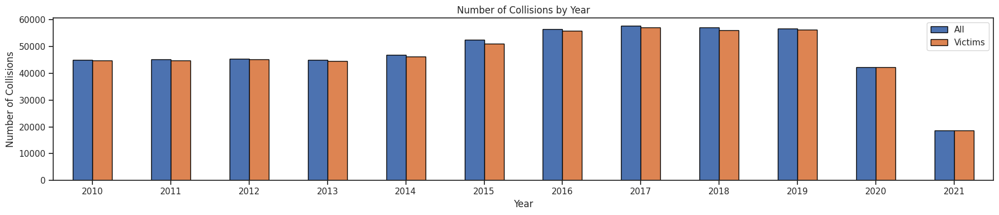

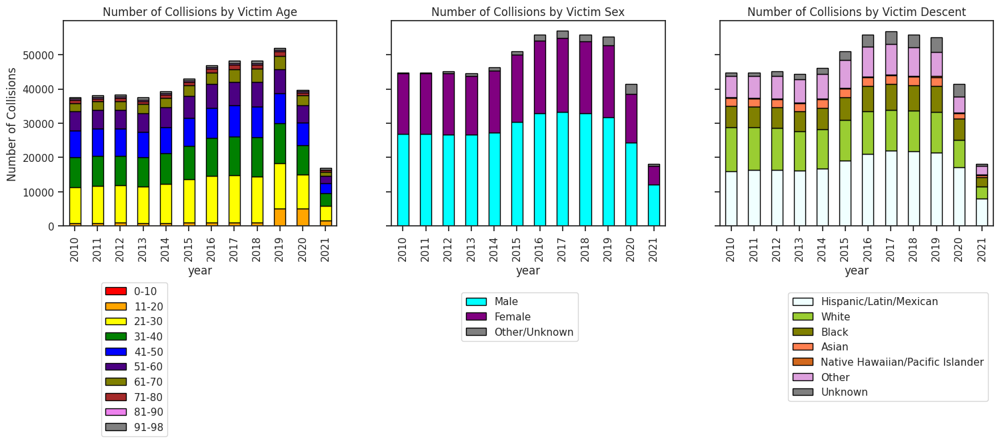

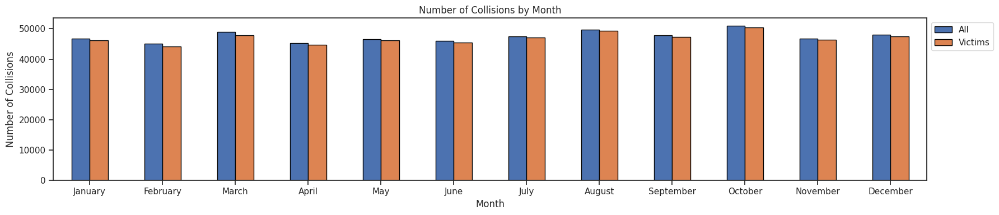

...

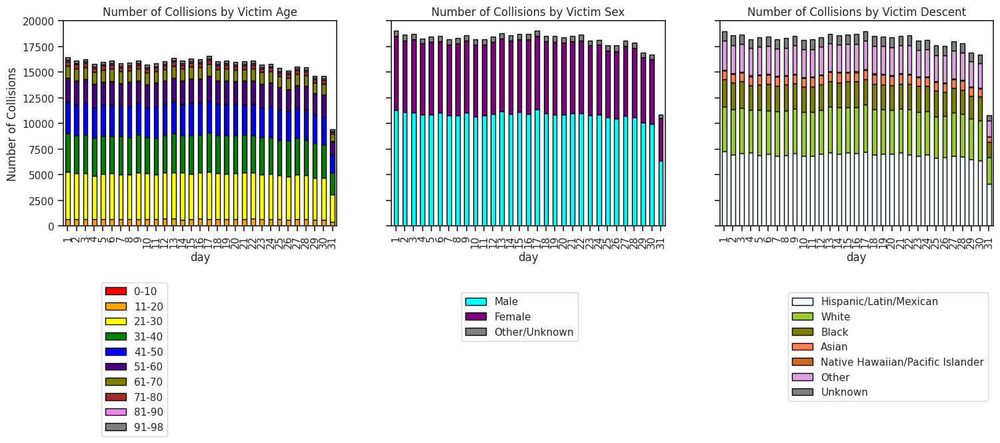

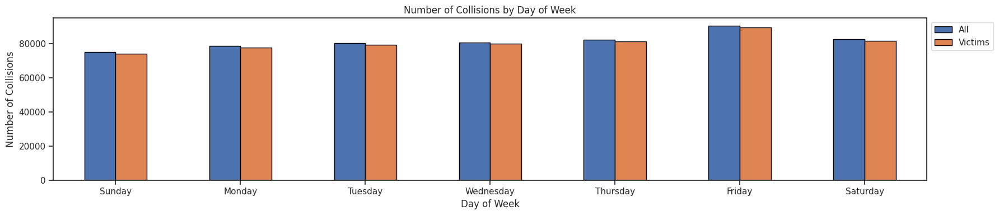

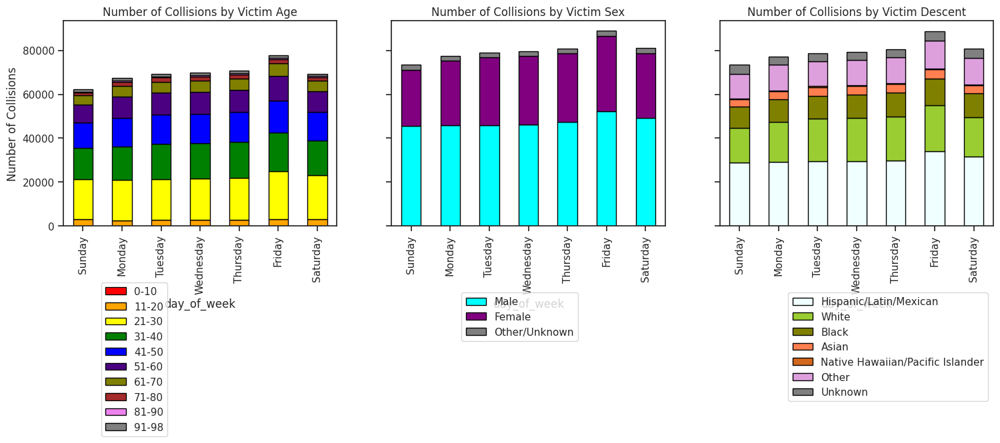

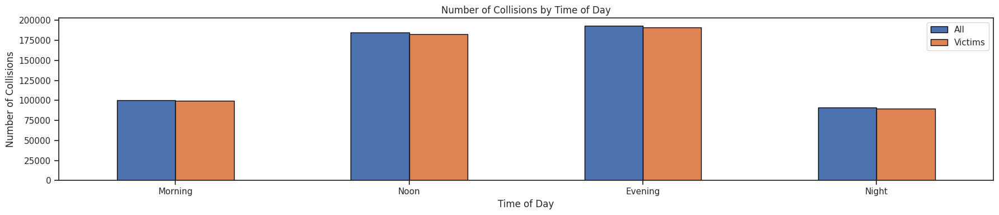

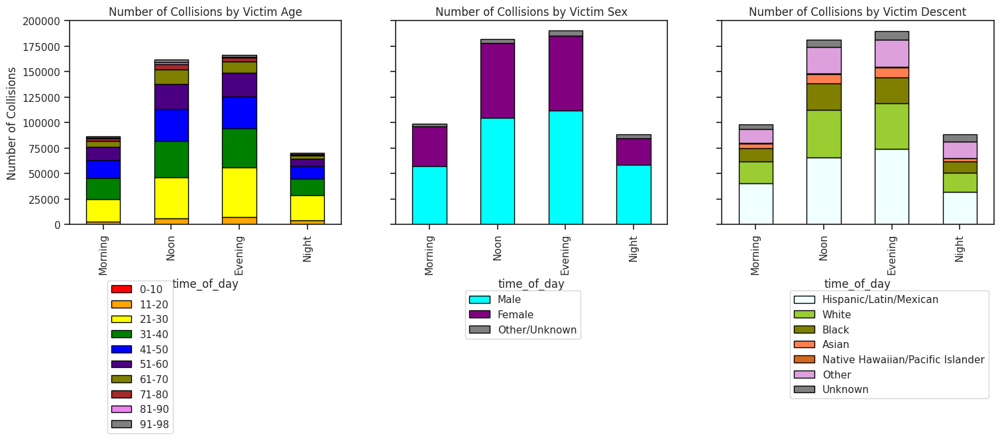

In [104]:
grapher(season,"Season")
grapher(year,"Year")
grapher(month,"Month")
grapher(day,"Day")
grapher(dow,"Day of Week")
grapher(tod,"Time of Day")

When looking at the graphs:
   * Collisions have **increased since 2015**  except until it reached 2020. This could be attributed to the decrease in traffic due to Covid. With less cars on the road, the less of a chance for there to be accidents.


It appears that Vision Zero did not decrease collisions at all, but I could search for clues on where to look at for further research.
   * It appears that collisions **remained steady across seasons** and this is consistent with the cumulative sum graph.
   * The collisions are **not dependent on month**.
   * There less collisions on the 31, but this could possibly be because there are months when there aren't 31 days.
   * Most collisions occur during **noon and evening**. More research is needed, but this could be due to the fatigue from working in the morning while having due to deal with rush hour going home. (People in LA know that if they go out during a certain time of day, they will remain in traffic for a period of time)
   * Most collisions occur during **Friday**.
   
Most of the collisions have victims, and this is not dependent on date or time. I can examine the victims by looking at their sex, age, and descent. It looks like the victims are usually:
   * 21-30 year olds
   * Male
   * Hispanic/Latin/Mexican

### Location, location, location

I sought to answer these three questions about the locations where most collisions occur:

- Which streets or intersections have the most collisions reported?
- What type of structure or location where the most incidents took place?
- Which precincts received the most collisions reports, accounting for area (see reporting districts additional column rd_area)

I first examined the streets that these collisions occurred. I combined the `address_clean` and `cross_street_clean` in order to figure out the most intersections. Because an intersection is the same on a map regardless if the street is a cross street or the street, I had to create an `intersection_clean` column which did not care about the order. I was able to find the 5 most dangerous intersections and plot them on a heat map showing all the collisions.

In [105]:
dfin["intersection_temp"] = dfin["address_clean"] + ", " + dfin["cross_street_clean"]
inter1 = (dfin["address_clean"] + ", " + dfin["cross_street_clean"]).tolist()
inter2 = (dfin["cross_street_clean"] + ", " + dfin["address_clean"]).tolist()

<ipython-input-105-6fbf3217998d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [106]:
inter_dict = {}
for i in range(len(inter1)):
    if (inter1[i] not in inter_dict.keys()) and (inter2[i] not in inter_dict.keys()):
        inter_dict[inter1[i]] = [inter1[i],inter2[i]]
    else:
        continue
inter_dict

{'JEFFERSON BL, NORMANDIE AV': ['JEFFERSON BL, NORMANDIE AV',
  'NORMANDIE AV, JEFFERSON BL'],
 'JEFFERSON BL, W WESTERN': ['JEFFERSON BL, W WESTERN',
  'W WESTERN, JEFFERSON BL'],
 'N BROADWAY, W EASTLAKE AV': ['N BROADWAY, W EASTLAKE AV',
  'W EASTLAKE AV, N BROADWAY'],
 '1ST, CENTRAL': ['1ST, CENTRAL', 'CENTRAL, 1ST'],
 'MARTIN LUTHER KING JR, ARLINGTON AV': ['MARTIN LUTHER KING JR, ARLINGTON AV',
  'ARLINGTON AV, MARTIN LUTHER KING JR'],
 'MAIN, JOHNSTON': ['MAIN, JOHNSTON', 'JOHNSTON, MAIN'],
 'I ST, KING AV': ['I ST, KING AV', 'KING AV, I ST'],
 'CRENSHAW BL, 28TH ST': ['CRENSHAW BL, 28TH ST', '28TH ST, CRENSHAW BL'],
 'WESTERN AV, 36TH ST': ['WESTERN AV, 36TH ST', '36TH ST, WESTERN AV'],
 nan: [nan, nan],
 'N BROADWAY, W HANCOCK ST': ['N BROADWAY, W HANCOCK ST',
  'W HANCOCK ST, N BROADWAY'],
 'AVENUE 26, BARRANCA ST': ['AVENUE 26, BARRANCA ST',
  'BARRANCA ST, AVENUE 26'],
 'GERTRUDE ST, E 4TH ST': ['GERTRUDE ST, E 4TH ST', 'E 4TH ST, GERTRUDE ST'],
 'CESAR E CHAVEZ AV, N BRITT

In [107]:
inter_df_temp = pd.DataFrame.from_dict(inter_dict, orient="index", columns = ["inter1", "inter2"])

In [108]:
inter_df = pd.melt(inter_df_temp, ignore_index=False, value_name = "intersection_temp").sort_index()
inter_df["intersection_clean"] = inter_df.index
inter_df

,variable,intersection_temp,intersection_clean
"0 ST, AVALON BL",inter1,"0 ST, AVALON BL","0 ST, AVALON BL"
"0 ST, AVALON BL",inter2,"AVALON BL, 0 ST","0 ST, AVALON BL"
"0HIO, SAWTELLE",inter1,"0HIO, SAWTELLE","0HIO, SAWTELLE"
"0HIO, SAWTELLE",inter2,"SAWTELLE, 0HIO","0HIO, SAWTELLE"
"1 ST, CHEESBROUGHS LN",inter1,"1 ST, CHEESBROUGHS LN","1 ST, CHEESBROUGHS LN"
...,...,...,...
"ZOO, ZOO",inter2,"ZOO, ZOO","ZOO, ZOO"
"ZUNIGA LN, INDIANA AV",inter1,"ZUNIGA LN, INDIANA AV","ZUNIGA LN, INDIANA AV"
"ZUNIGA LN, INDIANA AV",inter2,"INDIANA AV, ZUNIGA LN","ZUNIGA LN, INDIANA AV"
NaN,inter1,NaN,NaN


In [109]:
inter_df.drop("variable", axis=1, inplace=True)
inter_df

,intersection_temp,intersection_clean
"0 ST, AVALON BL","0 ST, AVALON BL","0 ST, AVALON BL"
"0 ST, AVALON BL","AVALON BL, 0 ST","0 ST, AVALON BL"
"0HIO, SAWTELLE","0HIO, SAWTELLE","0HIO, SAWTELLE"
"0HIO, SAWTELLE","SAWTELLE, 0HIO","0HIO, SAWTELLE"
"1 ST, CHEESBROUGHS LN","1 ST, CHEESBROUGHS LN","1 ST, CHEESBROUGHS LN"
...,...,...
"ZOO, ZOO","ZOO, ZOO","ZOO, ZOO"
"ZUNIGA LN, INDIANA AV","ZUNIGA LN, INDIANA AV","ZUNIGA LN, INDIANA AV"
"ZUNIGA LN, INDIANA AV","INDIANA AV, ZUNIGA LN","ZUNIGA LN, INDIANA AV"
NaN,NaN,NaN


In [110]:
inter_df.intersection_temp.value_counts()

,count
intersection_temp,
"ARLETA AV, ARLETA AV",2
"SUNLAND, SUNLAND",2
"WILBUR, WILBUR",2
"4TH, 4TH",2
"BORDEN AV, BORDEN AV",2
...,...
"FAIR AV, VICTORY",1
"VICTORY, FAIR AV",1
"VICTORY BL, FAIR AV",1


In [111]:
inter_df.drop_duplicates(inplace=True) #191730

In [112]:
dfin = dfin.merge(inter_df,
                  on="intersection_temp")
dfin.dr_number.value_counts()

,count
dr_number,
190319651,1
160911640,1
160909706,1
160905467,1
160909995,1
...,...
121011241,1
121007805,1
121006775,1


In [113]:
dfin["intersection_clean"].value_counts()

,count
intersection_clean,
"SEPULVEDA BL, SHERMAN WY",478
"ROSCOE BL, VAN NUYS BL",477
"WOODMAN AV, SHERMAN WY",422
"WESTERN AV, SLAUSON AV",415
"TAMPA AV, NORDHOFF ST",408
...,...
"ALLESANDRO ST, LOMA VISTA PL",1
"N AVENUE 64, N REPTON ST",1
"WAVERLY AV, ROKEBY ST",1


In [114]:
dfin[["intersection_clean", "location"]].value_counts()

intersection_clean              location            
SEPULVEDA BL, SHERMAN WY        (34.2012, -118.4662)    440
ROSCOE BL, VAN NUYS BL          (34.2216, -118.4488)    414
WESTERN AV, SLAUSON AV          (33.9892, -118.3089)    400
TAMPA AV, NORDHOFF ST           (34.2355, -118.5536)    390
WOODMAN AV, SHERMAN WY          (34.2012, -118.4313)    378
                                                       ... 
HIAWATHA ST, TOPANGA CANYON BL  (34.2661, -118.6153)      1
                                (34.2591, -118.6073)      1
HIAWATHA ST, TOPANGA CANYON     (34.2591, -118.6061)      1
HIAWATHA ST, SWINTON AV         (34.2593, -118.4859)      1
ZUNIGA LN, INDIANA AV           (34.0591, -118.1965)      1
Name: count, Length: 146881, dtype: int64

The most dangerous intersection is Sepulveda Bl and Sherman Wy where 440 collisions occurred during 2010-2021. [ABC7](https://abc7.com/crosstown-la-study-van-nuys-intersections-county-most-dangerous/5930031/) has also reported this as the most dangerous intersection.

![sepulveda_sherman.png](attachment:sepulveda_sherman.png)

In [115]:
lat = dfin["latitude"][np.logical_not(np.isnan(dfin["latitude"]))]
lon = dfin["longitude"][np.logical_not(np.isnan(dfin["longitude"]))]

top5 = dfin[["intersection_clean","latitude","longitude"]].value_counts().reset_index(name="counts").head()
top5

,intersection_clean,latitude,longitude,counts
0,"SEPULVEDA BL, SHERMAN WY",34.2012,-118.4662,440
1,"ROSCOE BL, VAN NUYS BL",34.2216,-118.4488,414
2,"WESTERN AV, SLAUSON AV",33.9892,-118.3089,400
3,"TAMPA AV, NORDHOFF ST",34.2355,-118.5536,390
4,"WOODMAN AV, SHERMAN WY",34.2012,-118.4313,378


In [116]:
map = folium.Map(location=[dfin["latitude"].mean(),dfin["longitude"].mean()],
                 zoom_start=8.5,
                 control_scale=True)
HeatMap(list(zip(lat, lon))).add_to(map)

for row in top5.itertuples():
    folium.Marker([row.latitude, row.longitude],
                 popup=row.intersection_clean,
                 icon=folium.Icon(color="red")).add_to(map)
map

I examined this in the context of Vision Zero to see if these top 5 dangerous intersections were the same prior to its implementation and after the program began. I see that while there are changes in the ordering of which intersections are the most dangerous, all of them are still highly dangerous.

In [117]:
df_intersection_clean = dfin[["dr_number","intersection_clean"]]
df_intersection_clean.dr_number.value_counts() #596832
dfin_p2015 = pd.merge(dfin_p2015,
                      df_intersection_clean,
                      on = ["dr_number"],
                      how = "left")
dfin_2015p = pd.merge(dfin_2015p,
                      df_intersection_clean,
                      on = "dr_number",
                      how = "left")

In [118]:
dfin_p2015.head()

,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,mo_codes,victim_age,victim_sex,victim_descent,premise_code,premise_description,address,cross_street,location,dttm_occurred,date_reported_dt,victim,reported_occurred_diff,reported_occurred_diff_int,rd_fid,rd_repdist,rd_prec,rd_aprec,rd_bureau,rd_basiccar,rd_area,rd_perimeter,rd_shape_length,rd_shape_area,address_clean,cross_street_clean,location_clean,latitude,longitude,victim_sex_clean,victim_descent_clean,intersection_clean
0,191221593,08/31/2019,08/30/2010,23:11,12,77th Street,1239,3101 3401 3701 3006 3030 3602 3801 1218,16.0,M,H,101.0,STREET,SLAUSON AV,FIGUEROA ST,"(33.9892, -118.2827)",2010-08-30 23:11:00,2019-08-31,True,"3288 days, 0:00:00",3288,906.0,1239.0,12.0,77TH STREET,SOUTH BUREAU,12A49,9.751333e+06,13919.033798,0.043376,0.000088,SLAUSON AV,FIGUEROA ST,"(33.9892, -118.2827)",33.9892,-118.2827,Male,Hispanic/Latin/Mexican,"FIGUEROA ST, SLAUSON AV"
1,120217719,09/10/2012,09/10/2012,14:00,2,Rampart,257,3101 3401 3701 3006 3034 3002 3032,65.0,M,H,108.0,PARKING LOT,6TH ST,COLUMBIA ST,"(34.0558, -118.2663)",2012-09-10 14:00:00,2012-09-10,True,0:00:00,0,626.0,257.0,2.0,RAMPART,CENTRAL BUREAU,2A69,3.282029e+06,8404.045193,0.025202,0.000030,6TH ST,COLUMBIA ST,"(34.0558, -118.2663)",34.0558,-118.2663,Male,Hispanic/Latin/Mexican,"6TH ST, COLUMBIA ST"
2,140221197,11/22/2014,11/21/2014,20:10,2,Rampart,205,3101 3401 3701 3004 3030,31.0,M,H,101.0,STREET,3300 LARISSA DR,NaN,"(34.0859, -118.276)",2014-11-21 20:10:00,2014-11-22,True,"1 day, 0:00:00",1,510.0,205.0,2.0,RAMPART,CENTRAL BUREAU,2A5,7.679574e+06,12110.549041,0.036111,0.000070,3300 LARISSA DR,NaN,"(34.0859, -118.276)",34.0859,-118.2760,Male,Hispanic/Latin/Mexican,NaN
3,140404087,01/03/2014,01/03/2014,09:45,4,Hollenbeck,422,3101 3401 3701 3004 3030 3036,34.0,F,H,101.0,STREET,E DARWIN AV,N EASTLAKE AV,"(34.0677, -118.2064)",2014-01-03 09:45:00,2014-01-03,True,0:00:00,0,566.0,422.0,4.0,HOLLENBECK,CENTRAL BUREAU,4A15,7.004384e+06,10750.107952,0.033034,0.000064,E DARWIN AV,N EASTLAKE AV,"(34.0677, -118.2064)",34.0677,-118.2064,Female,Hispanic/Latin/Mexican,"E DARWIN AV, N EASTLAKE AV"
4,140417212,11/24/2014,11/24/2014,16:25,4,Hollenbeck,441,3101 3401 3701 3011 3030 3034,14.0,M,O,101.0,STREET,MISSION RD,RICHMOND ST,"(34.059, -118.2164)",2014-11-24 16:25:00,2014-11-24,True,0:00:00,0,608.0,441.0,4.0,HOLLENBECK,CENTRAL BUREAU,4A15,8.857958e+06,13854.328068,0.042340,0.000080,MISSION RD,RICHMOND ST,"(34.059, -118.2164)",34.0590,-118.2164,Male,Other,"MISSION RD, RICHMOND ST"


In [119]:
dfin_p2015[["intersection_clean","latitude","longitude"]].value_counts()[:10]

,,,count
intersection_clean,latitude,longitude,
"SEPULVEDA BL, SHERMAN WY",34.2012,-118.4662,209
"ROSCOE BL, VAN NUYS BL",34.2216,-118.4488,201
"WOODMAN AV, SHERMAN WY",34.2012,-118.4313,178
"WESTERN AV, SLAUSON AV",33.9892,-118.3089,166
"SHERMAN WY, VAN NUYS BL",34.2012,-118.4487,159
"TAMPA AV, NORDHOFF ST",34.2355,-118.5536,158
"BURBANK BL, SEPULVEDA BL",34.1721,-118.4662,146
"HOLLYWOOD BL, HIGHLAND AV",34.1016,-118.3387,138
"3RD ST, VERMONT AV",34.0691,-118.2917,131


In [120]:
dfin_2015p[["intersection_clean","latitude","longitude"]].value_counts()[:10]

,,,count
intersection_clean,latitude,longitude,
"WESTERN AV, SLAUSON AV",33.9892,-118.3089,234
"TAMPA AV, NORDHOFF ST",34.2355,-118.5536,232
"SEPULVEDA BL, SHERMAN WY",34.2012,-118.4662,231
"ROSCOE BL, VAN NUYS BL",34.2216,-118.4488,213
"BURBANK BL, SEPULVEDA BL",34.1721,-118.4662,208
"WOODMAN AV, SHERMAN WY",34.2012,-118.4313,200
"FIGUEROA ST, MANCHESTER AV",33.9601,-118.2827,198
"DEVONSHIRE ST, RESEDA BL",34.2573,-118.5361,170
"VAN NUYS BL, VANOWEN ST",34.1939,-118.4487,167


When examining the structure or location most incidents took place, I used the `premise_code` and `premise_description`. From before, I know that a factor of 10 separates the top 3: street, parking lot, and sidewalk.

In [121]:
dfin[["premise_code","premise_description"]].value_counts()

,,count
premise_code,premise_description,
101.0,STREET,542235
108.0,PARKING LOT,17995
102.0,SIDEWALK,3038
103.0,ALLEY,1010
104.0,DRIVEWAY,975
...,...,...
405.0,CLOTHING STORE,1
407.0,HARDWARE/BUILDING SUPPLY,1
408.0,AUTO SUPPLY STORE*,1


In [122]:
premise = dfin[["premise_code","premise_description"]].value_counts().reset_index(name="counts")

premise["description2"] = np.where(~premise["premise_code"].isin([101, 108, 102]),
                                           "OTHER",
                                           premise["premise_description"])
premise2 = premise[["description2","counts"]].groupby("description2").sum().reset_index()
premise2
prem_total = np.sum(premise2["counts"])
premise2.loc[:,"pct"] = premise2["counts"]/prem_total
premise2.loc[:, "description3"] = premise2["description2"] + " ("+(round(premise2["pct"]*100,1)).astype(str) +"%)"

premise2

,description2,counts,pct,description3
0,OTHER,5060,0.008903,OTHER (0.9%)
1,PARKING LOT,17995,0.031663,PARKING LOT (3.2%)
2,SIDEWALK,3038,0.005346,SIDEWALK (0.5%)
3,STREET,542235,0.954088,STREET (95.4%)


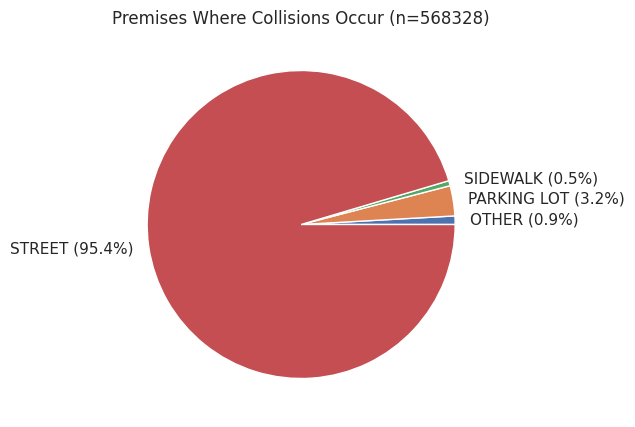

In [123]:
fig, ax = plt.subplots(figsize=(5,5))
wedges, texts = ax.pie(premise2["counts"],
                                  labels = premise2["description3"],
                                  shadow = False)
ax.set_title("Premises Where Collisions Occur (n="+str(prem_total)+")")
plt.show()

In [124]:
dfin_p2015[["premise_code","premise_description"]].value_counts()

,,count
premise_code,premise_description,
101.0,STREET,249099
108.0,PARKING LOT,7832
102.0,SIDEWALK,1342
104.0,DRIVEWAY,470
103.0,ALLEY,448
...,...,...
251.0,RECYCLING CENTER,1
402.0,MARKET,1
403.0,DRUG STORE,1


In [125]:
dfin_2015p[["premise_code","premise_description"]].value_counts()

,,count
premise_code,premise_description,
101.0,STREET,293136
108.0,PARKING LOT,10163
102.0,SIDEWALK,1696
103.0,ALLEY,562
104.0,DRIVEWAY,505
...,...,...
411.0,PET STORE,1
416.0,THE BEVERLY CENTER,1
509.0,MOBILE HOME/TRAILERS/CONSTRUCTION TRAILERS/RV'S/MOTORHOME,1


Most of the collisions occur on streets, parking lots, and side walks in that order. This didn't change post-Vision Zero implementation.

When examining which precincts receive the most collision report, I use `rd_prec` and its corresponding description `rd_aprec`. I can plot them as a bar graph.

In [126]:
precincts = dfin[["rd_prec", "rd_aprec"]].value_counts(ascending=True).reset_index(name="counts")
precincts

,rd_prec,rd_aprec,counts
0,16.0,FOOTHILL,20020
1,4.0,HOLLENBECK,20692
2,2.0,RAMPART,21355
3,5.0,HARBOR,21373
4,1.0,CENTRAL,23354
5,21.0,TOPANGA,24201
6,18.0,SOUTHEAST,24544
7,19.0,MISSION,24780
8,11.0,NORTHEAST,25454
9,6.0,HOLLYWOOD,26832


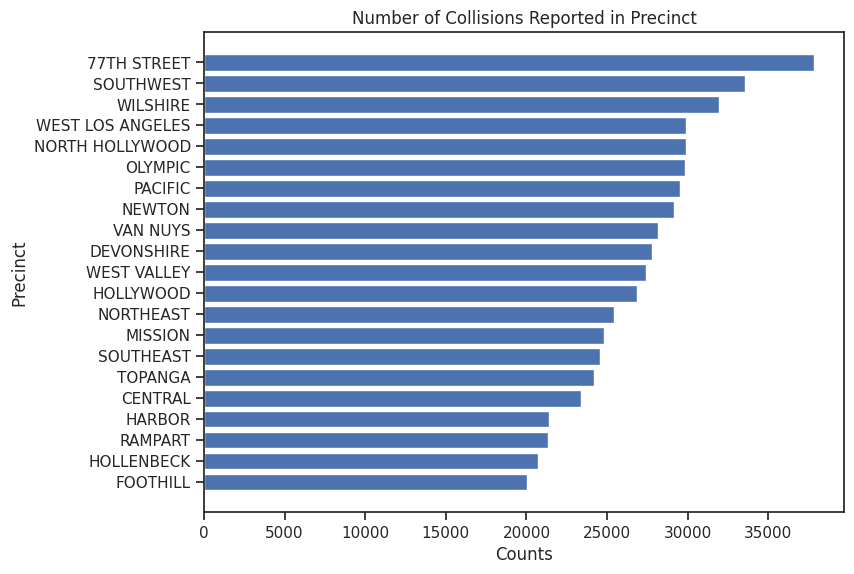

In [127]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.barh(precincts["rd_aprec"],precincts["counts"])

ax.set_xlabel('Counts')
ax.set_ylabel('Precinct')
ax.set_title('Number of Collisions Reported in Precinct')
plt.show()

In [128]:
dfin[["rd_prec", "rd_aprec","rd_bureau"]].value_counts()

,,,count
rd_prec,rd_aprec,rd_bureau,
12.0,77TH STREET,SOUTH BUREAU,37801
3.0,SOUTHWEST,SOUTH BUREAU,33534
7.0,WILSHIRE,WEST BUREAU,31950
8.0,WEST LOS ANGELES,WEST BUREAU,29901
15.0,NORTH HOLLYWOOD,VALLEY BUREAU,29891
20.0,OLYMPIC,WEST BUREAU,29804
14.0,PACIFIC,WEST BUREAU,29499
13.0,NEWTON,CENTRAL BUREAU,29124
9.0,VAN NUYS,VALLEY BUREAU,28169


The South Bureau (given by `rd_bureau`) contains the two precincts with the highest reporting: 77th Street and Southwest.

In [129]:
precinct_p2015 = dfin_p2015[["rd_prec", "rd_aprec","rd_bureau"]].value_counts().reset_index(name="counts_p2015")
precinct_p2015

,rd_prec,rd_aprec,rd_bureau,counts_p2015
0,8.0,WEST LOS ANGELES,WEST BUREAU,15342
1,12.0,77TH STREET,SOUTH BUREAU,15300
2,3.0,SOUTHWEST,SOUTH BUREAU,15183
3,7.0,WILSHIRE,WEST BUREAU,15045
4,15.0,NORTH HOLLYWOOD,VALLEY BUREAU,14375
5,20.0,OLYMPIC,WEST BUREAU,14148
6,14.0,PACIFIC,WEST BUREAU,13898
7,9.0,VAN NUYS,VALLEY BUREAU,13196
8,10.0,WEST VALLEY,VALLEY BUREAU,12772
9,17.0,DEVONSHIRE,VALLEY BUREAU,12721


In [130]:
precinct_2015p = dfin_2015p[["rd_prec", "rd_aprec","rd_bureau"]].value_counts().reset_index(name="counts_2015p")
precinct_2015p

,rd_prec,rd_aprec,rd_bureau,counts_2015p
0,12.0,77TH STREET,SOUTH BUREAU,22501
1,3.0,SOUTHWEST,SOUTH BUREAU,18351
2,13.0,NEWTON,CENTRAL BUREAU,17187
3,7.0,WILSHIRE,WEST BUREAU,16905
4,20.0,OLYMPIC,WEST BUREAU,15656
5,14.0,PACIFIC,WEST BUREAU,15601
6,15.0,NORTH HOLLYWOOD,VALLEY BUREAU,15516
7,17.0,DEVONSHIRE,VALLEY BUREAU,15068
8,9.0,VAN NUYS,VALLEY BUREAU,14973
9,18.0,SOUTHEAST,SOUTH BUREAU,14895


In [131]:
pd.merge(precinct_p2015,precinct_2015p, on=["rd_prec","rd_aprec","rd_bureau"], how="left")

,rd_prec,rd_aprec,rd_bureau,counts_p2015,counts_2015p
0,8.0,WEST LOS ANGELES,WEST BUREAU,15342,14559
1,12.0,77TH STREET,SOUTH BUREAU,15300,22501
2,3.0,SOUTHWEST,SOUTH BUREAU,15183,18351
3,7.0,WILSHIRE,WEST BUREAU,15045,16905
4,15.0,NORTH HOLLYWOOD,VALLEY BUREAU,14375,15516
5,20.0,OLYMPIC,WEST BUREAU,14148,15656
6,14.0,PACIFIC,WEST BUREAU,13898,15601
7,9.0,VAN NUYS,VALLEY BUREAU,13196,14973
8,10.0,WEST VALLEY,VALLEY BUREAU,12772,14615
9,17.0,DEVONSHIRE,VALLEY BUREAU,12721,15068


I find that collisions increased in each precinct. This may be explained because there are 5 years of data for pre-Vision Zero and 6 years of data when Vision Zero has been implemented.

In my analysis of each of questions regarding the locations, I see that there is some change, but nothing drastic. Since this is just an analysis of the collisions, I cannot say for sure if this is solely caused by Vision Zero. Additionally, I will need to account for the change in the rate of traffic through the years which I do not have.

### MO Codes

MO Codes are labels for what each collision is associated with. It can be used to identify injuries, charges, and types of collision, so I wanted to look at whether there were a decrease in dangerous collisions once Vision Zero has started. While I can take a look at the numbers currently, I cannot attribute cause and effect without an experiment.
* Are there MO Codes that are not related to traffic collisions?
* What type of collisions were there?
* How many of the collisions had victims?

In [132]:
mo_fin.head()

,dr_number,orig_var,mo_code,code_def,mo_code_clean
0,190319651,mo_code_0,3036,T/C - At Intersection - Yes,3036
1,190319680,mo_code_0,3037,T/C - At Intersection - No,3037
2,190413769,mo_code_0,3101,T/C - PCF (A) In the Narrative,3101
3,190127578,mo_code_0,0605,Traffic Accident/Traffic related incident,0605
4,190319695,mo_code_0,0605,Traffic Accident/Traffic related incident,0605


Are there MO Codes that are not related to traffic collisions?

In [133]:
mo_fin['traffic'] = mo_fin["code_def"].str.contains("Traffic|^T/C|traffic", na=False)

<ipython-input-133-3af88d2c82d2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [134]:
mo_fin.head()

,dr_number,orig_var,mo_code,code_def,mo_code_clean,traffic
0,190319651,mo_code_0,3036,T/C - At Intersection - Yes,3036,True
1,190319680,mo_code_0,3037,T/C - At Intersection - No,3037,True
2,190413769,mo_code_0,3101,T/C - PCF (A) In the Narrative,3101,True
3,190127578,mo_code_0,0605,Traffic Accident/Traffic related incident,0605,True
4,190319695,mo_code_0,0605,Traffic Accident/Traffic related incident,0605,True


In [135]:
mo_fin[mo_fin["traffic"]]["code_def"].value_counts()

,count
code_def,
T/C - PCF (A) In the Narrative,417097
T/C - Type of Collision,341234
T/C - Movement Preceding Collision,341229
T/C - Veh vs Veh,246940
T/C - At Intersection - No,223637
...,...
T/C - Train vs Bike,12
T/C - Traffic Control Devices,11
T/C - Weather/Lighting/Roadway,11


In [136]:
mo_fin[~mo_fin["traffic"]]

,dr_number,orig_var,mo_code,code_def,mo_code_clean,traffic
31,190617736,mo_code_0,0947,NaN,NaN,False
124,190615561,mo_code_0,0947,NaN,NaN,False
153,191112807,mo_code_0,1402,Evidence Booked (any crime),1402,False
192,191317613,mo_code_0,1501,Other MO (see rpt),1501,False
257,191516209,mo_code_0,1300,Vehicle involved,1300,False
...,...,...,...,...,...,...
3181693,210217754,mo_code_9,1402,Evidence Booked (any crime),1402,False
3181699,211115513,mo_code_9,0907,Narcotics (Buy-Sell-Rip),0907,False
3181881,210219050,mo_code_9,1402,Evidence Booked (any crime),1402,False
3181890,212018348,mo_code_9,0947,NaN,NaN,False


In [137]:
mo_fin[~mo_fin["traffic"]]["code_def"].value_counts().reset_index()[:20]

,code_def,count
0,Other MO (see rpt),12353
1,Vehicle involved,9128
2,Evidence Booked (any crime),3871
3,Victim was Homeless/Transient,993
4,Aid victim,963
5,Forced to masturbate suspect,951
6,Suspect is homeless/transient,314
7,Suspect intoxicated/drunk,238
8,"Public Transit (Metrolink/Train Station,Metro ...",232
9,Susp uses vehicle,217


In [138]:
dr_traffic = mo_fin[mo_fin["traffic"]]["dr_number"].unique()
mo_fin[~mo_fin["dr_number"].isin(dr_traffic)]["dr_number"].value_counts()

,count
dr_number,
121810924,10
181608443,10
201800713,10
171500596,10
211421265,9
...,...
101817636,1
101816009,1
101906296,1


In [139]:
mo_fin[~mo_fin["dr_number"].isin(dr_traffic)]["code_def"].value_counts()

,count
code_def,
Other MO (see rpt),5083
Evidence Booked (any crime),1360
Vehicle involved,919
Forced to masturbate suspect,891
Narcotics (Buy-Sell-Rip),112
...,...
Sprayed with chemical,1
Teach,1
Demands money,1


After I created a variable for whether a traffic accident was coded, I find that there were still several codes. These codes seem to involve multiple people, and there are 8,511 records which did not have a MO Code associated with a traffic collision. Most of these were an "other" MO code or another crime was associated with them.

When I seek to answer what type of collisions there were, I have to look at the ones where the code definition include "vs." This is from a quick glance at the code descriptions when the `traffic` variable indicated it was a traffic collision.

In [140]:
mo_fin.loc[:, "vs"] = mo_fin["code_def"].str.contains(" vs ", na=False)
mo_fin[mo_fin["vs"]]["code_def"].value_counts()

<ipython-input-140-0ae0c97d60f6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,count
code_def,
T/C - Veh vs Veh,246940
T/C - Veh vs Parked Veh,107626
T/C - Veh vs Ped,31497
T/C - Veh vs Fixed Object,31264
T/C - Veh vs Bike,18080
T/C - Veh vs M/C,7085
T/C - Bike vs Veh,1410
T/C - Veh vs Other Object,1369
T/C - M/C vs Veh,532


Most of the collisions were between vehicles and other vehicles. I then combined wanted to see if there were certain collisions that had more victims than others, as well as compare if anything has changed since Vision Zero has been implemented.

In [141]:
victim_dttm = dfin[["dr_number", "victim","dttm_occurred"]]
mo_fin_vict = pd.merge(mo_fin,
                       victim_dttm,
                       on = "dr_number",
                       how = "left")
mo_fin_vict

,dr_number,orig_var,mo_code,code_def,mo_code_clean,traffic,vs,victim,dttm_occurred
0,190319651,mo_code_0,3036,T/C - At Intersection - Yes,3036,True,False,True,2019-08-24 04:50:00
1,190319680,mo_code_0,3037,T/C - At Intersection - No,3037,True,False,True,2019-08-30 23:20:00
2,190413769,mo_code_0,3101,T/C - PCF (A) In the Narrative,3101,True,False,True,2019-08-25 05:45:00
3,190127578,mo_code_0,0605,Traffic Accident/Traffic related incident,0605,True,False,True,2019-11-20 03:50:00
4,190319695,mo_code_0,0605,Traffic Accident/Traffic related incident,0605,True,False,True,2019-08-30 21:00:00
...,...,...,...,...,...,...,...,...,...
3160705,181616582,mo_code_9,3602,T/C - Unlicensed motorist,3602,True,False,True,2018-11-15 13:45:00
3160706,191917533,mo_code_9,4026,T/C - Valley Traffic (VTD),4026,True,False,True,2019-10-05 19:30:00
3160707,191917534,mo_code_9,3401,T/C - Type of Collision,3401,True,False,True,2019-10-05 19:35:00
3160708,211321028,mo_code_9,3401,T/C - Type of Collision,3401,True,False,True,2021-12-29 19:10:00


In [142]:
code_victs = mo_fin_vict[mo_fin_vict["vs"]][["code_def","victim"]].value_counts().sort_index()\
    .reset_index(name="NumRecords")
code_victs

,code_def,victim,NumRecords
0,T/C - Bike vs Other,False,1
1,T/C - Bike vs Other,True,286
2,T/C - Bike vs Train,True,8
3,T/C - Bike vs Veh,False,1
4,T/C - Bike vs Veh,True,1409
5,T/C - M/C vs Fixed Object,False,5
6,T/C - M/C vs Fixed Object,True,330
7,T/C - M/C vs Other,False,4
8,T/C - M/C vs Other,True,365
9,T/C - M/C vs Veh,False,5


In [143]:
code_victs_wide = pd.pivot(code_victs, index = "code_def", columns="victim", values="NumRecords").reset_index()

code_victs_wide.rename(columns={False:"Falses",True:"Trues"},inplace=True)

code_victs_wide["ranked"] = code_victs_wide["Trues"].rank()

code_victs_wide.set_index("ranked", inplace=True)

code_victs_wide = code_victs_wide.sort_index()
code_victs_wide

victim,code_def,Falses,Trues
ranked,,,
1.0,T/C - Bike vs Train,NaN,8.0
2.0,T/C - Train vs Bike,NaN,12.0
3.0,T/C - Train vs Train,2.0,22.0
4.5,T/C - Train vs Veh,1.0,27.0
4.5,T/C - Train vs Fixed Object,NaN,27.0
6.0,T/C - Train vs Ped,3.0,75.0
7.0,T/C - Veh vs Train,NaN,154.0
8.0,T/C - Veh vs Animal,NaN,248.0
9.0,T/C - Bike vs Other,1.0,286.0


In [144]:
code_victs_wide.fillna(0,inplace=True)

code_victs_wide["code_def"] = code_victs_wide["code_def"].str.replace("T/C - ","")
code_victs_wide["code_def"] = code_victs_wide["code_def"].str.replace("M/C","Motorcycle")
code_victs_wide["code_def"] = code_victs_wide["code_def"].str.replace("Veh","Vehicle")
code_victs_wide["code_def"] = code_victs_wide["code_def"].str.replace("Ped","Pedestrian")
code_victs_wide

victim,code_def,Falses,Trues
ranked,,,
1.0,Bike vs Train,0.0,8.0
2.0,Train vs Bike,0.0,12.0
3.0,Train vs Train,2.0,22.0
4.5,Train vs Vehicle,1.0,27.0
4.5,Train vs Fixed Object,0.0,27.0
6.0,Train vs Pedestrian,3.0,75.0
7.0,Vehicle vs Train,0.0,154.0
8.0,Vehicle vs Animal,0.0,248.0
9.0,Bike vs Other,1.0,286.0


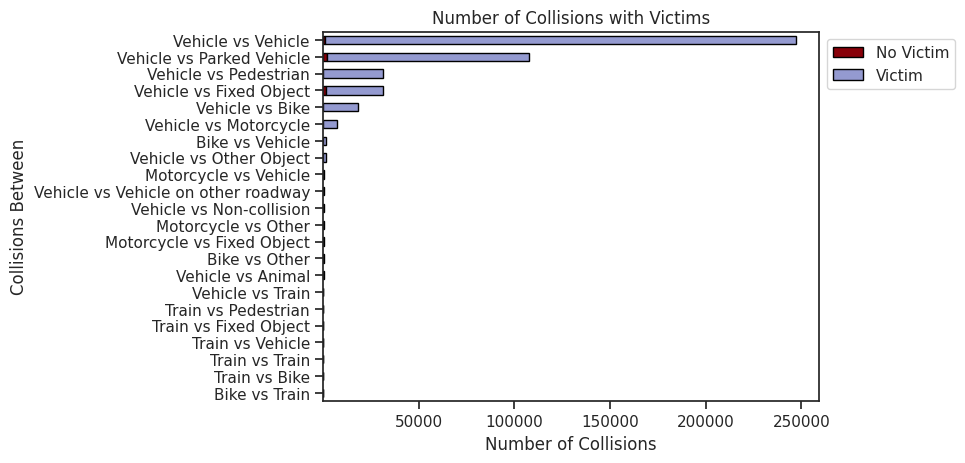

In [145]:
code_victs_wide.plot(kind='barh',
                     stacked=True,
                     title="Number of Collisions with Victims",
                     color = ["#880009","#949ad0"],
                     x = "code_def",
                     edgecolor="black")
plt.legend(['No Victim', 'Victim'], bbox_to_anchor =(1,1,0,0), ncol = 1)
plt.ylabel("Collisions Between")
plt.xlabel("Number of Collisions")
plt.show()

In [146]:
vs = mo_fin_vict[mo_fin_vict["vs"]][["dr_number"]].value_counts().reset_index(name="NumVS")
vs

,dr_number,NumVS
0,131425177,3
1,130709998,3
2,140708388,3
3,141214905,3
4,190320349,3
...,...,...
446896,151104681,1
446897,151104670,1
446898,151104649,1
446899,151104641,1


In [147]:
vs["NumVS"].value_counts()

,count
NumVS,
1,445571
2,1302
3,28


In [148]:
mo_fin_vict_p2015 = mo_fin_vict[mo_fin_vict["dr_number"].isin(dfin_p2015["dr_number"])]
mo_fin_vict_2015p = mo_fin_vict[mo_fin_vict["dr_number"].isin(dfin_2015p["dr_number"])]

In [149]:
mult_p2015 = mo_fin_vict_p2015[mo_fin_vict_p2015["vs"]][["dr_number"]].value_counts().reset_index(name="NumVS")
print(mult_p2015["NumVS"].value_counts())
print("")
print(mult_p2015["NumVS"].value_counts(normalize=True))

NumVS
1    156752
2       431
3        15
Name: count, dtype: int64

NumVS
1    0.997163
2    0.002742
3    0.000095
Name: proportion, dtype: float64


In [150]:
mult_2015p = mo_fin_vict_2015p[mo_fin_vict_2015p["vs"]][["dr_number"]].value_counts().reset_index(name="NumVS")
print(mult_2015p["NumVS"].value_counts())
print("")
print(mult_2015p["NumVS"].value_counts(normalize=True))

NumVS
1    288819
2       871
3        13
Name: count, dtype: int64

NumVS
1    0.996949
2    0.003007
3    0.000045
Name: proportion, dtype: float64


When I look at the MO Codes that indicated the collisions were between things, I find that most of the collisions had a victim associated with them. The overwhelming majority of the collisions with a "vs" associated with them only had collisions between one thing (445,571), but 1,302 had two objects, and 28 had three objects.

I can compare what it was like pre-Vision Zero and when it has been implemented. Based on raw counts, there were more in general, especially between one and two additional objects; however, when I compare the percentages, it stayed about the same. Thus, I decided to examine whether there were changes in injuries.

In [151]:
mo_fin_vict.loc[:,"injury"] = mo_fin_vict["code_def"].str.contains("Injury|injury", na=False)
mo_fin_vict[mo_fin_vict["injury"]]["code_def"].value_counts()

,count
code_def,
T/C - (N) Non Injury,157995
T/C - (C) Complaint of Injury,136676
T/C - (B) Visible Injury,61982
T/C - (A) Severe Injury,11449
T/C - (K) Fatal Injury,2345


In [152]:
injuries = mo_fin_vict[mo_fin_vict["injury"]]
injuries["code_def"] = injuries["code_def"].str[10:]
injuries

<ipython-input-152-a872add5c81f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,dr_number,orig_var,mo_code,code_def,mo_code_clean,traffic,vs,victim,dttm_occurred,injury
38,190617818,mo_code_0,3026,Complaint of Injury,3026,True,False,True,2019-08-22 15:50:00,True
55,190618126,mo_code_0,3028,Non Injury,3028,True,False,True,2019-08-27 17:45:00,True
76,190715905,mo_code_0,3028,Non Injury,3028,True,False,True,2019-08-29 07:10:00,True
108,190814692,mo_code_0,3026,Complaint of Injury,3026,True,False,True,2019-08-26 07:40:00,True
115,190814763,mo_code_0,3025,Visible Injury,3025,True,False,True,2019-08-24 10:40:00,True
...,...,...,...,...,...,...,...,...,...,...
3160545,210415614,mo_code_9,3028,Non Injury,3028,True,False,True,2021-12-06 18:20:00,True
3160570,211320032,mo_code_9,3027,Fatal Injury,3027,True,False,True,2020-10-21 23:15:00,True
3160573,210122121,mo_code_9,3026,Complaint of Injury,3026,True,False,True,2021-12-14 04:20:00,True
3160591,210122255,mo_code_9,3028,Non Injury,3028,True,False,True,2021-12-15 23:00:00,True


In [153]:
injuries["dr_number"].value_counts()

,count
dr_number,
201814666,3
151206702,3
201813339,3
200504224,3
170417500,3
...,...
180713103,1
180709382,1
180714529,1


In [154]:
numinjury = injuries.groupby("dr_number").agg("count").reset_index()

numinjury["injury"].value_counts()

,count
injury,
1,368838
2,794
3,7


In [155]:
injuries_p2015 = injuries[injuries["dr_number"].isin(dfin_p2015["dr_number"])]
injuries_2015p = injuries[injuries["dr_number"].isin(dfin_2015p["dr_number"])]

In [156]:
print(injuries_p2015["code_def"].value_counts())
print("")
print(injuries_p2015["code_def"].value_counts(normalize=True))

code_def
Complaint of Injury    47536
Non Injury             36673
Visible Injury         23260
Severe Injury           3434
Fatal Injury             739
Name: count, dtype: int64

code_def
Complaint of Injury    0.425790
Non Injury             0.328487
Visible Injury         0.208345
Severe Injury          0.030759
Fatal Injury           0.006619
Name: proportion, dtype: float64


In [157]:
print(injuries_2015p["code_def"].value_counts())
print("")
print(injuries_2015p["code_def"].value_counts(normalize=True))

code_def
Non Injury             121322
Complaint of Injury     89140
Visible Injury          38722
Severe Injury            8015
Fatal Injury             1606
Name: count, dtype: int64

code_def
Non Injury             0.468778
Complaint of Injury    0.344429
Visible Injury         0.149618
Severe Injury          0.030969
Fatal Injury           0.006205
Name: proportion, dtype: float64


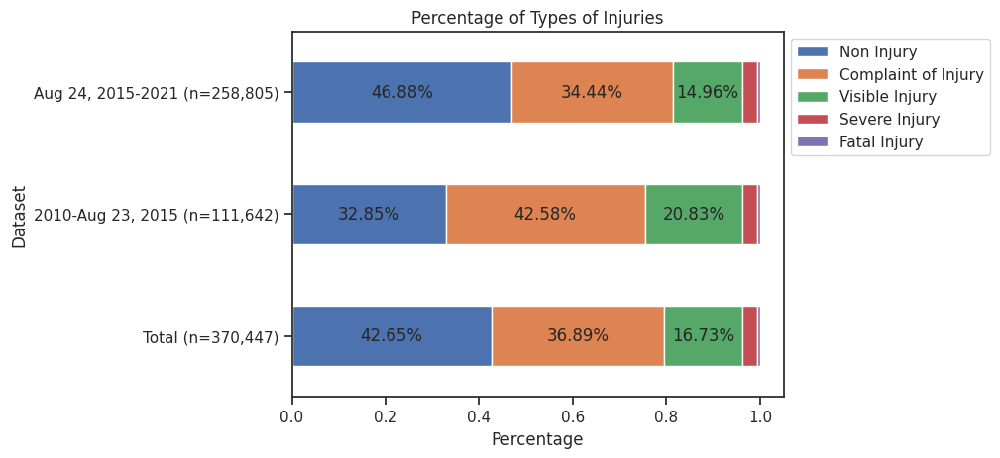

In [158]:
inj_cnt_tot = injuries["code_def"].value_counts().sum()
inj_cnt_p2015 = injuries_p2015["code_def"].value_counts().sum()
inj_cnt_2015p = injuries_2015p["code_def"].value_counts().sum()

inj_total = injuries["code_def"].value_counts(normalize=True).reset_index(name="Total")
inj_p2015 = injuries_p2015["code_def"].value_counts(normalize=True).reset_index(name="Pre-VisionZero")
inj_2015p = injuries_2015p["code_def"].value_counts(normalize=True).reset_index(name="Post-VisionZero")

tot_p2015 = pd.merge(inj_total,
                     inj_p2015,
                     on="code_def",
                     how="left")

tot_p2015_2015p = pd.merge(tot_p2015,
                          inj_2015p,
                           on="code_def",
                           how="left")
tot_p2015_2015p

inj_pct = tot_p2015_2015p.loc[:,["code_def","Total","Pre-VisionZero","Post-VisionZero"]]
inj_pct
inj_pct_t = inj_pct.T
inj_pct_t.columns = inj_pct_t.iloc[0]
inj_pct_t.drop(index="code_def", inplace=True)
# inj_pct_t = inj_pct_t.reindex(["Total","Pre-VisionZero","Post-VisionZero"]) # no longer necessary
inj_pct_t

inj_pct_t.loc["Post-VisionZero","new_index"] = "Aug 24, 2015-2021"+" (n="+"{:,}".format(inj_cnt_2015p)+")"
inj_pct_t.loc["Pre-VisionZero","new_index"] = "2010-Aug 23, 2015"+" (n="+"{:,}".format(inj_cnt_p2015)+")"
inj_pct_t.loc["Total","new_index"] = "Total"+" (n="+"{:,}".format(inj_cnt_tot)+")"
inj_pct_t.set_index("new_index",inplace=True)

ax = inj_pct_t.plot(kind="barh", stacked=True)
plt.title("Percentage of Types of Injuries")
plt.xlabel("Percentage")
plt.ylabel("Dataset")
plt.legend(bbox_to_anchor=(1,1,0,0))

for bar in ax.patches:
    height = bar.get_height()
    width = bar.get_width()
    x = bar.get_x()
    y = bar.get_y()
    if width >= 0.05:
        label_text = "{:.2%}".format(width)
    else:
        label_text = ""
    label_x = x + width/2
    label_y = y + height/2
    ax.text(label_x, label_y, label_text, ha="center",va="center")

plt.show()

Most of the incidents did not contain injuries, but when there injuries, most of the reports had a victim associated with them. There were less injuries the more severe they were. There are some incidents where there were multiple injuries (801).

When I look at whether there were any impact of Vision Zero, I see that the percentage of non-injuries increased whereas the complaint of injury and visible injuries have decreased. This is a positive improvement overall even though there are similar proportions of severe and fatal injuries.

### Regression Discontinuity

In order to analyze whether Vision Zero had any causal impact on the number of collisions, I can use a regression discontinuity design. By comparing the slopes of the number of collisions between the time frame prior to and after Vision Zero's implementation, I can detect whether there were statistically significant changes. This is possible under the assumption that August 24, 2015 is just like any other day and that there would be no difference if it were signed on January 12, March 9, August 23, or December 30; the only difference between August 23, August 24, and August 25, 2015 was just that Vision Zero was signed.

I first examine if there are any sharp changes in the number of collisions throughout the days while paying special attention to the time immediately before and after Vision Zero was signed.

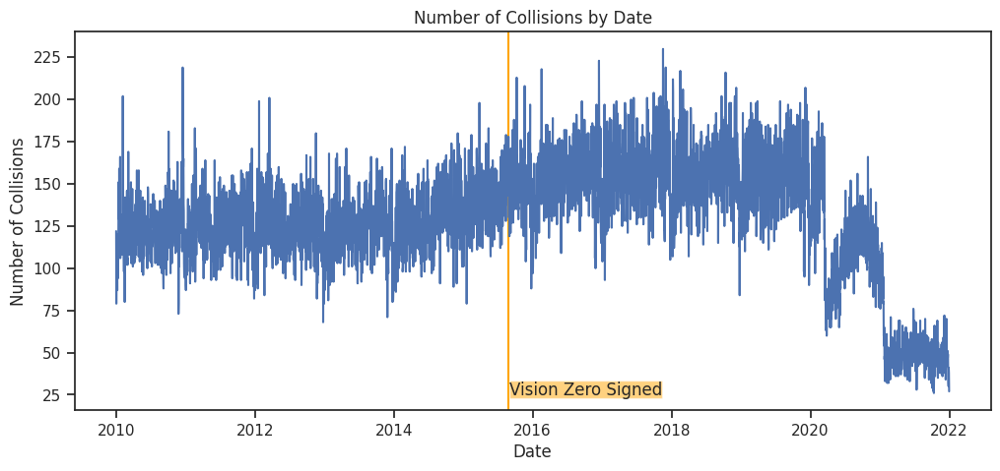

In [159]:
col_date = pd.DataFrame(dfin['dttm_occurred'].dt.date.value_counts().sort_index())

col_fig = plt.figure(figsize=(12,5))

plt.axvline(pd.to_datetime("2015-08-24"), color="orange")
plt.annotate("Vision Zero Signed", (pd.to_datetime("2015-08-30"),25),
             bbox=dict(boxstyle="square", fc="orange", alpha=0.5, pad=0))

plt.plot(col_date)
plt.xlabel("Date")
plt.ylabel("Number of Collisions")
plt.title('Number of Collisions by Date')
plt.show()

Just by eyeballing it, it does not appear as if there are any sharp changes immediately after Vision Zero was signed, but there is a sharp decrease in the number of collisions during 2020. This is likely due to the Covid-19 Pandemic and I explore more of this later on.

Even if there aren't any changes in the number of collisions (immediately prior and after Vision Zero was signed) that are apparent to me, it may be visible statistically. I use the `rdrobust` package because it uses robust standard errors with a regression discontinuity design. I first recode the number datetime column for when the collision occurred to be the number of days before or after Vision Zero was signed so the function knows which two time frames to compare.

In [160]:
# create a column which is number of days pre-post vision zero.

dfin.loc[:,"pre_post_vision_zero"] = dfin["dttm_occurred"].dt.date-datetime.date(2015,8,24)
dfin.pre_post_vision_zero.value_counts()

<ipython-input-160-3f0c811a2e42>:4: FutureWarning: The behavior of value_counts with object-dtype is deprecated. In a future version, this will *not* perform dtype inference on the resulting index. To retain the old behavior, use `result.index = result.index.infer_objects()`


,count
pre_post_vision_zero,
816 days,230
479 days,223
-1711 days,219
830 days,219
177 days,218
...,...
2233 days,29
2150 days,28
2239 days,27


In [161]:
dfin[dfin.pre_post_vision_zero==pd.Timedelta(-1, unit='d')].date_occurred.value_counts() # 8/23/2015 is correct
dfin[dfin.pre_post_vision_zero==pd.Timedelta(0, unit='d')].date_occurred.value_counts() # 8/24/2015 is correct
dfin[dfin.pre_post_vision_zero==pd.Timedelta(1, unit='d')].date_occurred.value_counts() # 8/25/2015 is correct
dfin[dfin.pre_post_vision_zero==pd.Timedelta(816, unit='d')].date_occurred.value_counts() # 230 is the correct count for 816 days

,count
date_occurred,
11/17/2017,230


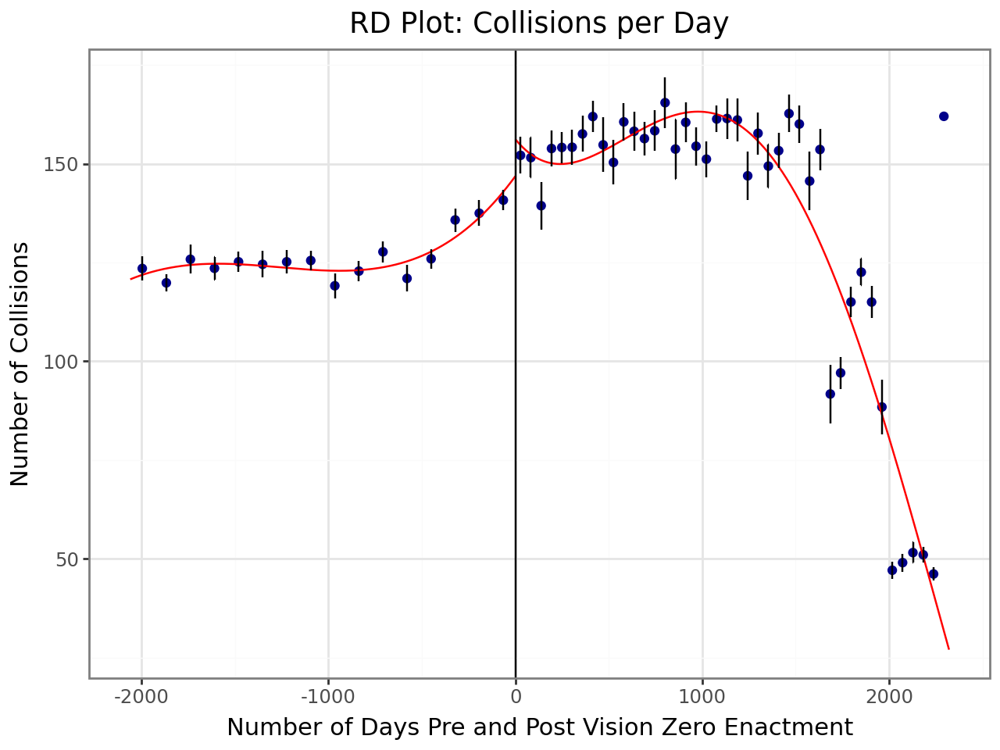

Call: rdplot
Number of Observations:                  4383
Kernel:                               Uniform
Polynomial Order Est. (p):                  4

                                Left      Right
------------------------------------------------
Number of Observations          2061       2322
Number of Effective Obs         2061       2322
Bandwith poly. fit (h)          2061       2321
Number of bins scale               1          1
Bins Selected                     16         42
Average Bin Length           128.812     55.262
Median Bin Length            128.812     55.262
IMSE-optimal bins               16.0       42.0
Mimicking Variance bins         94.0      516.0

Relative to IMSE-optimal:
Implied scale                    1.0        1.0
WIMSE variance weight            0.5        0.5
WIMSE bias weight                0.5        0.5


In [162]:
number_collisions = dfin.groupby(["pre_post_vision_zero"])["dr_number"].count().reset_index(name='Collisions')
number_collisions

# y = number of collisions
# x = num of days pre-post Vision Zero

num_collisions = number_collisions["Collisions"]
days_coll = number_collisions.pre_post_vision_zero.dt.days

# ### rdplot with 95% confidence intervals
rdplot(y=num_collisions, x=days_coll, binselect="es", ci=95,
         title="RD Plot: Collisions per Day",
         y_label="Number of Collisions",
         x_label="Number of Days Pre and Post Vision Zero Enactment")

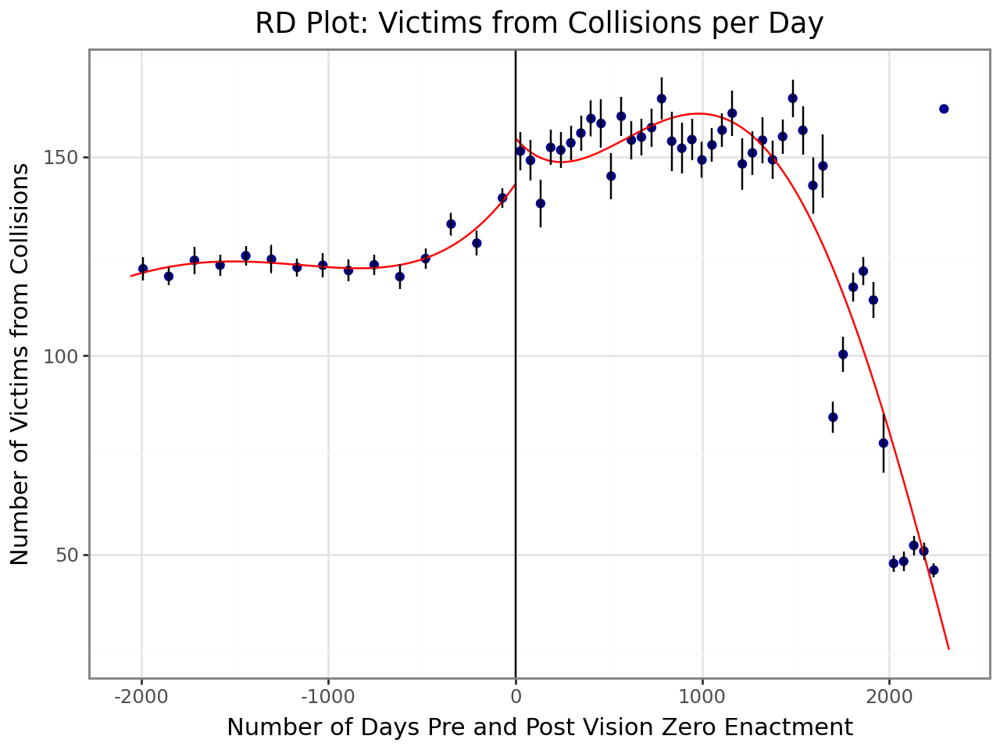

Call: rdplot
Number of Observations:                  4383
Kernel:                               Uniform
Polynomial Order Est. (p):                  4

                                Left      Right
------------------------------------------------
Number of Observations          2061       2322
Number of Effective Obs         2061       2322
Bandwith poly. fit (h)          2061       2321
Number of bins scale               1          1
Bins Selected                     15         43
Average Bin Length             137.4     53.977
Median Bin Length              137.4     53.977
IMSE-optimal bins               15.0       43.0
Mimicking Variance bins         92.0      507.0

Relative to IMSE-optimal:
Implied scale                    1.0        1.0
WIMSE variance weight            0.5        0.5
WIMSE bias weight                0.5        0.5


In [163]:
number_victims = pd.DataFrame(dfin.groupby(["pre_post_vision_zero"])["victim"].sum()).reset_index()
number_victims

# y = number of victims
# x = num of days pre-post Vision Zero

num_victims = number_victims["victim"]
days_vic = number_victims.pre_post_vision_zero.dt.days

# # ### rdplot with 95% confidence intervals
rdplot(y=num_victims, x=days_vic, binselect="es", ci=95,
         title="RD Plot: Victims from Collisions per Day",
         y_label="Number of Victims from Collisions",
         x_label="Number of Days Pre and Post Vision Zero Enactment")

In [164]:
### rdrobust
print(rdrobust(y=num_victims, x=days_vic))

Call: rdrobust
Number of Observations:                  4383
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                    mserd
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          2061       2322
Number of Unique Obs.           2061       2322
Number of Effective Obs.         436        437
Bandwidth Estimation         436.192    436.192
Bandwidth Bias               810.884    810.884
rho (h/b)                      0.538      0.538

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional       6.028    2.101    2.869   4.115e-03     [1.91, 10.146]
Robust                 -        -    2.179   2.931e-02     [0.519, 9.791]



In [165]:
### rdrobust with all estimates
print(rdrobust(y=num_victims, x=days_vic, all=True))

Call: rdrobust
Number of Observations:                  4383
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                    mserd
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          2061       2322
Number of Unique Obs.           2061       2322
Number of Effective Obs.         436        437
Bandwidth Estimation         436.192    436.192
Bandwidth Bias               810.884    810.884
rho (h/b)                      0.538      0.538

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional       6.028    2.101    2.869   4.115e-03     [1.91, 10.146]
Bias-Corrected     5.155    2.101    2.454   1.414e-02     [1.037, 9.273]
Robust             5.155    2

Judging by the graphs and the significance tests, there is a difference between the number of collisions before and after Vision Zero was signed, but the number of collisions actually increased. Even when we filter for whether there is a victim, the story remains similar.

The next step is to isolate the effects of the pandemic.

*Note*

I'm leaving these two blocks of the analysis here because I might come back to this in the future. The [documentation](https://github.com/rdpackages/rdrobust/tree/master/Python/rdrobust) for the `rdrobust` package is sparse at the time of writing, and I mostly followed the code that is shown in the example. This may be an instance where math is just numbers and the code works, but the meaning is incomprehensible (i.e., 1+2=3, but 1 apple + 2 miles = 3 apples and miles makes no sense)

Block 1: I'm not sure what the "backwards compatability" meant, why the variables for `h` and `b` are hard-coded, or where the hard-coded numbers come from.

Block 2: What is t+2 and how was that calculated? I've kept it here, but I'll need to dive deeper into the code and statistics.

In [166]:
# Block 1
## double-check this
## rdrobust backward compatibility
print(rdrobust(y=num_victims, x=days_vic, h=16.79369, b=27.43745))

Call: rdrobust
Number of Observations:                  4383
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                   Manual
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          2061       2322
Number of Unique Obs.           2061       2322
Number of Effective Obs.          16         17
Bandwidth Estimation          16.794     16.794
Bandwidth Bias                27.437     27.437
rho (h/b)                      0.612      0.612

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional       2.493    8.277    0.301   7.632e-01  [-13.729, 18.716]
Robust                 -        -    0.572   5.675e-01  [-13.853, 25.264]



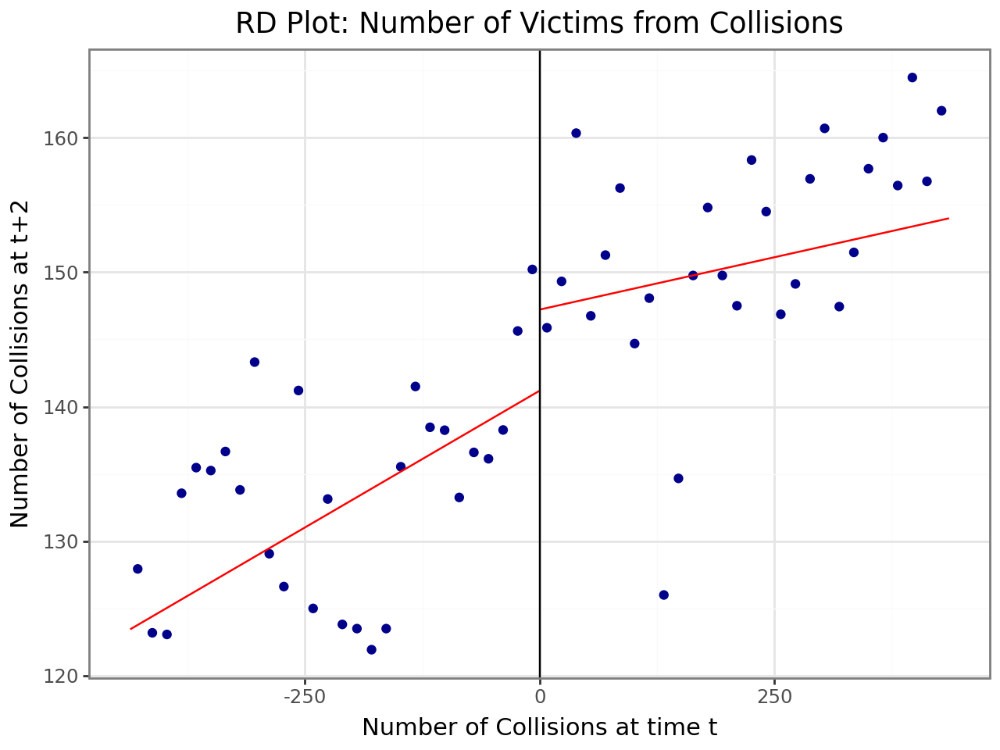

Call: rdplot
Number of Observations:                   873
Kernel:                            Triangular
Polynomial Order Est. (p):                  1

                                Left      Right
------------------------------------------------
Number of Observations           436        437
Number of Effective Obs          436        437
Bandwith poly. fit (h)       436.192    436.192
Number of bins scale               1          1
Bins Selected                     28         28
Average Bin Length            15.571     15.571
Median Bin Length             15.571     15.571
IMSE-optimal bins               11.0        6.0
Mimicking Variance bins         28.0       28.0

Relative to IMSE-optimal:
Implied scale                  2.545      4.667
WIMSE variance weight          0.057       0.01
WIMSE bias weight              0.943       0.99


In [167]:
# Block 2
#### double-check this
## rdplot to show rdrobust estimate
est = rdrobust(y=num_victims, x=days_vic)
h_l, h_r = est.bws.loc['h', :].values
subset = ((-h_l<= days_vic) & (days_vic <= h_r)).values

rdplot(y=num_victims, x=days_vic, subset=subset,
       binselect="esmv", kernel="triangular", h=[h_l,h_r], p=1,
       title="RD Plot: Number of Victims from Collisions",
       y_label="Number of Collisions at t+2",
       x_label="Number of Collisions at time t")

#### Pandemic

On March 11, 2020, the World Health Organization declared Covid-19 a pandemic. This marked a shift in policy across the world, and people were less willing to venture outside and, in some cases, lockdowns. For this analysis, I try to disentangle the effects of the pandemic from the number of collisions due to the fact that less cars on the road mean less collisions, and less people on the road means less victims.

First, I filter for the days before the pandemic was declared.

In [168]:
dfin.loc[:,"postcovid"] = dfin["dttm_occurred"].dt.date-datetime.date(2020,3,11)
dfin["postcovid"].value_counts()

dfin[dfin.postcovid==pd.Timedelta(-1, unit='d')].date_occurred.value_counts() # 3/10/2020 is correct
dfin[dfin.postcovid==pd.Timedelta(0, unit='d')].date_occurred.value_counts() # 3/11/2020 is correct
dfin[dfin.postcovid==pd.Timedelta(1, unit='d')].date_occurred.value_counts() #3/12/2020 is correct

<ipython-input-168-bd4dae83ae48>:2: FutureWarning: The behavior of value_counts with object-dtype is deprecated. In a future version, this will *not* perform dtype inference on the resulting index. To retain the old behavior, use `result.index = result.index.infer_objects()`


,count
date_occurred,
03/12/2020,134


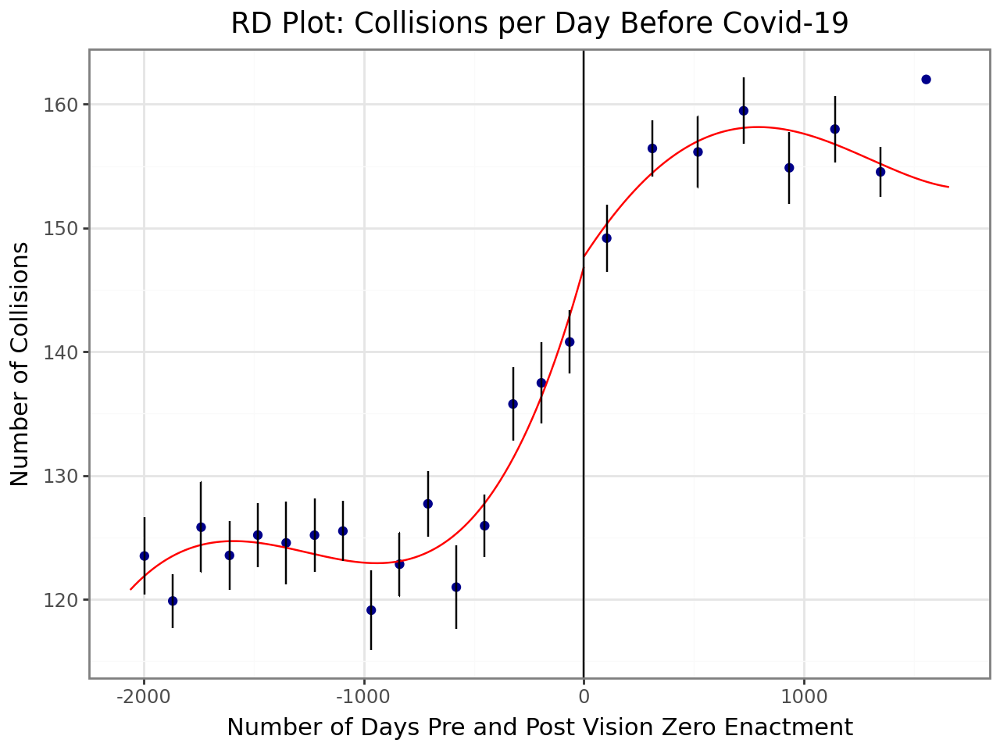

Call: rdrobust
Number of Observations:                  3721
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                    mserd
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          2061       1660
Number of Unique Obs.           2061       1660
Number of Effective Obs.         476        477
Bandwidth Estimation         476.613    476.613
Bandwidth Bias               742.591    742.591
rho (h/b)                      0.642      0.642

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional       3.955    2.045    1.935   5.303e-02    [-0.052, 7.963]
Bias-Corrected      3.58    2.045    1.751   7.991e-02    [-0.427, 7.588]
Robust              3.58    2

In [169]:
number_collisions_nocovid = dfin[dfin["postcovid"] < pd.Timedelta(-1, unit='d')].groupby(["pre_post_vision_zero"])["dr_number"].count().reset_index(name='Collisions')
# number_collisions_nocovid.dttm_occurred.max() ## confirmed 2020-03-10 23:30:00

# y = number of collisions
# x = num of days pre-post Vision Zero

num_collisions_nocovid = number_collisions_nocovid["Collisions"]
days_coll_nocovid = number_collisions_nocovid.pre_post_vision_zero.dt.days

# ### rdplot with 95% confidence intervals
rdplot(y=num_collisions_nocovid, x=days_coll_nocovid, binselect="es", ci=95,
         title="RD Plot: Collisions per Day Before Covid-19",
         y_label="Number of Collisions",
         x_label="Number of Days Pre and Post Vision Zero Enactment")

### rdrobust with all estimates
print(rdrobust(y=num_collisions_nocovid, x=days_coll_nocovid, all=True))

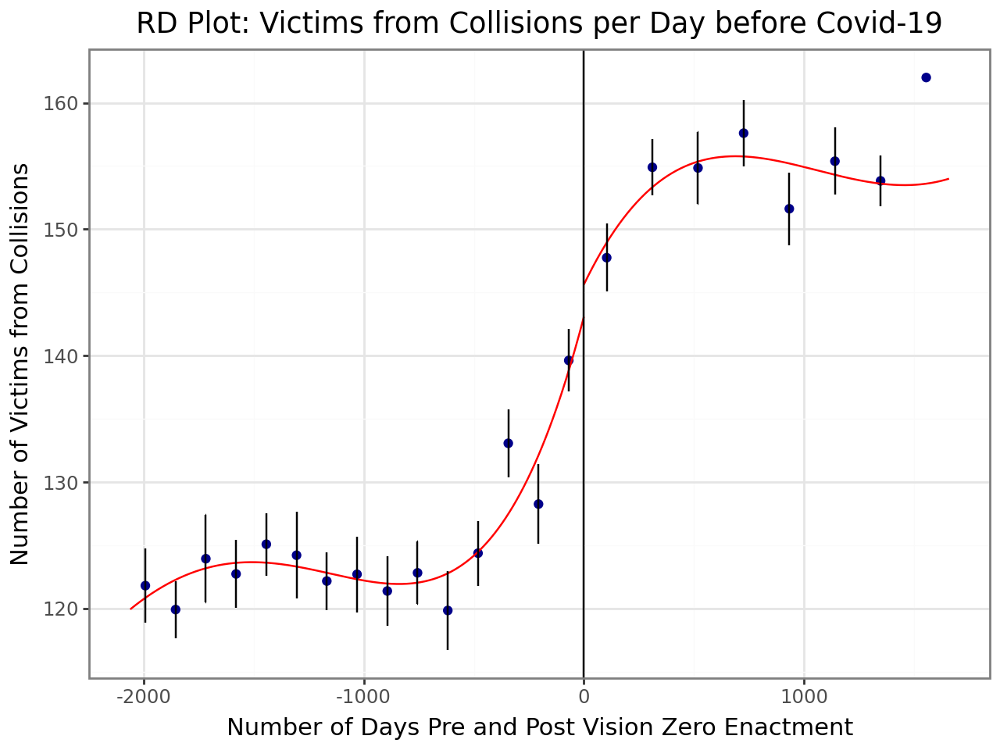

Call: rdrobust
Number of Observations:                  3721
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                    mserd
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          2061       1660
Number of Unique Obs.           2061       1660
Number of Effective Obs.         410        411
Bandwidth Estimation         410.638    410.638
Bandwidth Bias               646.519    646.519
rho (h/b)                      0.635      0.635

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional       6.011    2.158    2.786   5.339e-03    [1.782, 10.241]
Bias-Corrected     5.589    2.158     2.59   9.594e-03      [1.36, 9.818]
Robust             5.589    2

In [170]:
number_victims_nocovid = pd.DataFrame(dfin[dfin["postcovid"] < pd.Timedelta(-1, unit='d')].groupby(["pre_post_vision_zero"])["victim"].sum()).reset_index()
number_victims_nocovid
# number_victims_nocovid.pre_post_vision_zero.max() ## confirmed 1660 days
# dfin[dfin["postcovid"]].pre_post_vision_zero.min() # confirmed 1661 days

# y = number of victims
# x = num of days pre-post Vision Zero

num_victims_nocovid = number_victims_nocovid["victim"]
days_vic_nocovid = number_victims_nocovid.pre_post_vision_zero.dt.days

### rdplot with 95% confidence intervals
rdplot(y=num_victims_nocovid, x=days_vic_nocovid, binselect="es", ci=95,
         title="RD Plot: Victims from Collisions per Day before Covid-19",
         y_label="Number of Victims from Collisions",
         x_label="Number of Days Pre and Post Vision Zero Enactment")

### rdrobust with all estimates
print(rdrobust(y=num_victims_nocovid, x=days_vic_nocovid, all=True))

This shows very clearly that there is a trend that the number of collisions and victims increased after Vision Zero was signed. While the number of collisions before and after signing Vision Zero was not statistically different, there was statistical significance found when the looking at the number of victims.

However, we can also take a look at whether the pandemic had any effect on the number of collisions. The pandemic lowered the number of cars on the road due to the increased reluctance to travel, work from home orders, and lockdowns.

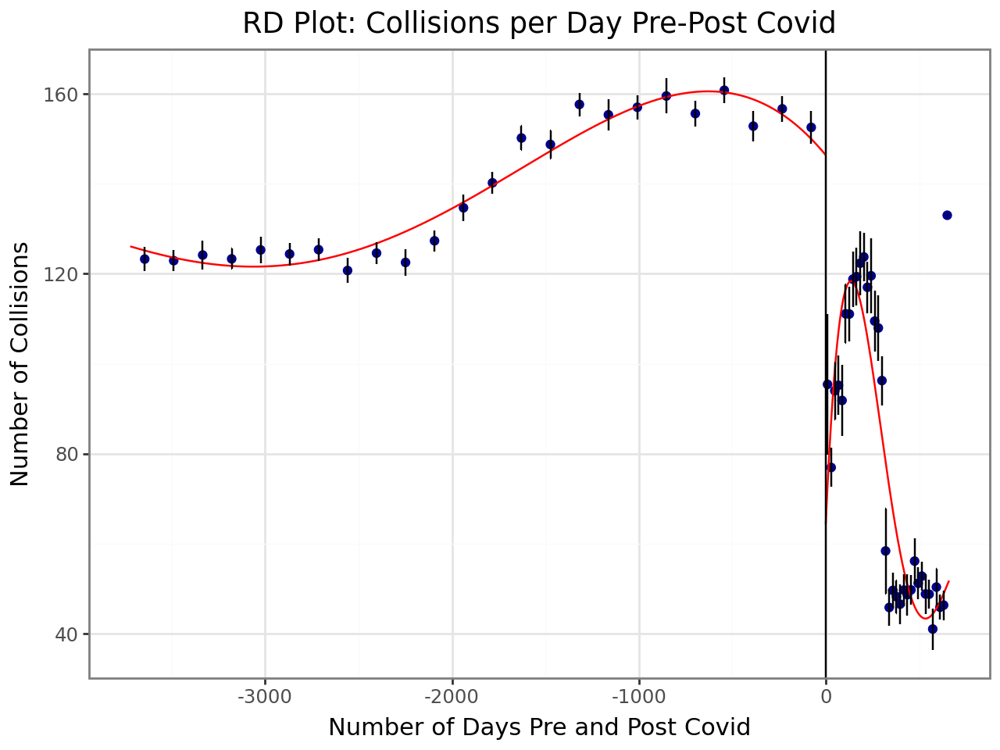

Call: rdrobust
Number of Observations:                  4383
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                    mserd
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          3722        661
Number of Unique Obs.           3722        661
Number of Effective Obs.         109        110
Bandwidth Estimation         109.128    109.128
Bandwidth Bias               169.188    169.188
rho (h/b)                      0.645      0.645

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional     -68.128    4.746  -14.355   9.889e-47 [-77.429, -58.826]
Bias-Corrected   -68.202    4.746  -14.371   7.897e-47   [-77.503, -58.9]
Robust           -68.202    5

In [171]:
### isntead of testing effectiveness of vision zero, test effect of pandemic
covid_effects = dfin.groupby(["postcovid"])["dr_number"].count().reset_index(name='Collisions')
covid_effects

# y = number of collisions
# x = num of days pre-post Vision Zero

num_collisions_covid = covid_effects["Collisions"]
days_coll_covid = covid_effects.postcovid.dt.days

# ### rdplot with 95% confidence intervals
rdplot(y=num_collisions_covid, x=days_coll_covid, binselect="es", ci=95,
         title="RD Plot: Collisions per Day Pre-Post Covid",
         y_label="Number of Collisions",
         x_label="Number of Days Pre and Post Covid")

### rdrobust with all estimates
print(rdrobust(y=num_collisions_covid, x=days_coll_covid, all=True))

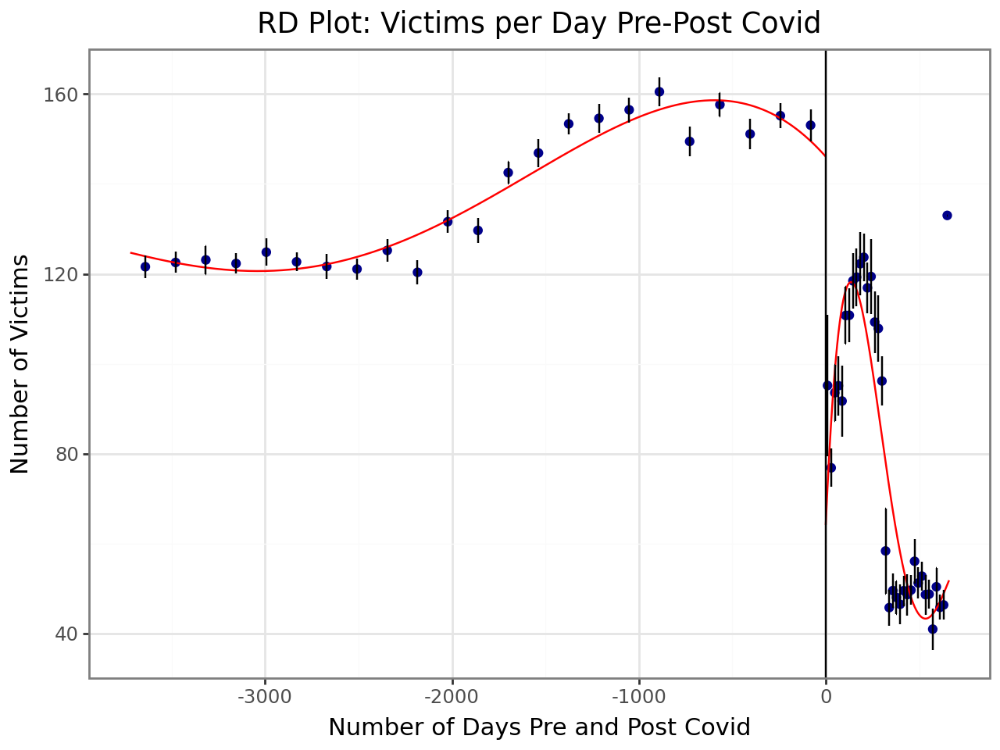

Call: rdrobust
Number of Observations:                  4383
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                    mserd
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          3722        661
Number of Unique Obs.           3722        661
Number of Effective Obs.         109        110
Bandwidth Estimation         109.719    109.719
Bandwidth Bias               170.018    170.018
rho (h/b)                      0.645      0.645

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional     -68.213    4.722  -14.445   2.701e-47 [-77.468, -58.957]
Bias-Corrected    -68.34    4.722  -14.472   1.825e-47 [-77.596, -59.085]
Robust            -68.34    5

In [172]:
### isntead of testing effectiveness of vision zero, test effect of pandemic
covid_effects_victims = pd.DataFrame(dfin.groupby(["postcovid"])["victim"].sum()).reset_index()
covid_effects_victims

# y = number of victims
# x = num of days pre-post Vision Zero

num_victims_covid = covid_effects_victims["victim"]
days_victims_covid = covid_effects_victims.postcovid.dt.days

# ### rdplot with 95% confidence intervals
rdplot(y=num_victims_covid, x=days_victims_covid, binselect="es", ci=95,
         title="RD Plot: Victims per Day Pre-Post Covid",
         y_label="Number of Victims",
         x_label="Number of Days Pre and Post Covid")

### rdrobust with all estimates
print(rdrobust(y=num_victims_covid, x=days_victims_covid, all=True))

There is a sharp decline in the number of collisions and victims after the pandemic was declared by the WHO. This is reflected in the statistical tests. Thus, while it seems like there was an upwards trend of collisions and the number of victims even after Vision Zero was signed, the Covid-19 pandemic was able to disrupt the trend.

However, the language of Vision Zero focused on severe and fatal injuries rather than the number of collisions or the number of victims.

#### Fatal Collisions Only

"Vision Zero is a strategy to eliminate all traffic fatalities and severe injuries, while increasing safe, healthy, equitable mobility for all." This is the first line the [Vision Zero website](https://visionzeronetwork.org/about/what-is-vision-zero/) uses to describe the project. Thus, I decided to repeat the analyses, this time focusing on MO codes that include fatal or severe injuries. This may be a better metric to assess the success or failure of Vision Zero.

<ipython-input-173-2f24d441f838>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<ipython-input-173-2f24d441f838>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


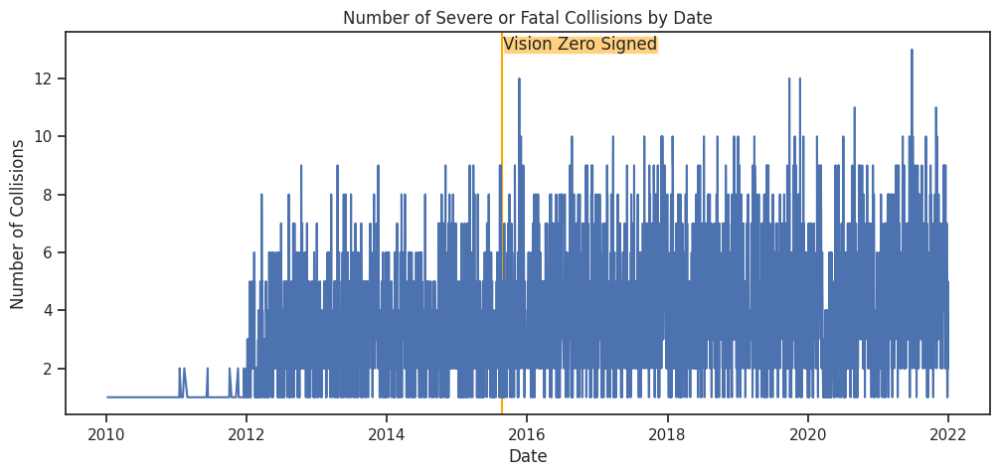

In [173]:
sev_fat = injuries[injuries["mo_code_clean"].isin(["3024","3027"])] ### duplicated dr_numbers
sev_fat.loc[:,'date_occurred_dt'] = sev_fat['dttm_occurred'].dt.date
sev_fat.loc[:,"pre_post_vision_zero"] = sev_fat["dttm_occurred"].dt.date-datetime.date(2015,8,24)

sev_fat_collisions = pd.DataFrame(sev_fat.groupby(['date_occurred_dt']).dr_number.nunique()).rename(columns={"dr_number":"NumCollisions"}).sort_index()

sev_fat_col_fig = plt.figure(figsize=(12,5))

plt.axvline(pd.to_datetime("2015-08-24"), color="orange")
plt.annotate("Vision Zero Signed", (pd.to_datetime("2015-08-30"),13),
             bbox=dict(boxstyle="square", fc="orange", alpha=0.5, pad=0))

plt.plot(sev_fat_collisions)
plt.xlabel("Date")
plt.ylabel("Number of Collisions")
plt.title('Number of Severe or Fatal Collisions by Date')
plt.show()

In [174]:
max(sev_fat_collisions.NumCollisions)

13

We see that the maximum number of fatal or severe collisions per day was 13 collisions. This is a very small number in statistics, epsecially significant testing. I can run the analysis through the functions as before, but the tests may be inconclusive due to the small numbers.

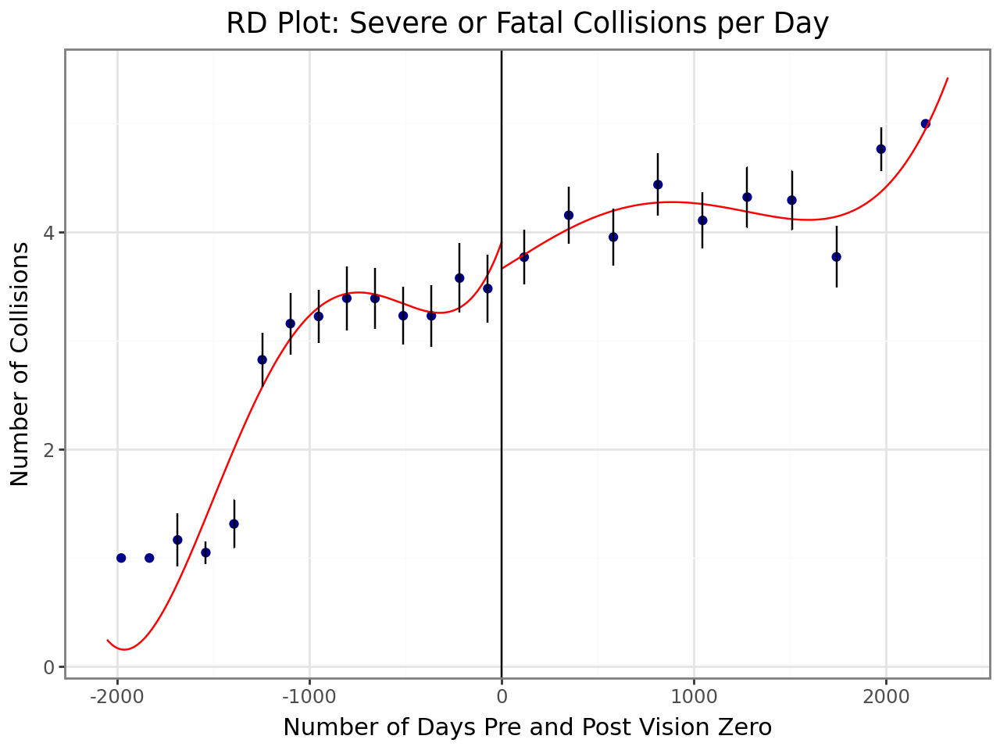

Call: rdrobust
Number of Observations:                  3584
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                    mserd
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          1315       2269
Number of Unique Obs.           1315       2269
Number of Effective Obs.         400        410
Bandwidth Estimation         421.426    421.426
Bandwidth Bias               757.575    757.575
rho (h/b)                      0.556      0.556

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional      -0.063    0.284   -0.223   8.236e-01    [-0.621, 0.494]
Bias-Corrected    -0.174    0.284   -0.611   5.413e-01    [-0.731, 0.384]
Robust            -0.174    0

In [175]:
sev_fat_vz = sev_fat.groupby(["pre_post_vision_zero"])["dr_number"].nunique().reset_index(name='Collisions')
sev_fat_vz

# # y = number of collisions
# # x = num of days pre-post Vision Zero

num_collisions_sev_fat = sev_fat_vz["Collisions"]
days_coll_sev_fat = sev_fat_vz.pre_post_vision_zero.dt.days

# ### rdplot with 95% confidence intervals
rdplot(y=num_collisions_sev_fat, x=days_coll_sev_fat, binselect="es", ci=95,
         title="RD Plot: Severe or Fatal Collisions per Day",
         y_label="Number of Collisions",
         x_label="Number of Days Pre and Post Vision Zero")

### rdrobust with all estimates
print(rdrobust(y=num_collisions_sev_fat, x=days_coll_sev_fat, all=True))

In [176]:
print(f'{min(sev_fat_vz.pre_post_vision_zero)}')
print(f'{max(sev_fat_vz.pre_post_vision_zero)}')
print(f'{max(sev_fat_vz.Collisions)}')

-2054 days +00:00:00
2321 days 00:00:00
13


We see that in general, the number of severe or fatal collisions per day increased despite an initial drop after Vision Zero was signed. The increase is not statistically significant. In general, there are 3 or 4 fatal/severe collisions in a day.

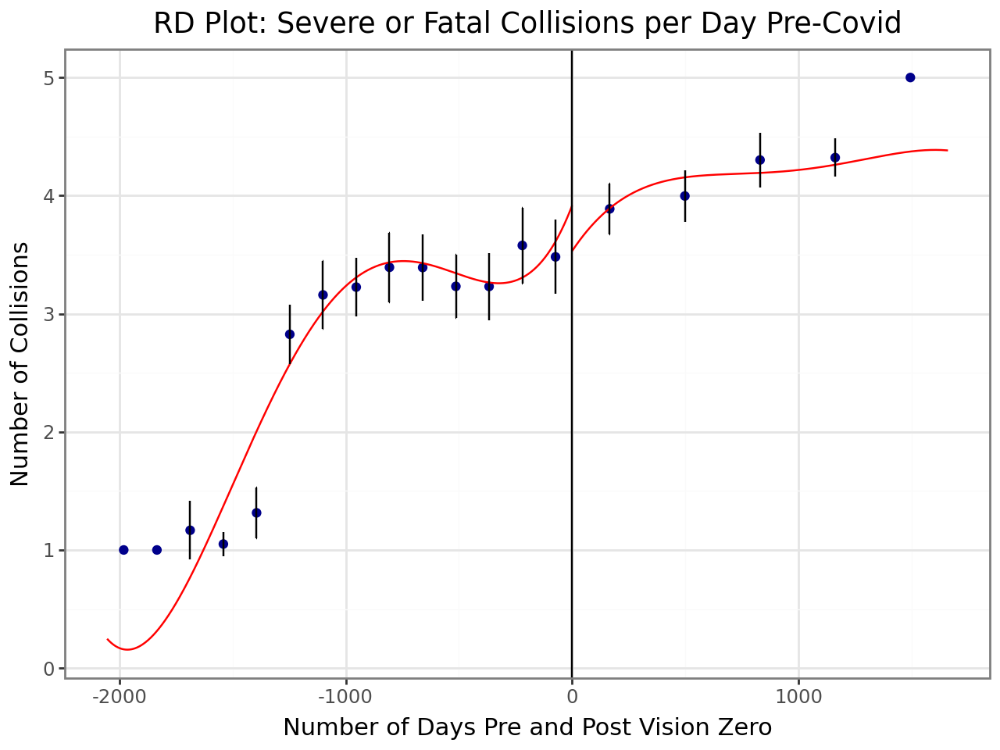

Call: rdrobust
Number of Observations:                  2944
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                    mserd
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          1315       1629
Number of Unique Obs.           1315       1629
Number of Effective Obs.         391        401
Bandwidth Estimation          412.21     412.21
Bandwidth Bias               707.135    707.135
rho (h/b)                      0.583      0.583

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional      -0.061    0.288   -0.212   8.320e-01    [-0.624, 0.502]
Bias-Corrected    -0.162    0.288   -0.564   5.729e-01    [-0.726, 0.401]
Robust            -0.162    0

In [177]:
sev_fat_precovid = sev_fat[sev_fat["date_occurred_dt"]<datetime.date(2020,3,11)]

sev_fat_vz_precovid = sev_fat_precovid.groupby(["pre_post_vision_zero"])["dr_number"].nunique().reset_index(name='Collisions')
sev_fat_vz_precovid

# # y = number of collisions
# # x = num of days pre-post Vision Zero

num_collisions_sev_fat_precovid = sev_fat_vz_precovid["Collisions"]
days_coll_sev_fat_precovid = sev_fat_vz_precovid.pre_post_vision_zero.dt.days

# ### rdplot with 95% confidence intervals
rdplot(y=num_collisions_sev_fat_precovid, x=days_coll_sev_fat_precovid, binselect="es", ci=95,
         title="RD Plot: Severe or Fatal Collisions per Day Pre-Covid",
         y_label="Number of Collisions",
         x_label="Number of Days Pre and Post Vision Zero")

### rdrobust with all estimates
print(rdrobust(y=num_collisions_sev_fat_precovid, x=days_coll_sev_fat_precovid, all=True))

Even when we discount the days after the pandemic was occurred, we still see an increase in the number of severe or fatal collisions, but again, these were not statistically significant.

<ipython-input-178-c5a8d556c7bd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


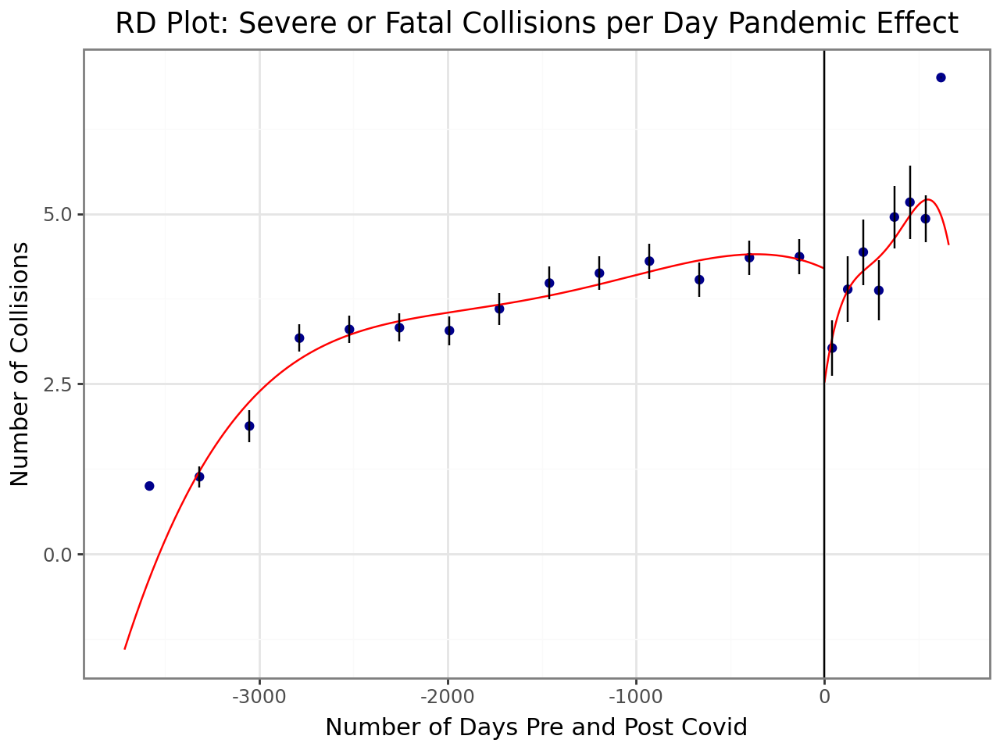

Call: rdrobust
Number of Observations:                  3584
Polynomial Order Est. (p):                  1
Polynomial Order Bias (q):                  2
Kernel:                            Triangular
Bandwidth Selection:                    mserd
Var-Cov Estimator:                         NN

                                Left      Right
------------------------------------------------
Number of Observations          2944        640
Number of Unique Obs.           2944        640
Number of Effective Obs.         160        153
Bandwidth Estimation         161.531    161.531
Bandwidth Bias               277.168    277.168
rho (h/b)                      0.583      0.583

Method             Coef.     S.E.   t-stat    P>|t|       95% CI      
-------------------------------------------------------------------------
Conventional      -2.087    0.474   -4.406   1.053e-05   [-3.016, -1.159]
Bias-Corrected     -2.24    0.474   -4.729   2.261e-06   [-3.169, -1.312]
Robust             -2.24    0

In [178]:
sev_fat.loc[:,"postcovid"] = sev_fat["dttm_occurred"].dt.date-datetime.date(2020,3,11)

sev_fat_cov = sev_fat.groupby(["postcovid"])["dr_number"].nunique().reset_index(name='Collisions')
sev_fat_cov

# # y = number of collisions
# # x = num of days pre-post Vision Zero

num_collisions_sev_fat_cov = sev_fat_cov["Collisions"]
days_coll_sev_fat_cov = sev_fat_cov.postcovid.dt.days

# ### rdplot with 95% confidence intervals
rdplot(y=num_collisions_sev_fat_cov, x=days_coll_sev_fat_cov, binselect="es", ci=95,
         title="RD Plot: Severe or Fatal Collisions per Day Pandemic Effect",
         y_label="Number of Collisions",
         x_label="Number of Days Pre and Post Covid")

### rdrobust with all estimates
print(rdrobust(y=num_collisions_sev_fat_cov, x=days_coll_sev_fat_cov, all=True))

Interestingly enough, the number of Severe or Fatal collisions had an immediate decrease after the pandemic was declared, but it quickly climbed up. There is a statistically significant difference via this regression discontinuity analysis, so the number of severe or fatal collisions does differ, and it looks like it continues to increase; however, when we view the y-axis and notice the scale, the dots are generally between 2.5 and 5, meaning that even when the slope is different, the number of collisions is still around 3-5 fatal/severe collisions a day.

## Conclusion

In [179]:
number_collisions_nocovid["Collisions"].describe()

,Collisions
count,3721.000000
mean,139.378662
std,23.652283
min,68.000000
25%,122.000000
50%,138.000000
75%,156.000000
max,230.000000


In [180]:
sev_fat_vz_precovid["Collisions"].describe()

,Collisions
count,2944.000000
mean,3.723166
std,1.979454
min,1.000000
25%,2.000000
50%,3.000000
75%,5.000000
max,12.000000


In [181]:
3.72/139.38

0.026689625484287563

In [182]:
3.72*365

1357.8000000000002

While LA has a lot of collisions in general, the number of severe or fatal injuries from collisions, in comparison, is "rare." There are about 139 collisions a day (prior to Covid) and of them, only 4 of them are severe/fatal collisions on average. This means that only about 2% of a LA collisions in a day would  contain severe or fatal injuries. However, this number can add up. Under the assumption that there's only one person with severe or fatal injuries when the relevant MO codes appear on the collision report, that means there will be at least 1,358 people affected per year, and this number is projected to increase as shown by the analysis of this data.

Not only that, but the number of collisions have only increased by the year  and the proportion of severe and fatal injuries have not changed much. There is actually a statistically significant increase in the overall number of collisions and victims post-Vision Zero enactment.

If we look at the same data, there is a drop in the number of collisions and victims when Covid-19 was declared a pandemic by the WHO. There was already the start of a trend for the decrease prior to the pandemic declaration, and this may be explained by people hearing news of the pandemic, and starting to decrease their outdoor activities. Once the pandemic was officially declared, there was a sharp decline in the number of collisions. When we take a look at the number of severe or fatal injuries, there were still about 3-5 collisions. Even if Covid-19 lowered the total amount of collisions, the number of severe or fatal injuries remained about the same.

This implies that Vision Zero isn't effective at decreasing the number of collisions or the number of severe or fatal wounds. Removing the number of cars on the streets may be effective at decreasing the number of collisions overall, but not the number of severe or fatal injuries from collisions. And if the trends continue, then there will be more and more collisions in the coming years.